# Projet 6 (partie 2: Images: SIFT, ORG, CNN): Classifiez automatiquement des biens de consommation

## Description: 

L’entreprise "Place de marché”, qui souhaite lancer une marketplace e-commerce. Sur la place de marché, des vendeurs proposent des articles à des acheteurs en postant une photo et une description.

Pour l'instant, l'attribution de la catégorie d'un article est effectuée manuellement par les vendeurs et est donc peu fiable. De plus, le volume des articles est pour l’instant très petit.

Pour rendre l’expérience utilisateur des vendeurs (faciliter la mise en ligne de nouveaux articles) et des acheteurs (faciliter la recherche de produits) la plus fluide possible et dans l'optique d'un passage à l'échelle, il devient nécessaire d'automatiser cette tâche.

## Mission 
Dans cette étude, il s'agit de faire une étude de faisabilité d'un moteur de classification d'articles basé sur une image et une description. L'idée est donc d'automatiser cette classification pour l'attribution de la catégorie de l'article afin de faciliter le travail des vendeurs. 


## Objectif:
L'objectif est d'analyser le jeu de données en réalisant un prétraitement des images, des descriptions des différents produits qui sont mis en ligne. Puis de faire une réduction de dimension suivie d'un clustering afin de mieux séparer les différentes images. 


# Chargement des données et observations

In [20]:
#Importation des librairies nécessaires à l'étude du projet 6

#Librairies diverses
import os
import datetime as dt
import time
import string
import json
import pickle
from IPython.core.display import display, HTML

# Outils mathématiques et manipulation de données
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn

# Traitement images
import PIL
from PIL import Image, ImageOps, ImageFilter
import cv2
from scipy.ndimage import gaussian_filter
import cv2 

# Réduction dimension
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE


# CNN Applications Keras
import keras
from keras.preprocessing import image
import tensorflow as tf

# Importation de fonctions python
import outils_visu
import outils_data
import outils_nlp
import outils_acp
import outils_segmentation
import outils_images

# Clusterins
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
#Quelques options d'affichages
pd.set_option("display.max_rows", 101)
pd.options.display.max_columns = 999

# Warnings
import warnings

pd.options.mode.chained_assignment = None  # default='warn'
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

In [21]:
#Importation de Data
data_all = pd.read_csv('Data/flipkart_com-ecommerce_sample_1050.csv')

In [22]:
# Nombre aléatoire pour la reproductibilité des résultats
seed = 21

In [23]:
data_all

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,958f54f4c46b53c8a0a9b8167d9140bc,2015-12-01 10:15:43 +0000,http://www.flipkart.com/oren-empower-extra-lar...,Oren Empower Extra Large Self Adhesive Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE88ZGTX65GH4V,1399.0,999.0,958f54f4c46b53c8a0a9b8167d9140bc.jpg,False,Oren Empower Extra Large Self Adhesive Sticker...,No rating available,No rating available,Oren Empower,"{""product_specification""=>[{""key""=>""Number of ..."
1046,fd6cbcc22efb6b761bd564c28928483c,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-large-vinyl...,Wallmantra Large Vinyl Sticker Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIEC889ZD5GDCVQ,4930.0,1896.0,fd6cbcc22efb6b761bd564c28928483c.jpg,False,Wallmantra Large Vinyl Sticker Sticker (Pack o...,No rating available,No rating available,Wallmantra,"{""product_specification""=>[{""key""=>""Number of ..."
1047,5912e037d12774bb73a2048f35a00009,2015-12-01 10:15:43 +0000,http://www.flipkart.com/uberlyfe-extra-large-p...,Uberlyfe Extra Large Pigmented Polyvinyl Films...,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE5UVGW2JWVWCT,4500.0,1449.0,5912e037d12774bb73a2048f35a00009.jpg,False,Buy Uberlyfe Extra Large Pigmented Polyvinyl F...,No rating available,No rating available,Uberlyfe,"{""product_specification""=>[{""key""=>""Number of ..."
1048,c3edc504d1b4f0ba6224fa53a43a7ad6,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-medium-viny...,Wallmantra Medium Vinyl Sticker Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >.

In [24]:
# Taille : nombre de lignes/colonnes
nRow, nVar = data_all.shape
print(f'Le jeu de données contient {nRow} lignes et {nVar} variables.')

Le jeu de données contient 1050 lignes et 15 variables.


In [25]:
# Vue d'ensemble du jeu de données
outils_data.resume_datasets([data_all], ['Data'])

Les données se décomposent en 1 fichier(s)


Jeu de données,Nb lignes,Nb variables,Nb nan,Nb var avec nan,Var avec nan
Data,1050,15,341,4,"retail_price, discounted_price, brand, product_specifications"


## Pré-traitement des images 

**Image_loc** - pour la localisation de chaque image

- Dans la dataframe, la variable '**image**' est constituée de la concaténation du numéro de l'identifiant unique (ex : 02127f52e96fb72c66bf081d25104ef8) suivi de '.jpg' : **02127f52e96fb72c66bf081d25104ef8.jpg**.Nous allons donc ajouter une nouvelle varaible:  **image_loc** contenant le chemin du répertoire de stockage des images ainsi que du nom du fichier image pour des appels moins verbeux dans le code.

In [26]:
# Ajout variable image_loc
# ex : data/Images/02127f52e96fb72c66bf081d25104ef8.jpg
path = 'Data/Images/'
data_all['image_loc'] = [path + row for row in data_all['image']]

**Récupération de la première sous-catégorie**

In [27]:
# Découpe les sous-catégories dans des nouvelles variables du dataframe
work = data_all['product_category_tree'].str.split(' >> ', expand=True)
data_all['Categorie_1'] = work[0]
# Nettoye les [" et "]
data_all.replace('\\["', '', regex=True, inplace=True)
data_all.replace('"\\]', '', regex=True, inplace=True)

**Dataframe de travail pour le traitement des images**

- Pour effectuer la classification des catégories en fonction des images, nous garderons :
    - **image** : le nom de l'image,
    - **image_loc** : le nom de l'image avec sa localisation dans le répertoire de stockage des images,
    - **Categorie_1** : la première sous-catégorie.

In [28]:
data = data_all.copy()
data = data[['image', 'image_loc', 'Categorie_1']]
data.head()

,image,image_loc,Categorie_1
0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Data/Images/55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing
1,7b72c92c2f6c40268628ec5f14c6d590.jpg,Data/Images/7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care
2,64d5d4a258243731dc7bbb1eef49ad74.jpg,Data/Images/64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care
3,d4684dcdc759dd9cdf41504698d737d8.jpg,Data/Images/d4684dcdc759dd9cdf41504698d737d8.jpg,Home Furnishing
4,6325b6870c54cd47be6ebfbffa620ec7.jpg,Data/Images/6325b6870c54cd47be6ebfbffa620ec7.jpg,Home Furnishing


## Analyse exploratoire des images

In [29]:
#Nombres d'images par catégories
df_image_par_cat = data.groupby('Categorie_1').agg({'image' : 'count'})
df_image_par_cat

,image
Categorie_1,
Baby Care,150
Beauty and Personal Care,150
Computers,150
Home Decor & Festive Needs,150
Home Furnishing,150
Kitchen & Dining,150
Watches,150


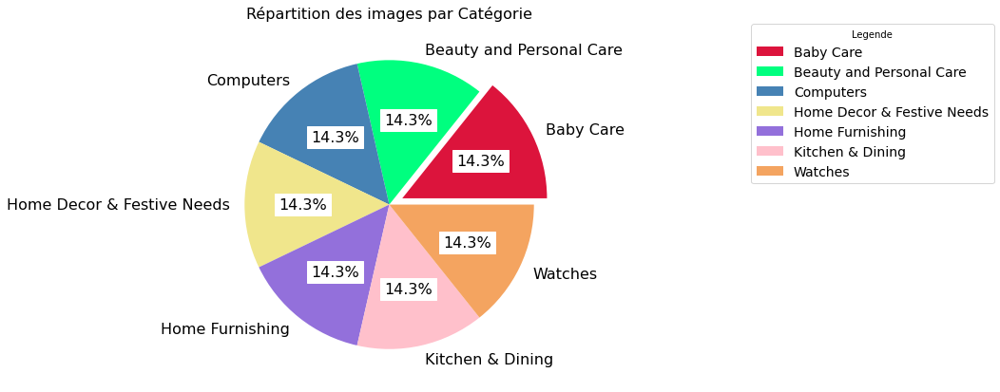

In [30]:
df_visu = df_image_par_cat.reset_index()
outils_visu.trace_pieplot(df_visu, 'Categorie_1',
                          'Répartition des images par Catégorie',
                          'Legende',
                          ['Crimson', 'SpringGreen', 'SteelBlue', 'Khaki',
                           'MediumPurple', 'pink', 'SandyBrown'])

Nous pouvons observer une répartition de 150 images par catgégories (soit 14.3%)

**Visualisation d'un échantillon d'images**

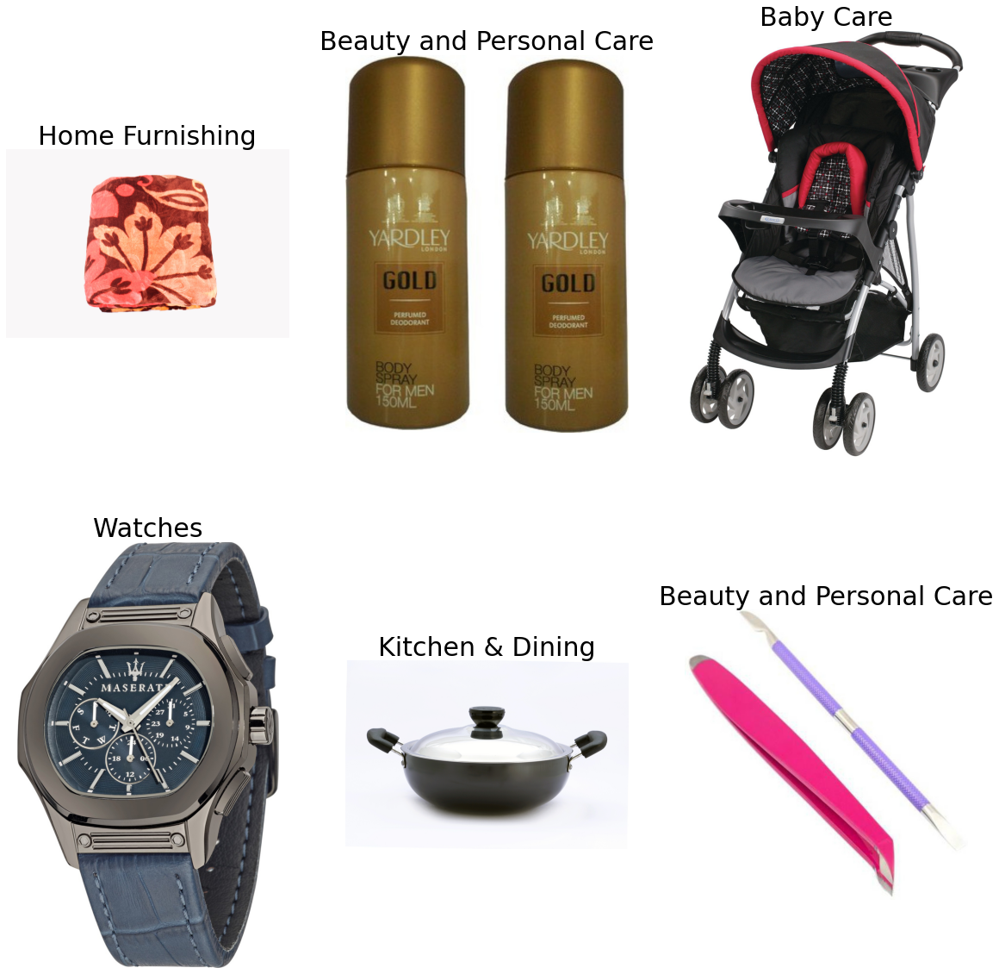

In [31]:
# Sélection de 6 images au hasard
df_visu_img = data.sample(6).reset_index()
plt.figure(figsize=(20, 20))
for i in range(6):
    plt.subplot(2, 3, i + 1)
    # Charge l'image comme matrice de pixels
    img = np.array(Image.open(df_visu_img['image_loc'][i]))
    plt.imshow(img)
    plt.title(df_visu_img['Categorie_1'][i], fontsize=30)
    plt.axis('off')

**Taille des images**

*Largeur*

In [32]:
# Largeur des images
data['Largeur_img'] = [Image.open(row).size[0] for row in data['image_loc']]

In [33]:
# Plage des largeurs des images
df_ditrib_largeur = outils_data.distribution_variables_plages(
    data, 'Largeur_img', [0, 500, 1000, 5000, 10000])
df_ditrib_largeur.style.hide_index()

Plage,nb_données,%_données
"(0, 500]",146,13.904762
"(500, 1000]",273,26.000000
"(1000, 5000]",622,59.238095
"(5000, 10000]",9,0.857143


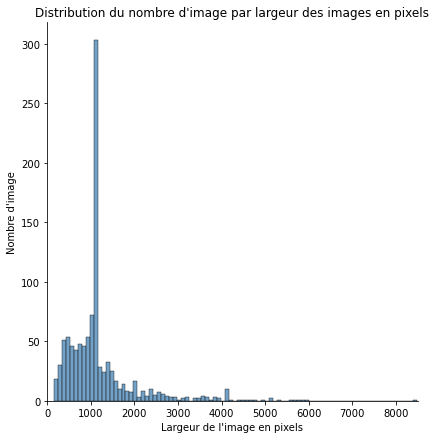

In [34]:
# Répartition du nombre d'images par taille de l'image en pixel
sns.displot(data['Largeur_img'], color='SteelBlue', height=6)
plt.title('Distribution du nombre d\'image par largeur des images en pixels')
plt.xlim(0, 8500)
plt.xlabel('Largeur de l\'image en pixels')
plt.ylabel('Nombre d\'image')
plt.show()

***Hauteur des images***

In [35]:
# Hauteur des images
data['Hauteur_img'] = [Image.open(row).size[1] for row in data['image_loc']]

In [36]:
# Plage des hauteurs des images
df_ditrib_hauteur = outils_data.distribution_variables_plages(
    data, 'Hauteur_img', [0, 500, 1000, 5000, 11100])
df_ditrib_largeur.style.hide_index()

Plage,nb_données,%_données
"(0, 500]",146,13.904762
"(500, 1000]",273,26.000000
"(1000, 5000]",622,59.238095
"(5000, 10000]",9,0.857143


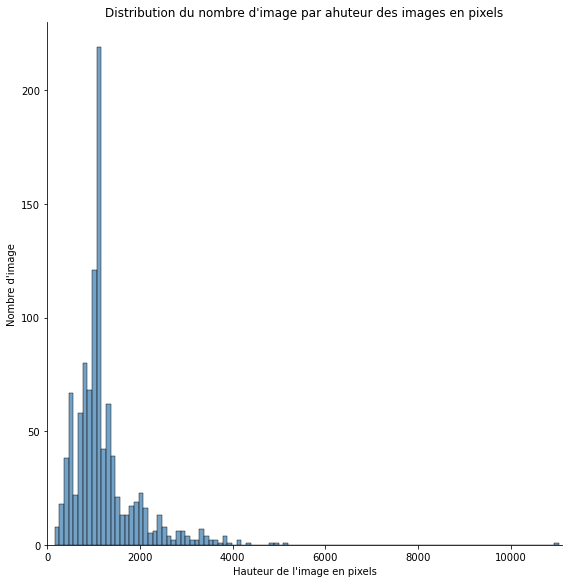

In [37]:
# Répartition du nombre d'images par taille de l'image en pixel
sns.displot(data['Hauteur_img'], color='SteelBlue', height=8)
plt.title('Distribution du nombre d\'image par ahuteur des images en pixels')
plt.xlim(0, 11100)
plt.xlabel('Hauteur de l\'image en pixels')
plt.ylabel('Nombre d\'image')
plt.show()

***Nota***
***
Nous pouvons voir que les largeurs et les longueurs ne sont pas uniformes, ni réparties de manières homogènes. Il convient donc de bien les uniformiser avant de les utiliser dans les algorithmes de traitements d'images.

***Tailles des images***

In [38]:
# Taille des images
data['Taille_img'] = [(Image.open(row).size[0] * Image.open(row).size[1])
                      for row in data['image_loc']]

In [39]:
data

,image,image_loc,Categorie_1,Largeur_img,Hauteur_img,Taille_img
0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Data/Images/55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing,3600,3600,12960000
1,7b72c92c2f6c40268628ec5f14c6d590.jpg,Data/Images/7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care,2388,1293,3087684
2,64d5d4a258243731dc7bbb1eef49ad74.jpg,Data/Images/64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care,982,729,715878
3,d4684dcdc759dd9cdf41504698d737d8.jpg,Data/Images/d4684dcdc759dd9cdf41504698d737d8.jpg,Home Furnishing,1100,831,914100
4,6325b6870c54cd47be6ebfbffa620ec7.jpg,Data/Images/6325b6870c54cd47be6ebfbffa620ec7.jpg,Home Furnishing,2670,2088,5574960
...,...,...,...,...,...,...
1045,958f54f4c46b53c8a0a9b8167d9140bc.jpg,Data/Images/958f54f4c46b53c8a0a9b8167d9140bc.jpg,Baby Care,1100,937,1030700
1046,fd6cbcc22efb6b761bd564c28928483c.jpg,Data/Images/fd6cbcc22efb6b761bd564c28928483c.jpg,Baby Care,900,1200,1080000
1047,5912e037d12774bb73a2048f35a00009.jpg,Data/Images/5912e037d12774bb73a2048f35a00009.jpg,Baby Care,1100,1011,1112100
1048,c3edc504d1b4f0ba6224fa53a43a7ad6.jpg,Data/Images/c3edc504d1b4f0ba6224fa53a43a7ad6.jpg,Baby Care,900,1200,1080000


In [40]:
# Plage des largeurs des images
df_ditrib_taille = outils_data.distribution_variables_plages(
    data, 'Taille_img', [0, 500000, 1000000, 5000000, 10000000,
                         100000000])
df_ditrib_taille.style.hide_index()

Plage,nb_données,%_données
"(0, 500000]",165,15.714286
"(500000, 1000000]",353,33.619048
"(1000000, 5000000]",447,42.571429
"(5000000, 10000000]",52,4.952381
"(10000000, 100000000]",33,3.142857


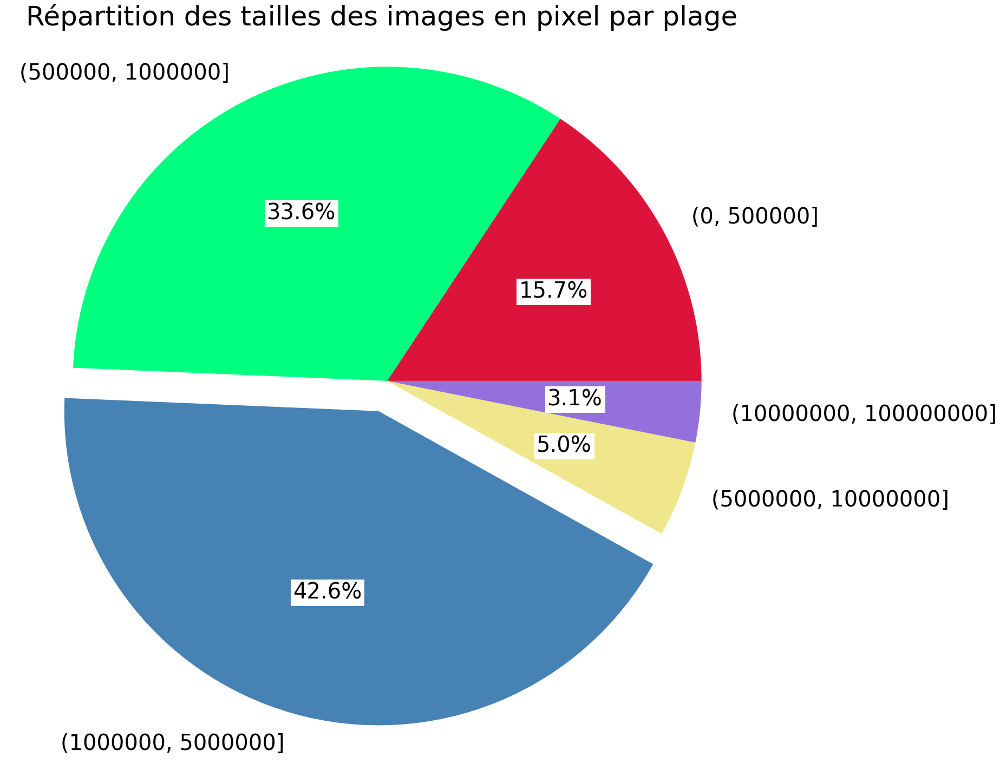

In [41]:
# Pieplot de visualisation
df_visu_taille = df_ditrib_taille[df_ditrib_taille['nb_données'] != 0]
plt.figure(figsize=(25, 25))
plt.pie(df_visu_taille['nb_données'],
        explode=(0, 0, 0.1, 0, 0),
        labels=df_visu_taille['Plage'],
        autopct='%1.1f%%',
        colors=['Crimson', 'SpringGreen', 'SteelBlue', 'Khaki',
                'MediumPurple', 'pink', 'SandyBrown', 'Aqua', 'Tomato',
                'Khaki'],
        textprops={'fontsize':40, 'color':'black',
                   'backgroundcolor':'w'})
plt.title('Répartition des tailles des images en pixel par plage',
          fontsize=50)
plt.axis('equal')
plt.show() 

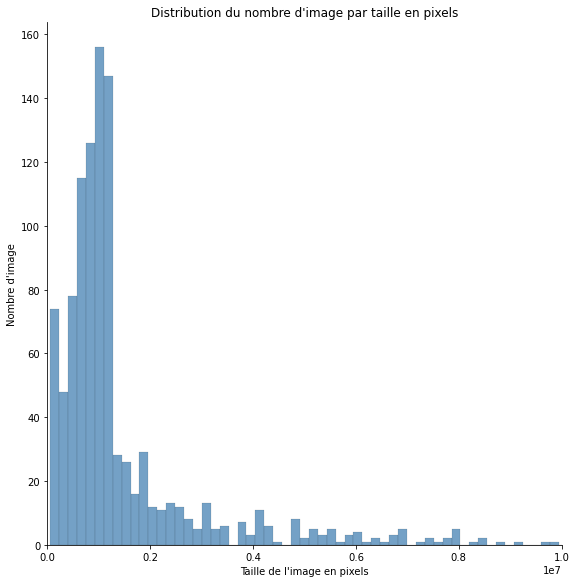

In [42]:
# Répartition du nombre d'images par taille de l'image en pixel
sns.displot(data['Taille_img'], color='SteelBlue', height=8)
plt.title('Distribution du nombre d\'image par taille en pixels')
plt.xlim(0, 10000000)
plt.xlabel('Taille de l\'image en pixels')
plt.ylabel('Nombre d\'image')
plt.show()

***Nota***
***
- Nous pouvons voir que les images sont de tailles très inégales, il convient donc de bien les uniformiser en les redimensionnant pour pouvoir utiliser les réseaux de neurones et les CNN de transfert learning. 
- Les tailles des images en entrées des réseux sont de 224 * 224, une partie du traitement des images sera donc de redimensionner les images en 224 * 224

In [43]:
# Quelques Statistiques descriptives de nos images
outils_data.stat_descriptives(data, ['Taille_img', 'Largeur_img','Hauteur_img', ])

Desc,Taille_img,Largeur_img,Hauteur_img
mean,1916300.213333,1196.570476,1220.038095
median,1015850.000000,1100.000000,1100.000000
var,15345750661385.326172,745917.580271,554260.293787
std,3917365.270355,863.665201,744.486597
skew,13.457143,2.845790,3.661225
kurtosis,289.371778,11.646568,31.760927
mode,0 928400,0 1100,0 1100
Min,58000,145,160
Max,93680328,8484,11042


** Format des images**

In [44]:
# Format des images
data['Format_img'] = [Image.open(row).mode for row in data['image_loc']]
data.groupby('Format_img').count()

,image,image_loc,Categorie_1,Largeur_img,Hauteur_img,Taille_img
Format_img,,,,,,
RGB,1050,1050,1050,1050,1050,1050


- Toutes les images sont au format RGB , cad 3*8-bit pixels, true color

[Source](https://pillow.readthedocs.io/en/stable/handbook/concepts.html)

## Pré-traitement des images

- **PILS** (Pyhton Imaging Library) et **OpenCV** (Open Compute Vision) sont des librairies qui comprennent un ensemble de méthodes permettant de charger, traiter les images (redimensionnement, filtres...).
- Ces librairies seront utilisées pour le pré-traitement des images.

[Source](https://opencv.org/)

- Le traitement sera effectué en 4 étapes :
    - redimensionnement en 224 * 224,
    - conversion de RGB (couleurs vraies) en niveaux de gris (pour Sift),
    - suppression du bruit,
    - égalisation de l'histogramme.

### Exemple détude

In [45]:
dim = (224, 224)

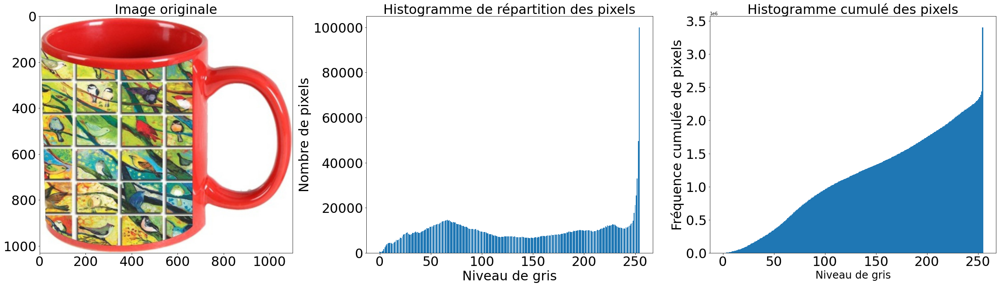

In [46]:
# Chargement de l'image originale comme matrice de pixels
img_orig = Image.open('data/Images/3c4ca34c50a5437a1bcc42b72fc1351f.jpg')
outils_images.afficher_image_histopixel(img_orig, 'Image originale')

**Correction de l'exposition (étirement de l'histogramme)**

- Corriger la luminosité (ou exposition) de l'image.
- Image sous-exposée ==> histogramme concentré à droite vers les niveaux de gris faible (255 = blanc).
- Image sur-exposée ==> histogramme concentré à gauche vers les niveaux de gris fort (0 = noir).

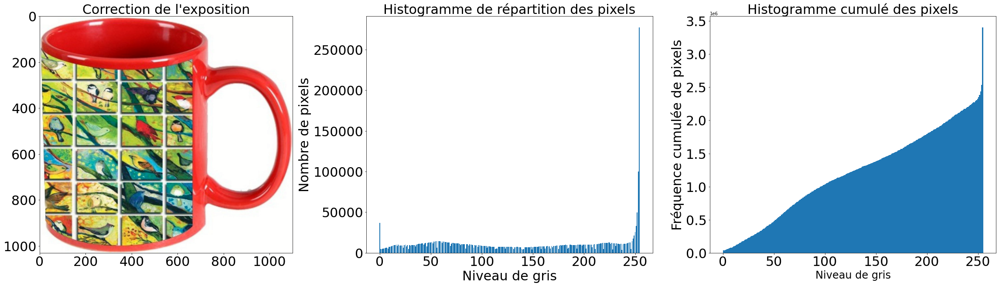

In [47]:
# Correction de l'exposition PILS
img_expo = ImageOps.autocontrast(img_orig, 1)
outils_images.afficher_image_histopixel(img_expo, 'Correction de l\'exposition')

**Correction du contraste**

*Le contraste caractérise la répartition de lumière dans une image : plus une image est contrastée, plus la différence de luminosité entre ses zones claires et sombres est importante. En général, une image peu contrastée est terne, tandis qu'une image trop contrastée est visuellement "agressive". Dans les deux cas, l'image manque de clarté car certains de ses détails seront peu, voire pas du tout,  visibles.*

*PILS*

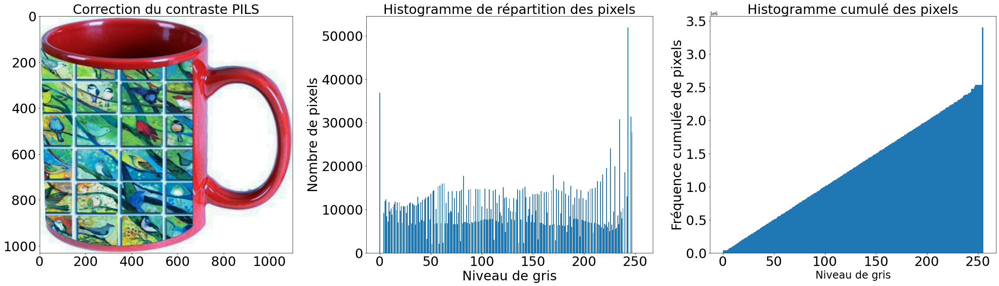

In [48]:
# Correction du contraste PILS
img_contr_pils = ImageOps.equalize(img_expo)
outils_images.afficher_image_histopixel(img_contr_pils,
                                        'Correction du contraste PILS')

*OpenCV*

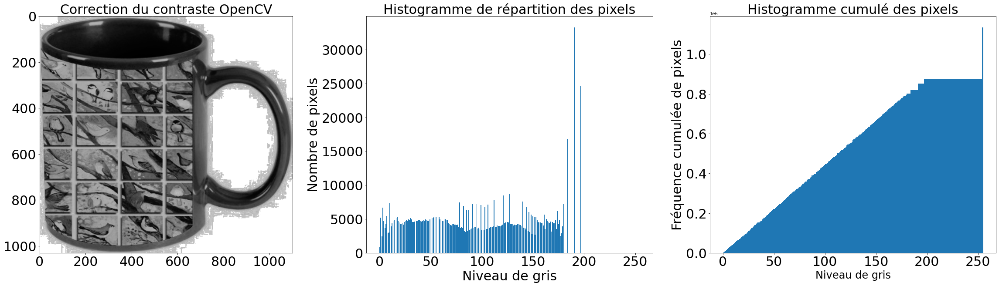

In [49]:
# Correction du contraste OpenCV méthode 1 : equalizeHist
img_expo_gris = cv2.cvtColor(np.array(img_expo), cv2.COLOR_BGR2GRAY)
img_contr_opencv = cv2.equalizeHist(img_expo_gris)
outils_images.afficher_image_histopixel(img_contr_opencv, 'Correction du contraste OpenCV')

*CLAHE*

**CLAHE** (Contrast Limited Adaptive Histogram Equalization) :
Dans ce cas, l'image est divisée en petits blocs appelés "tuiles" (tileSize est 8x8 par défaut dans OpenCV). Ensuite, chacun de ces blocs est égalisé en histogramme comme d'habitude. Ainsi, dans une petite zone, l'histogramme se limitera à une petite région (sauf s'il y a du bruit). Si le bruit est présent, il sera amplifié. Pour éviter cela, une limitation du contraste est appliquée. Si une case de l'histogramme est au-dessus de la limite de contraste spécifiée (par défaut 40 dans OpenCV), ces pixels sont coupés et distribués uniformément aux autres cases avant d'appliquer l'égalisation de l'histogramme. Après l'égalisation, l'interpolation bilinéaire est appliquée pour supprimer les artefacts sur les bords des tuiles.

[Source](https://docs.opencv.org/master/d5/daf/tutorial_py_histogram_equalization.html)

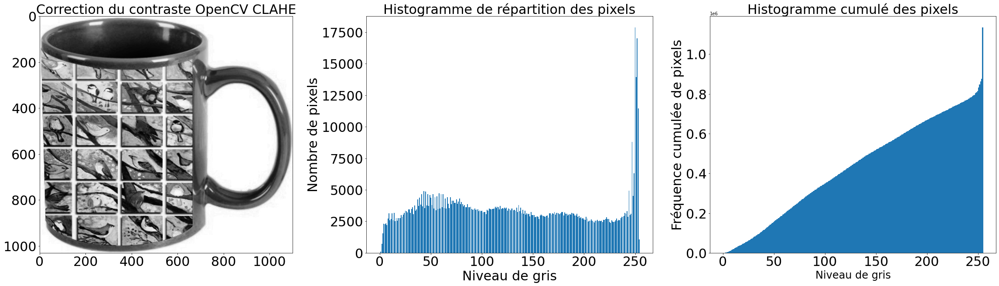

In [50]:
# Correction du contraste OpenCV méthode 2 : CLAHE
# img_expo_gris = cv2.cvtColor(np.array(img_expo), cv2.COLOR_BGR2GRAY)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(3, 3))
img_contr_clahe = clahe.apply(img_expo_gris)
outils_images.afficher_image_histopixel(img_contr_clahe,
                                        'Correction du contraste OpenCV CLAHE')

**Bilan** :
- La correction du contraste OpenCV avec méthode CLAHE donne un histogramme cumulé plus régulier, il sera utilisé dans le cadre du pré-traitement sur toutes les images.

**Redimensionnement en 224 * 224**

- en entrées des réseaux de neurones, les images doivent avoir la taille  224 * 224.
- Les différentes interpolations : [Source](https://medium.com/@wenrudong/what-is-opencvs-inter-area-actually-doing-282a626a09b3)

*PILS*

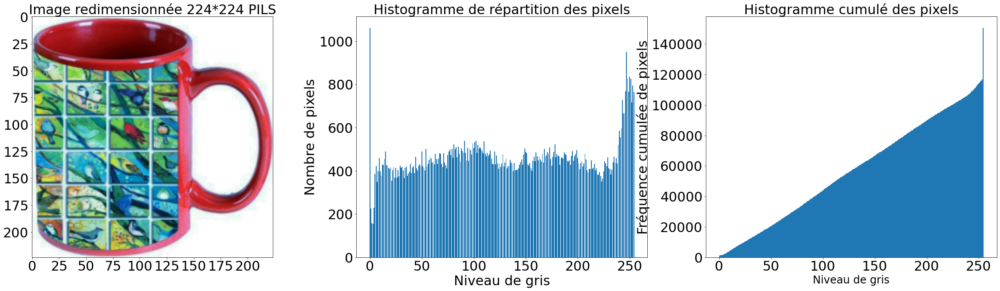

In [51]:
# Redimensionnement image contraste PILS
img_redim_pils = cv2.resize(np.array(img_contr_pils), dim,
                            interpolation=cv2.INTER_AREA)
outils_images.afficher_image_histopixel(img_redim_pils,'Image redimensionnée 224*224 PILS')

*OpenCV*

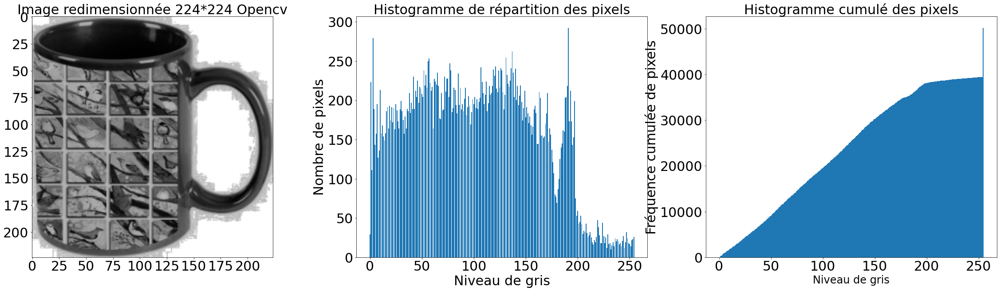

In [52]:
# Redimensionnement image contraste OpenCV
img_redim_opencv = cv2.resize(np.array(img_contr_opencv), dim,
                              interpolation=cv2.INTER_AREA)
outils_images.afficher_image_histopixel(img_redim_opencv,'Image redimensionnée 224*224 Opencv')

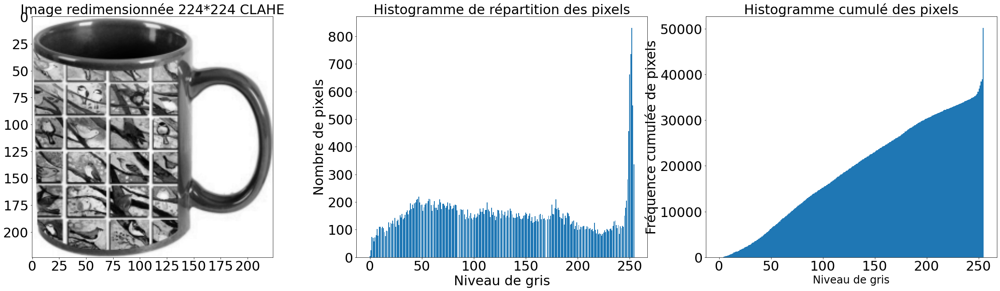

In [53]:
# Redimensionnement image contraste OpenCV CLAHE
img_redim_clahe = cv2.resize(np.array(img_contr_clahe), dim,
                             interpolation=cv2.INTER_AREA)
outils_images.afficher_image_histopixel(img_redim_clahe,
                                        'Image redimensionnée 224*224 CLAHE')

**Conversion de l'image en niveau de gris**

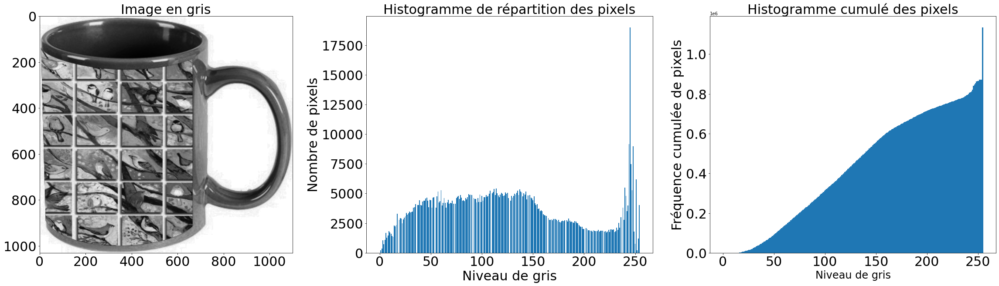

In [54]:
# Conversion de l'image en niveau de gris pour SIFT
img_gris = cv2.cvtColor(np.array(img_contr_pils), cv2.COLOR_RGB2GRAY)
outils_images.afficher_image_histopixel(img_gris, 'Image en gris')

#### Réduction du bruit**

- On observe l'apparition d'un bruit qui se rapproche du gaussien : apparition de carré gris.
- Pour améliorer la qualité des images, 3 filtres différents seront testés :
    - un **filtre gaussien**filtre linéaire dont les éléments du noyau de convolution sont déterminés selon la densité d'une loi gaussienne centrée à 2 dimensions),
    - un **filtre par lissage par moyennage** la valeur de chaque pixel est remplacée par la moyenne de son voisinage),
    - ou un **filtre par lissage médian** (la valeur de chaque pixel est remplacée par la médiane de son voisinage).
    - ou avec un algorithme **Non-local Means Denoising**  [Source](https://docs.opencv.org/master/d5/d69/tutorial_py_non_local_means.html)

##### FIltre gaussien

*PILS*

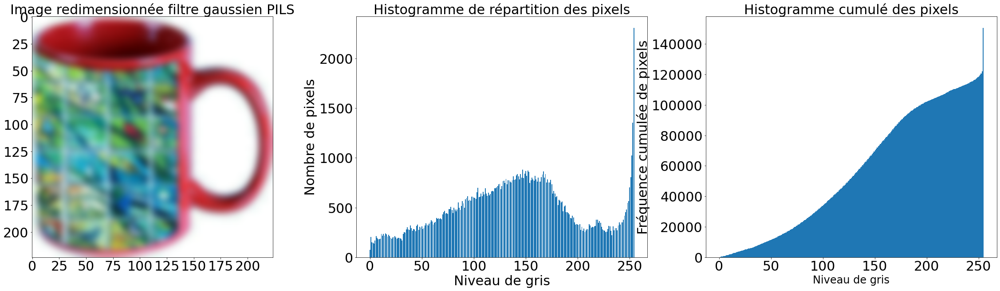

In [55]:
# Réduction du bruit filtre gaussien sur image correction contraste PILS
img_redim_pils_rgb = Image.fromarray(img_redim_pils, 'RGB')
img_gaus_pils = img_redim_pils_rgb.filter(ImageFilter.GaussianBlur(radius=3))
outils_images.afficher_image_histopixel(img_gaus_pils,'Image redimensionnée filtre gaussien PILS')

*OpenCV**

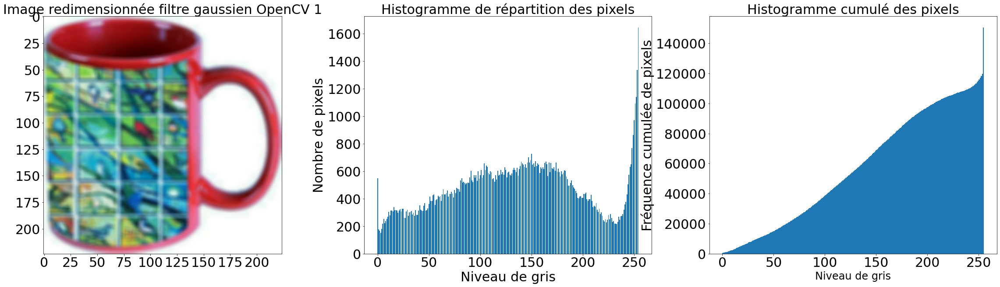

In [56]:
# Réduction du bruit filtre gaussien sur image correction contraste PILS
img_gaus_pils = cv2.GaussianBlur(img_redim_pils, (5, 5), cv2.BORDER_DEFAULT)
outils_images.afficher_image_histopixel(img_gaus_pils,'Image redimensionnée filtre gaussien OpenCV 1')

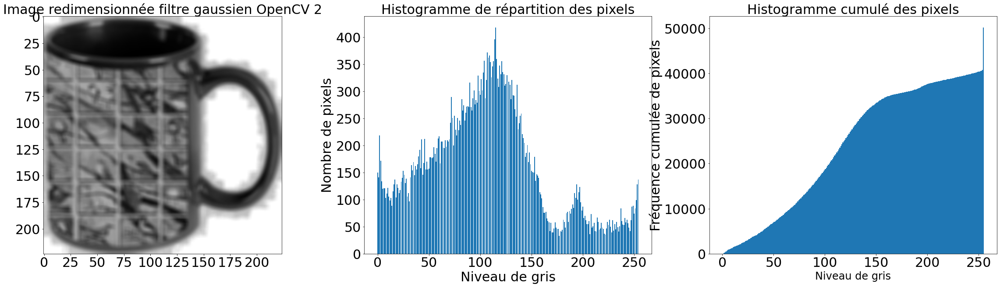

In [57]:
# Réduction du bruit filtre gaussien sur image correction contraste OpenCV
img_gaus_opencv = cv2.GaussianBlur(img_redim_opencv, (5, 5),
                                   cv2.BORDER_DEFAULT)
outils_images. afficher_image_histopixel(img_gaus_opencv,'Image redimensionnée filtre gaussien OpenCV 2')

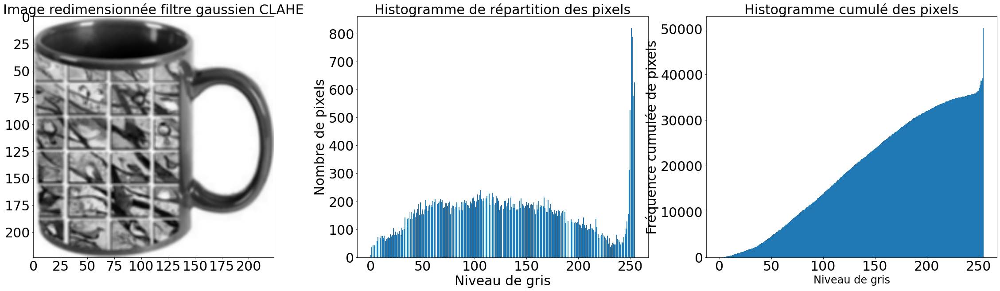

In [58]:
# Réduction du bruit filtre gaussien sur image correction contraste OpenCV
img_gaus_clahe = cv2.GaussianBlur(img_redim_clahe, (3, 3), cv2.BORDER_DEFAULT)
outils_images.afficher_image_histopixel(img_gaus_clahe,'Image redimensionnée filtre gaussien CLAHE')

*Scipy*

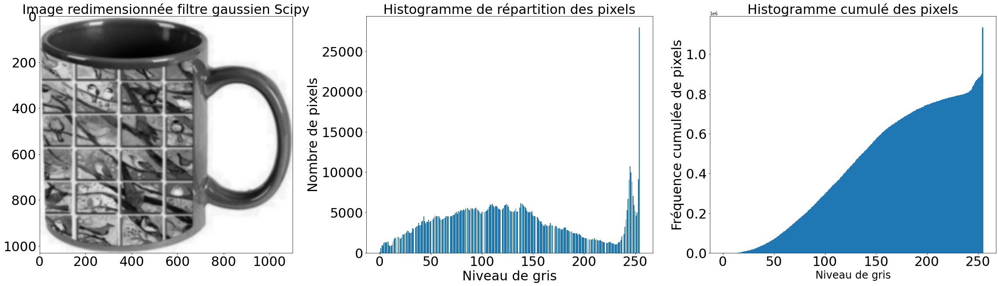

In [59]:
img_gaus_scipy = gaussian_filter(img_gris, sigma=3)
outils_images.afficher_image_histopixel(img_gaus_scipy,'Image redimensionnée filtre gaussien Scipy')

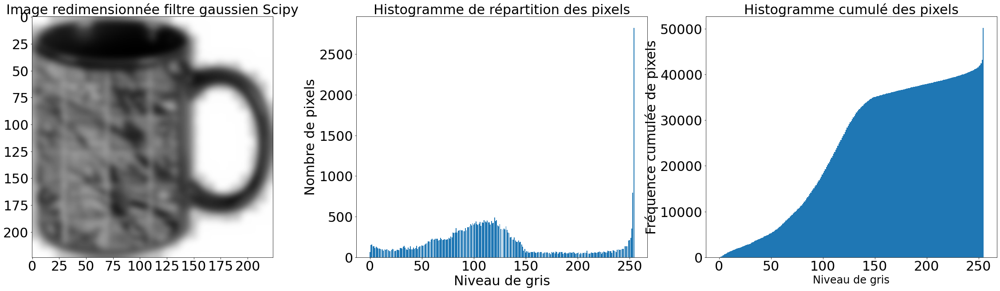

In [60]:
img_gaus_scipy2 = gaussian_filter(img_redim_opencv, sigma=3)
outils_images.afficher_image_histopixel(img_gaus_scipy2,'Image redimensionnée filtre gaussien Scipy')

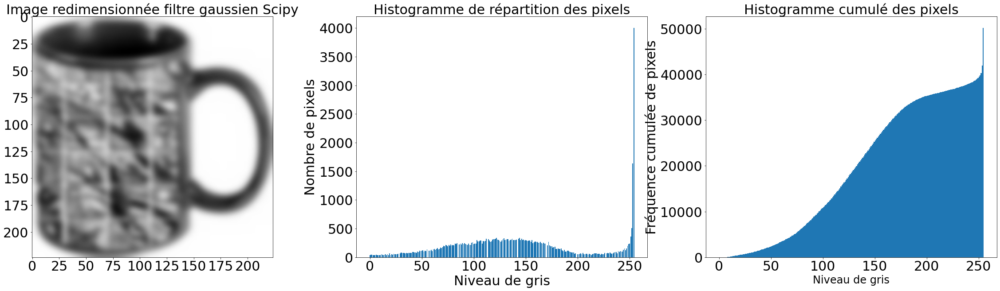

In [61]:
img_gaus_scipy2 = gaussian_filter(img_redim_clahe, sigma=3)
outils_images. \
    afficher_image_histopixel(img_gaus_scipy2,
                              'Image redimensionnée filtre gaussien Scipy')

***Réduction du bruit par un filtre médian***

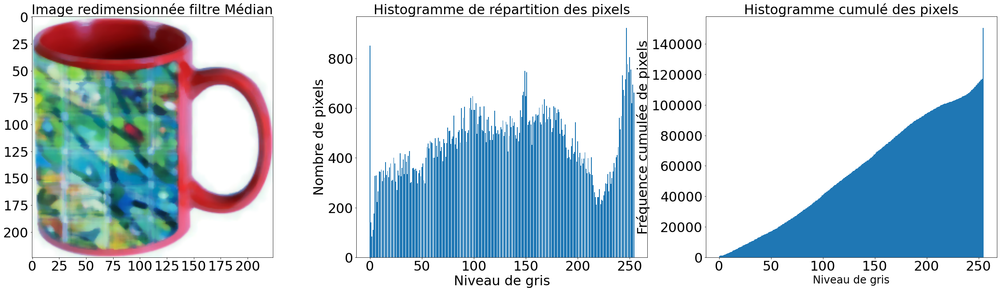

In [62]:
# Réduction du bruit filtre médian sur image correction contraste OpenCV
img_redim_pils_rgb = Image.fromarray(img_redim_pils, 'RGB')
img_median = img_redim_pils_rgb.filter(ImageFilter.MedianFilter(size=7))
outils_images. \
    afficher_image_histopixel(img_median,
                              'Image redimensionnée filtre Médian')

***Réduction du bruit avec l'algorithme Non-local Means Denoising d'OpenCV***

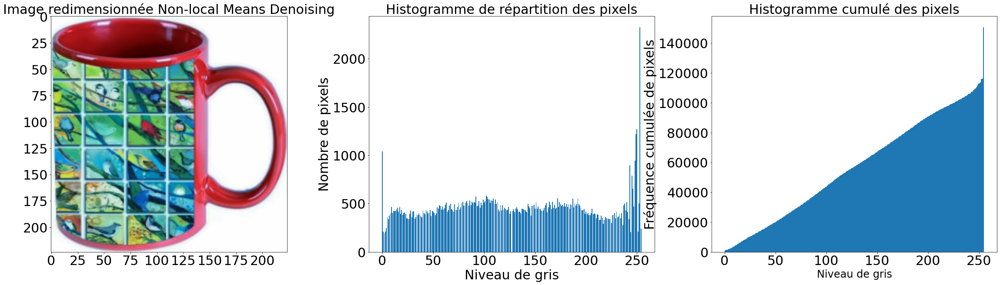

In [63]:
# Réduction du bruit avec l'algorithme  Non-local Means Denoising d'OpenCV
img_fast_pils = cv2.fastNlMeansDenoisingColored(img_redim_pils, None, 5, 5, 7, 21)
outils_images. \
    afficher_image_histopixel(img_fast_pils,
                              'Image redimensionnée Non-local Means Denoising')

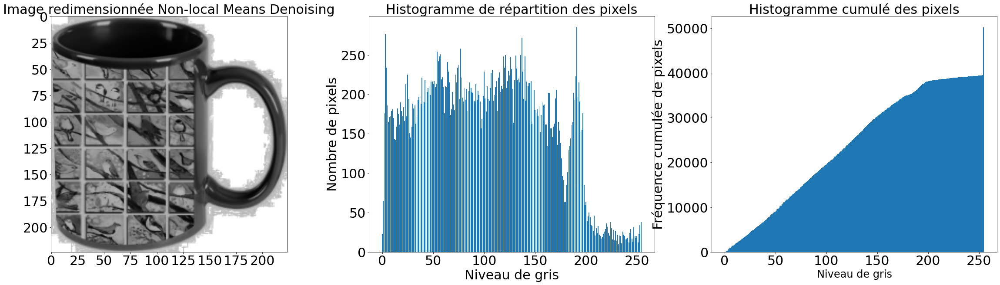

In [64]:
# Réduction du bruit avec l'algorithme Non-local Means Denoising d'OpenCV
img_fast_opencv = cv2.fastNlMeansDenoising(img_redim_opencv, None, 5, 7, 21)
outils_images. \
    afficher_image_histopixel(img_fast_opencv,
                              'Image redimensionnée Non-local Means Denoising')

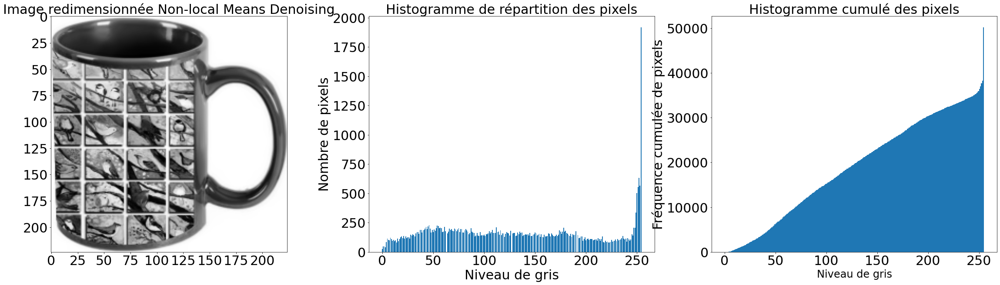

In [65]:
# Réduction du bruit filtre gaussien avec l'algorithme
# Non-local Means Denoising d'OpenCV
img_fast_clahe = cv2.fastNlMeansDenoising(img_redim_clahe, None, 5, 7, 21)
outils_images. \
    afficher_image_histopixel(img_fast_clahe,
                              'Image redimensionnée Non-local Means Denoising')

**Bilan** :
***
- La réduction du bruit avec l'agorithme Non-local Means Denoising d'OpenCV donne un histogramme cumulé plus régulier, il sera utilisé dans le cadre du pré-traitement sur toutes les images.

Suite aux différents tests réalisés avec les librairies PILS, OpenCv et Scipy, le pré-traitement suivant sera appliqué sur toutes les images :
- Correction de l'exposition (étirement d'histogramme) avec PILS (autocontrast).
- Correction du contraste (égalisation d'histogramme) avec OpenCV (CLAHE (Contrast Limited Adaptive Histogram Equalization).
- Réduction du bruit avec l'algorithme Non-local Means Denoising d'OpenCV.
- Conversion en niveau de gris de l'image (ORB, SIFT...).
- Réduction de dimension avec OpenCV (resize et interpolation INTER_AREA).

## Pré-traitement de toutes les images

In [66]:
data['image_proces'] = data['image_loc'].apply(outils_images.preprocess_image)

Un autre test sera effectuée avec toutes les corrections avec la librairie OpenCV pour comparaison :
- Conversion en niveau de gris de l'image (ORB, SIFT..., cvtColor).
- Réduction du bruit avec le filtre GaussianBlur.
- Correction du contraste (égalisation d'histogramme avec equalizeHist).
- Réduction de dimension avec OpenCV (resize et interpolation INTER_AREA).

In [67]:
# Pré-traitement de toutes les images PILS/OPENCV
data['image_proces2'] = data['image_loc'].apply(outils_images.process_image_opencv)

**Processus pour classer les images**

Il est temps de classifier ces images en utilisant différents algorithmes SIFT, ORB et SURF.
Mais comment procéder ?
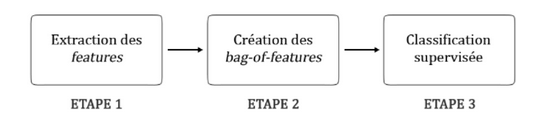

- La technique de **BOVW** sacs de mots visuels permet, pour chaque image, de noter les éléments les plus importants qui se détachent de l'image. Ces éléments sont les **features ou zones d'intérêt ou points clés**.
- A chaque feature est associé un vecteur qui décrit le voisinage de la feature à laquelle il est associé, ce sont les **descripteurs**.
- Un algorithme non supervisé permet de regrouper les éléments similaires des descripteurs dans des clusters. Chaque cluster contient des bouts d'images similaires présentent dans différentes images. Elles sont donc assimilables à des mots dans un texte d'où le nom de 'mot visuel'.
- Les images contiennent des proportions différentes de ces mots visuels, ce qui permet de trouver une similitude entre les images ayant des proportions de ces mots visuels proches.


# Feature extraction

## Algorithme SIFT

- SIFT (Scale Invariant Feature Transform),  cette méthode, développée en 1999 et très populaire dans le domaine de la vision par ordinateur, permet d'extraire des features (ou points d'intérêt) de l'image et de calculer leurs descripteurs. 
- L'algorithme SIFT se divise en plusieurs étapes :
    - Détection : création de l'espace des échelles, calcul des "DoG" (Différence of Gaussian), localisation des points d'intérêt.
    - Description : assignation d'orientation, création des descripteurs.
  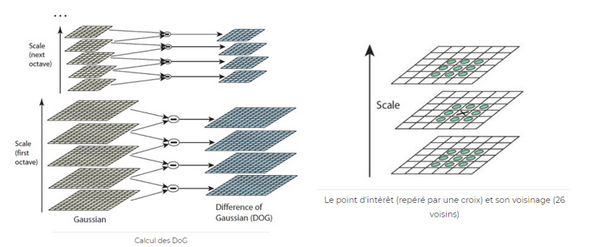
- Les méthodes utilisées pour l'algorithme SIFT sont extraites d'OpenCV.

[Source](https://docs.opencv.org/3.4.9/d5/d3c/classcv_1_1xfeatures2d_1_1SIFT.html)

### Etude de cas d'image avec SIFT

**Chargement de l'image exemple pré-traité**

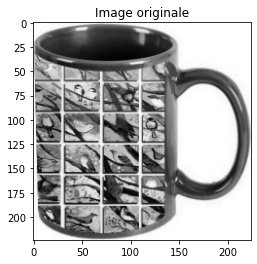

In [50]:
# Chargement de l'image précédemment traitée
mug = cv2.imread('Data/Images_process/3c4ca34c50a5437a1bcc42b72fc1351f.jpg')
# Visualisation de l'image
plt.figure(figsize=(4, 4))
plt.title('Image originale')
plt.imshow(mug)
plt.show()

In [51]:
print('OpenCV                : ' + cv2.__version__)

OpenCV                : 4.5.5


**Extraction des features - BOVW - Bags of Visual WOrds**

In [52]:
# Transformation del'image en matrice de pixels pour OpenCV
mug = np.array(mug)
# Instanciation de SIFT
sift = cv2.xfeatures2d.SIFT_create()
# Extraction des points d'intérêt et des descripteurs
sift_keypoints, sift_descripteurs = sift.detectAndCompute(mug, None)
nb_feat = sift_descripteurs.shape[0]
nb_desc = sift_descripteurs.shape[1]
print(f'SIFT Mug - Nombre de features={nb_feat} pour {nb_desc} descripteurs')

SIFT Mug - Nombre de features=556 pour 128 descripteurs


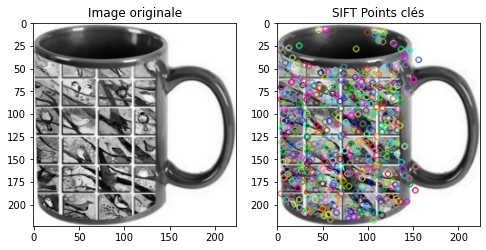

In [53]:
# Visualisation des points d'intérêt
sift_mug_keypoints = cv2.drawKeypoints(mug, sift_keypoints, None)

plt.figure(figsize=(8, 4))

# Image originale
plt.subplot(1, 2, 1)
plt.title('Image originale')
plt.imshow(mug)

# Image avec les points clés
plt.subplot(1, 2, 2)
plt.imshow(sift_mug_keypoints)
plt.title('SIFT Points clés')
plt.show()

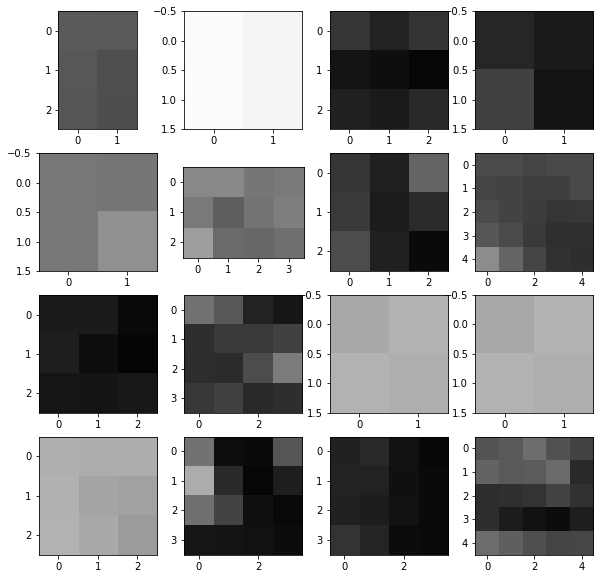

In [54]:
# Visualisation des 'Visual words'
outils_images.afficher_visual_words(mug, sift_keypoints)

### SIFT pour les 1050 images du jeu de données

[Source](https://medium.com/@aybukeyalcinerr/bag-of-visual-words-bovw-db9500331b2f)

**ÉTAPE 0 - Chargement des images pré-traitées**

In [57]:
# Impossible de passer dans la bibliothèque personnelle :
# erreur Win267 nom de répertoire invalide
def charger_image_repertoire(repertoire):
    # Chargement des images pré-traitées
    images = {}
    for filename in os.listdir(repertoire):
        path = repertoire + "/" + filename
        img = cv2.imread(path, 0)
        images[filename] = img
    return images

In [58]:
# Chargement des images pré-traitées dans le dictionnaire images
dico_images = charger_image_repertoire('data/Images_process')
print(f'{len(dico_images)} images chargées')

1050 images chargées


**ÉTAPE 1 - Extraction des features - Visual Words**

In [59]:
sifts = outils_images.sift_extraire_features(dico_images)

In [60]:
# Liste des descripteurs = tous les 'visual words' de toutes les images
sift_list_descripteurs = sifts[0]
len(sift_list_descripteurs)

334110

In [61]:
# Liste des vecteurs par images (dictionnaires clé=nom_image, vecteur)
sift_all_bovw_features = sifts[1]
len(sift_all_bovw_features)

1050

In [78]:
# Sauvegarde des descripteurs SIFT
with open('sauvegarde/sift_list_descripteurs.pickle', 'wb') as f:
    pickle.dump(sift_list_descripteurs, f, pickle.HIGHEST_PROTOCOL)

In [79]:
# Sauvegarde des vecteurs par images SIFT
with open('sauvegarde/sift_all_bovw_features.pickle', 'wb') as f:
    pickle.dump(sift_all_bovw_features, f, pickle.HIGHEST_PROTOCOL)

**ÉTAPE 2 - Création du dictionnaire de visual words - BOVW - Bags of Visual Words** 

- Pour créer le "dictionnaire" de visual words, il suffit d'appliquer un algorithme de clustering aux descripteurs de features construits à l'étape 1, comme le k-means. 
- Les visual words correspondent alors aux centres des clusters trouvés.

In [64]:
# Initialisation du dataframe de sauvegarde des métriques kmeans
df_kmeans_metrics = pd.DataFrame({})

In [67]:
nb_clusters = [100, 300, 500, 1000, 2000, 3000, 4000, 5000]
df_kmeans_metrics = \
    outils_images.calcul_metrics_kmeans(sift_list_descripteurs,
                                        df_kmeans_metrics,
                                        'SIFT', seed, nb_clusters)

'Paramètre 100 terminé'

'Paramètre 300 terminé'

'Paramètre 500 terminé'

'Paramètre 1000 terminé'

'Paramètre 2000 terminé'

'Paramètre 3000 terminé'

'Paramètre 4000 terminé'

'Paramètre 5000 terminé'

In [68]:
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_kmeans_metrics, 'IMAGES_data_kmeans_metrics.csv')

**Méthode Elbow**

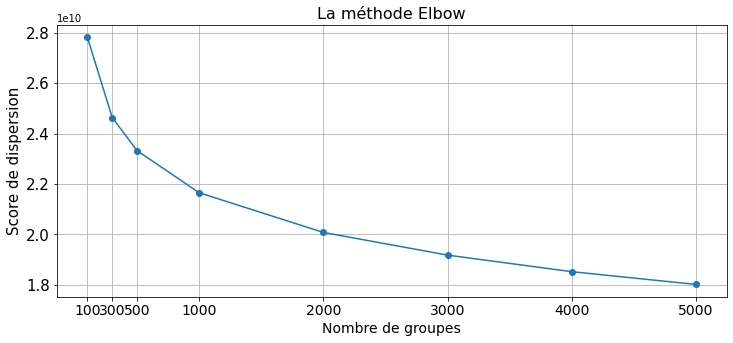

In [69]:
# Trace le graphique des dispersions, pour visualiser le coude
plt.figure(figsize=(12, 5))

plt.title('La méthode Elbow', fontsize=16)
plt.plot([i for i in nb_clusters],
         df_kmeans_metrics['dispersion'].to_list(),
         marker='o')
plt.grid(True)
plt.xlabel('Nombre de groupes', fontsize=14)
plt.ylabel('Score de dispersion', fontsize=15)
plt.xticks([i for i in nb_clusters], fontsize=14)
plt.yticks(fontsize=15)

plt.show()

**Bilan** :
- Le nombre de clusters (paramètre k de l'agorithme KMeans) utilisé sera : 1000.

In [71]:
# Constitution du dictionnaire de bag of words
sift_kmeans = KMeans(n_clusters=1000, n_init=10)
sift_kmeans.fit(sift_list_descripteurs)
sift_visual_words = sift_kmeans.cluster_centers_

In [76]:
# Sauvegarde du modèle KMeans Sift
with open('sauvegarde/sift_kmeans.pickle', 'wb') as f:
    pickle.dump(sift_kmeans, f, pickle.HIGHEST_PROTOCOL)

In [77]:
# Sauvegarde des VW SIFT
with open('sauvegarde/sift_visual_words.pickle', 'wb') as f:
    pickle.dump(sift_visual_words, f, pickle.HIGHEST_PROTOCOL)

**ÉTAPE 4 - Construction de l'histogramme pour chaque image**  

In [83]:
sift_bovw = outils_images.image_class(sift_all_bovw_features,sift_visual_words)


In [84]:
# Sauvegarde des BOVW SIFT
with open('sauvegarde/sift_bovw.pickle', 'wb') as f:
    pickle.dump(sift_bovw, f, pickle.HIGHEST_PROTOCOL)

In [85]:
# Dataframe de sauvegarde des BOVW SIFT
df_sift_bovw = pd.DataFrame({'image': sift_bovw.keys(),
                             'sift_bovw': sift_bovw.values()})
# Ajout des BOVW en np.array d'une liste
df_sift_bovw['Histo'] = [row[0] for row in df_sift_bovw['sift_bovw']]
# Ajout de la catégorie
df_sift_bovw = df_sift_bovw.merge(data[['image', 'image_loc',
                                        'Categorie_1']], how='left',
                                  on='image')
# Constituer le dataframe de vecteurs de BOVW
df_sift_vectors = \
    outils_images.constituer_dataframe_vectors(df_sift_bovw, 'Histo')

In [86]:
# Sauvegarde du dataframe des vectors BOVW SIFT
with open('sauvegarde/df_sift_vectors.pickle', 'wb') as f:
    pickle.dump(df_sift_vectors, f, pickle.HIGHEST_PROTOCOL)

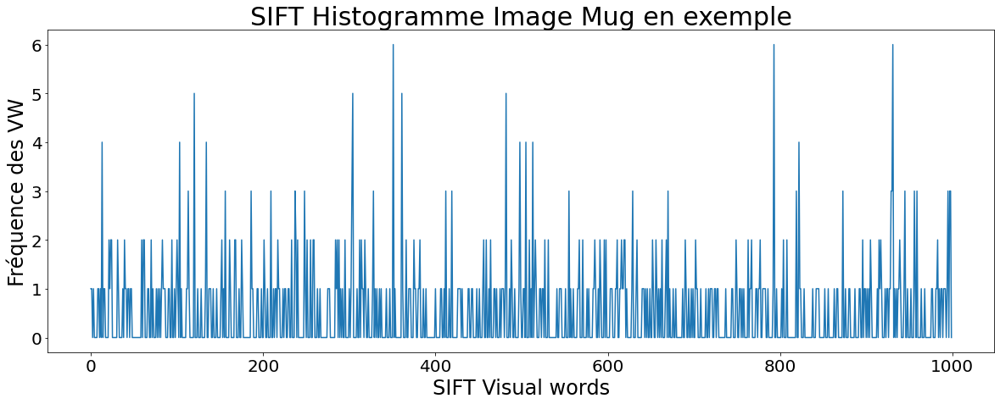

In [87]:
# Visualisation de l'histogramme pour notre image exemple
# Récupération de l'historgramme
df_visu = df_sift_bovw[df_sift_bovw['image'] ==
                       '3c4ca34c50a5437a1bcc42b72fc1351f.jpg']['sift_bovw']
histo_mug = df_visu.to_list()[0][0]
plt.figure(figsize=(20, 7))
plt.title('SIFT Histogramme Image Mug en exemple', fontsize=30)
plt.xlabel("SIFT Visual words", fontsize=24)
plt.ylabel("Fréquence des VW", fontsize=24)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.grid(False)
plt.plot(histo_mug)
plt.show()

**ÉTAPE 5 - Réduction de dimension**  

In [88]:
type_donnee = 'TSNE_SIFT'

In [89]:
# t-SNE tuning du paramètre perplexity sans initialisation PCA
top_depart = time.time()
liste_param = [20, 30, 40, 50, 70, 80]
results_sift = list()
tsne_results_sift = []
for i in liste_param:
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=500,
                random_state=seed)
    tsne_results_sift = \
        tsne.fit_transform(df_sift_vectors)
    results_sift.append(tsne_results_sift)
print('t-SNE terminée! en : {} seconds'.format(time.time()-top_depart))

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.002s...
[t-SNE] Computed neighbors for 1050 samples in 0.043s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 3.826102
[t-SNE] KL divergence after 250 iterations with early exaggeration: 125.643799
[t-SNE] KL divergence after 500 iterations: 2.608107
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.002s...
[t-SNE] Computed neighbors for 1050 samples in 0.042s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 4.197270
[t-SNE] KL divergence after 250 iterations with early exaggeration: 118.562820
[t-SNE] KL divergence after 500 iterations: 2.471239
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.001s...
[t-SNE] Computed neighbors for 1050 samples in 

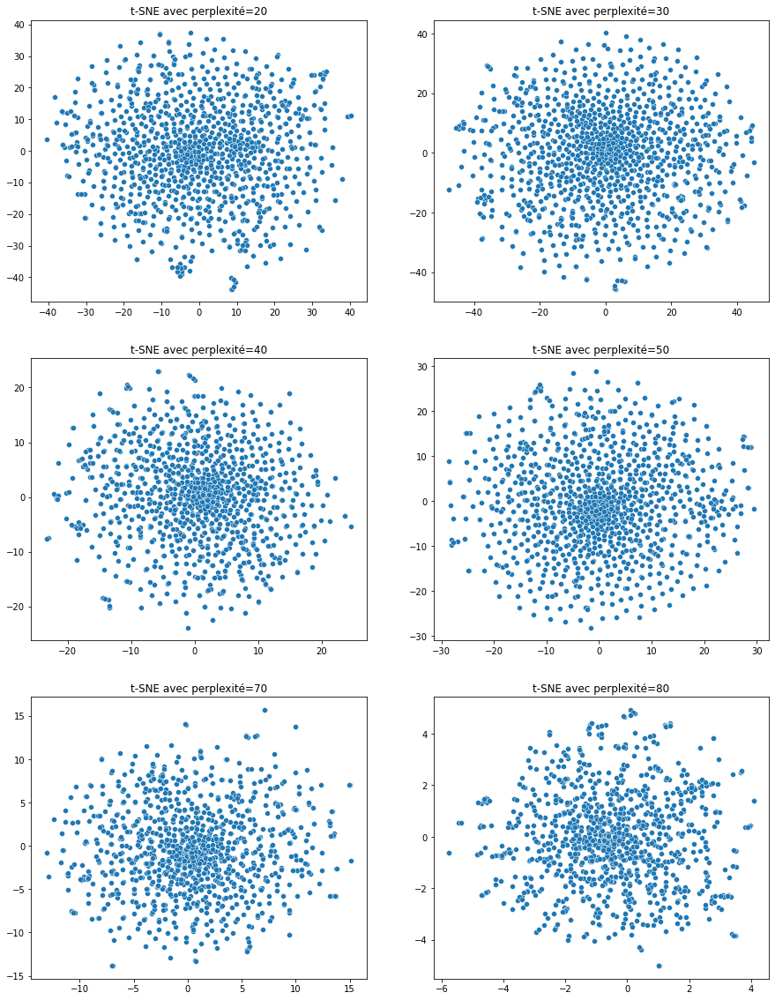

In [90]:
# Visualisation en 2D des différents résultats selon la perplexité
outils_segmentation.affiche_tsne(results_sift, liste_param, 1)

- groupes plus homogènes pour perplexité=70
- on laissera les paramètres learning_rate et n_iter par défaut (1000) et le nombre de composants par défaut (2).

In [91]:
# Réduction de dimension tsne
tsne_sift = TSNE(verbose=1, perplexity=70, n_iter=1000)
X_proj_tsne_sift = \
    tsne_sift.fit_transform(df_sift_vectors)
# Dataframe pour clustering
df_tsne_sift = pd.DataFrame({'VAR1' : X_proj_tsne_sift[:, 0],
                             'VAR2' : X_proj_tsne_sift[:, 1],
                             'CATEGORIE' : df_sift_bovw['Categorie_1'],
                             'IMAGE': df_sift_bovw['image'],
                             'IMAGE_LOC': df_sift_bovw['image_loc']})

[t-SNE] Computing 211 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.001s...
[t-SNE] Computed neighbors for 1050 samples in 0.057s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 5.195824
[t-SNE] KL divergence after 250 iterations with early exaggeration: 107.248550
[t-SNE] KL divergence after 1000 iterations: 1.649924


**Clustering**

In [92]:
cols = ['VAR1', 'VAR2']

In [93]:
# Initialisation du dataframe de sauvegarde des scores
df_scores = pd.DataFrame({})

In [94]:
# Initialisation du dataframe de sauvegarde des précisions
df_precision = pd.DataFrame({})

In [95]:
# Initialisation du dataframe de sauvegarde des métriques de clustering
df_metrics_clust = pd.DataFrame({})

In [96]:
# Tuning hyperparametres n_init, max_iter
# Paramètres à tester
n_init = [10, 20, 30, 50, 70, 80, 100]
max_iter = [100, 200, 300, 400, 500]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_clust = \
    outils_nlp.calcul_metrics_kmeans(df_tsne_sift[cols],
                                     df_metrics_clust,
                                     type_donnee,
                                     seed, n_init, max_iter)
# Tri par indice de dispersion : proche de 0
df_metrics_clust[df_metrics_clust['Type_données'] == type_donnee] \
    .sort_values(by=['coef_silh', 'davies_bouldin', 'Durée (s)'],
                 ascending=[False, True, True]).style.hide_index()

Type_données,n_init,max_iter,coef_silh,dispersion,davies_bouldin,Durée (s)
TSNE_SIFT,10,400,0.379894,1635.993652,0.822085,0.162906
TSNE_SIFT,10,500,0.379894,1635.993652,0.822085,0.162907
TSNE_SIFT,10,200,0.379894,1635.993652,0.822085,0.165904
TSNE_SIFT,10,300,0.379894,1635.993652,0.822085,0.166902
TSNE_SIFT,20,300,0.379894,1635.993652,0.822085,0.227869
TSNE_SIFT,20,200,0.379894,1635.993652,0.822085,0.229868
TSNE_SIFT,20,100,0.379894,1635.993652,0.822085,0.233866
TSNE_SIFT,20,400,0.379894,1635.993652,0.822085,0.236864
TSNE_SIFT,20,500,0.379894,1635.993652,0.822085,0.244858
TSNE_SIFT,30,400,0.379894,1635.993652,0.822085,0.286835


In [97]:
# Instanciation du modèle KMeans avec les meilleurs paramètres
kmeans_tsne_sift = KMeans(n_clusters=7, init='k-means++',
                          n_init=100, max_iter=300,
                          random_state=seed) \
    .fit(df_tsne_sift[cols])
# Ajout de l'assignation du cluster au dataframe
df_tsne_sift['Clusters'] = kmeans_tsne_sift.labels_
kmeans_tsne_sift_labels = kmeans_tsne_sift.labels_

In [98]:
# Scores ?
df_scores = outils_nlp.calcul_metriques_clusters(df_tsne_sift,
                                                 df_scores,
                                                 type_donnee)
df_scores[df_scores['Type_données'] == type_donnee].style.hide_index()

Type_données,ARI,Homogénéité,Complétude,V-measure
TSNE_SIFT,0.047810,0.082016,0.086646,0.084268


In [99]:
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_scores, 'IMAGES_data_df_scores.csv')

Clusters,Nombre,%
0,109,10.380000
1,337,32.100000
2,108,10.290000
3,124,11.810000
4,128,12.190000
5,133,12.670000
6,111,10.570000


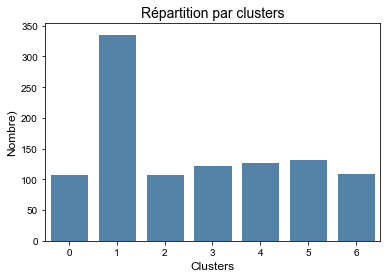

In [100]:
outils_nlp.affiche_repartition_par_clusters(kmeans_tsne_sift_labels)

In [101]:
# Les catégories par clusters
df_tsne_sift.groupby('Clusters')['CATEGORIE'].value_counts(). \
    to_frame()

CATEGORIE
Clusters CATEGORIE                            
0        Baby Care                          31
         Home Furnishing                    22
         Computers                          17
         Beauty and Personal Care           14
         Home Decor & Festive Needs         13
         Kitchen & Dining                    7
         Watches                             5
1        Kitchen & Dining                   77
         Computers                          68
         Watches                            66
         Beauty and Personal Care           46
         Home Decor & Festive Needs         35
         Baby Care                          24
         Home Furnishing                    21
2        Home Furnishing                    28
         Beauty and Personal Care           23
         Computers                          22
         Baby Care                          15
         Watches                             9
         Home Decor & Festive Needs          7
         Kitchen & Dining                    4
3        Home Decor & Festive Needs         50
         Home Furnishing                    21
         Kitchen & Dining                   17
         Baby Care                          15
         Beauty and Personal Care           13
         Computers                           7
         Watches                             1
4        Beauty and Personal Care           39
         Watches                            24
         Kitchen & Dining                   21
         Computers                          15
         Home Furnishing                    13
         Baby Care                           8
         Home Decor & Festive Needs          8
5        Baby Care                          39
         Home Furnishing                    29
         Home Decor & Festive Needs         28
         Kitchen & Dining                   16
         Watches                             8
         Beauty and Personal Care            7
         Computers                           6
6        Watches                            37
         Baby Care                          18
         Home Furnishing                    16
         Computers                          15
         Home Decor & Festive Needs          9
         Beauty and Personal Care            8
         Kitchen & Dining                    8

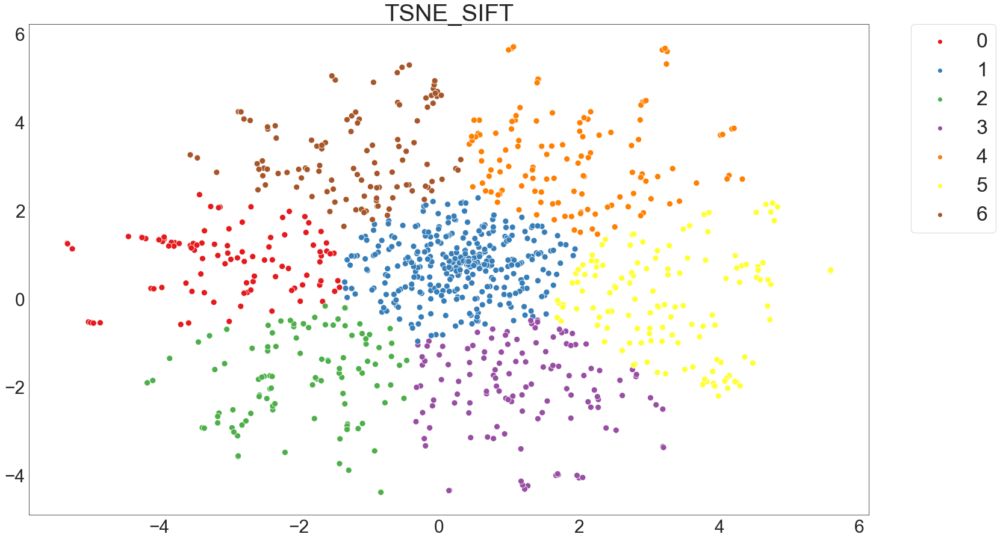

In [103]:
# Visualisation des clusters
outils_nlp.affiche_projection_par_clusters(X_proj_tsne_sift,
                                           kmeans_tsne_sift_labels,
                                           type_donnee)

**Bilan** :
***
- Le score ARI est faible (0.035).
- Cette combinaison TSNE SIFT sur les images ne parvient pas à retrouver les 7 catégories comme le souhaite notre client 
- Il manque la catégorie 'Kitchen & Dining'. 

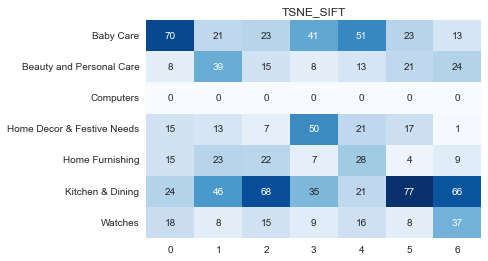

'Précision: 28.67%'

In [104]:
# Qualité de la catégorisation
dico_categories = {'0': 'Baby Care',
                   '1': 'Kitchen & Dining',
                   '2': 'Home Furnishing',
                   '3': 'Home Decor & Festive Needs',
                   '4': 'Beauty and Personal Care',
                   '5': 'Baby Care',
                   '6': 'Watches'}
outils_nlp.affiche_qualite_categorisation(df_tsne_sift,
                                          dico_categories, type_donnee)

In [105]:
# Sauvegarde des précisions de la catégorisation
df_precision = outils_nlp.sauvegarde_precision(df_precision, '28.67',
                                               type_donnee)
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_precision, 'IMAGES_data_df_precision.csv')

In [106]:
# Sauvegarde du dataframe des TSNE SIFT
with open('sauvegarde/df_tsne_sift.pickle', 'wb') as f:
    pickle.dump(df_tsne_sift, f, pickle.HIGHEST_PROTOCOL)

**Erreurs**

In [107]:
# Nombre d'erreur
mask = df_tsne_sift['CATEGORIE'] == df_tsne_sift['Cluster_labels']
df_erreur_sift = df_tsne_sift[~mask]
display(f'Nombre d\'erreurs : {df_erreur_sift.shape[0]}')

"Nombre d'erreurs : 749"

**Répartition des erreurs par catégorie**

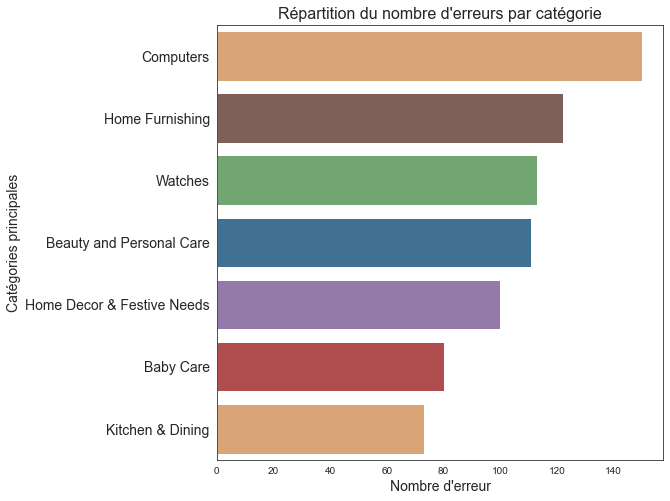

In [108]:
# Répartition des erreurs par catégorie
plt.figure(figsize=(8, 8))
sns.countplot(y='CATEGORIE', data=df_erreur_sift, orient='h',
              order=df_erreur_sift['CATEGORIE'].value_counts().index,
              palette=['#e9a467', '#845b53', '#6bad6b', '#3274a1',
                       '#9372b2', '#c03d3e'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=16)
plt.xlabel('Nombre d\'erreur', fontsize=14)
plt.ylabel('Catégories principales', fontsize=14)
plt.yticks(fontsize=14)
plt.show()

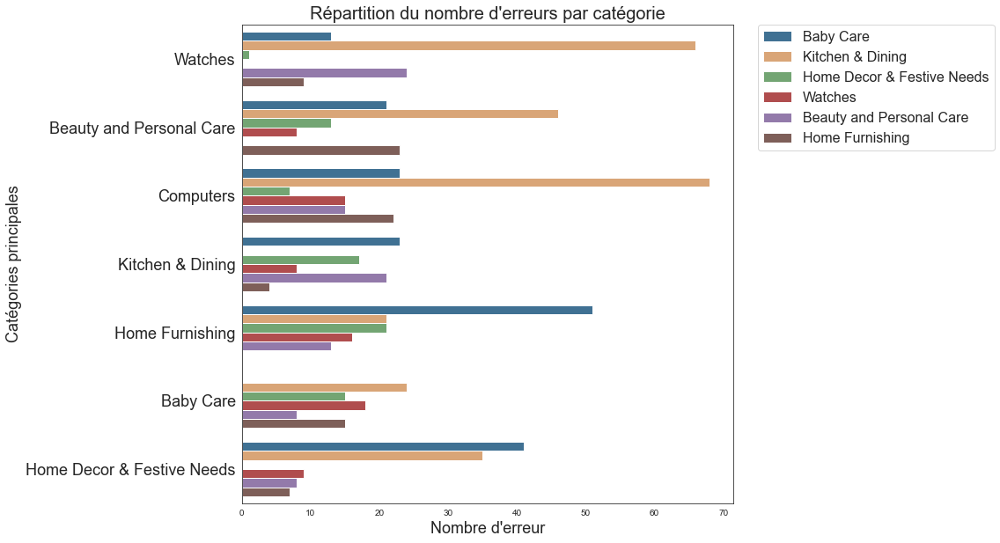

In [109]:
# Répartition du nombres d'erreurs par catégorie
plt.figure(figsize=(10, 10))
sns.countplot(y='CATEGORIE', hue='Cluster_labels',
              data=df_erreur_sift, orient='h',
              palette=['#3274a1', '#e9a467', '#6bad6b', '#c03d3e',
                       '#9372b2', '#845b53', '#d684bd'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=20)
plt.xlabel('Nombre d\'erreur', fontsize=18)
plt.ylabel('Catégories principales', fontsize=18)
plt.yticks(fontsize=18)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=16)
plt.show()

**Exemples d'erreurs**

In [110]:
def path_to_image_photo_html(path):
    return '<img src="' + path + ' " width="100">'

In [113]:
df_visu_erreur = df_erreur_sift[['CATEGORIE', 'IMAGE_LOC',
                                 'Cluster_labels']].head(10)
display(HTML(df_visu_erreur.
             to_html(escape=False,
                     formatters=dict(IMAGE_LOC=path_to_image_photo_html))))

,CATEGORIE,IMAGE_LOC,Cluster_labels
0,Watches,,Baby Care
3,Beauty and Personal Care,,Kitchen & Dining
4,Computers,,Baby Care
5,Computers,,Kitchen & Dining
6,Computers,,Baby Care
8,Beauty and Personal Care,,Kitchen & Dining
9,Kitchen & Dining,,Baby Care
11,Beauty and Personal Care,,Home Decor & Festive Needs
12,Computers,,Watches
13,Computers,,Kitchen & Dining


In [114]:
# Sauvegarde du dataframe des erreurs SIFT
with open('sauvegarde/df_erreur_sift.pickle', 'wb') as f:
    pickle.dump(df_erreur_sift, f, pickle.HIGHEST_PROTOCOL)

**Comparaison avec classification supervisée**

In [115]:
# Initialisation du dataframe de sauvegarde des scores classif supervisée
df_scores_classif_sup = pd.DataFrame({})

In [116]:
data_cat = data['Categorie_1']

In [117]:
outils_nlp.classifier_pycaret(data_cat, df_sift_vectors, type_donnee)

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.001s...
[t-SNE] Computed neighbors for 1050 samples in 0.053s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 4.747891
[t-SNE] KL divergence after 250 iterations with early exaggeration: 110.010078
[t-SNE] KL divergence after 1600 iterations: 1.892404


IntProgress(value=0, description='Processing: ', max=3)

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,12:34:49
Status,. . . . . . . . . . . . . . . . . .,Preparing Data for Modeling


ValueError: Setting a random_state has no effect since shuffle is False. You should leave random_state to its default (None), or set shuffle=True.

In [118]:
# Sauvegarde des résultats
df_scores_classif_sup = \
    outils_images.sauvegarder_accuracy_class_sup_pycaret(
        df_scores_classif_sup, '0.1716', '0.1139', type_donnee)
df_scores_classif_sup[df_scores_classif_sup['Type_données'] == type_donnee]

,Type_données,Accuracy_train,Accuracy_test
0,TSNE_SIFT,0.1716,0.1139


**Bilan** :
- La classification supervisée obtient des moins bons résultats 11% de précision pour 25% pour le clustering non supervisé.

## Algorithme ORB

- **ORB** (Oriented FAST and Rotated BRIEF) a été développé dans les laboratoires d'OpenCV par Ethan Rublee, Vincent Rabaud, Kurt Konolige et Gary R. Bradski en 2011, comme une alternative efficace et viable à SIFT et SURF. 
- ORB a été conçu principalement parce que SIFT et SURF sont des algorithmes brevetés. ORB, cependant, est libre d'utilisation.
- ORB est aussi performant que SIFT pour la détection des caractéristiques (et est meilleur que SURF) tout en étant presque deux ordres de grandeur plus rapide.
- ORB s'appuie sur le célèbre détecteur de points clés FAST et le descripteur BRIEF. Ces deux techniques sont intéressantes en raison de leurs bonnes performances et de leur faible coût. 
- Les principales contributions d'ORB sont les suivantes :
    - L'ajout d'une composante d'orientation rapide et précise à FAST.
    - Le calcul efficace des caractéristiques BRIEF orientées
    - L'analyse de la variance et de la corrélation des caractéristiques BRIEF orientées
    - Une méthode d'apprentissage pour la décorrélation des caractéristiques BRIEF sous invariance rotationnelle, conduisant à de meilleures performances dans les applications de type "nearest-neighbor".

[Source](https://medium.com/data-breach/introduction-to-orb-oriented-fast-and-rotated-brief-4220e8ec40cf)

### Exemple sur une image

**Chargement de l'image exemple pré-traitée**

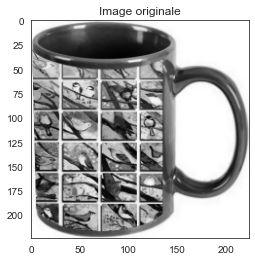

In [119]:
# Chargement de l'image précédemment traitée
mug = cv2.imread('data/Images_process/3c4ca34c50a5437a1bcc42b72fc1351f.jpg')
# Visualisation de l'image
plt.figure(figsize=(4, 4))
plt.title('Image originale')
plt.imshow(mug)
plt.show()

**Extraction des features - BOVW - Bags of Visual WOrds**

In [120]:
# Transformation del'image en matrice de pixels pour OpenCV
mug = np.array(mug)
# Instanciation de ORB
orb = cv2.ORB_create()
# Extraction des points d'intérêt et des descripteurs
orb_keypoints, orb_descripteurs = orb.detectAndCompute(mug, None)
nb_feat = orb_descripteurs.shape[0]
nb_desc = orb_descripteurs.shape[1]
print(f'ORB Mug - Nombre de features={nb_feat} pour {nb_desc} descripteurs')

ORB Mug - Nombre de features=441 pour 32 descripteurs


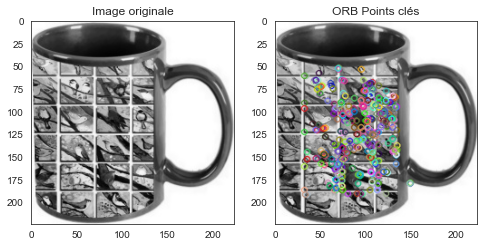

In [121]:
# Visualisation des points d'intérêt
orb_mug_keypoints = cv2.drawKeypoints(mug, orb_keypoints, None)

plt.figure(figsize=(8, 4))

# Image originale
plt.subplot(1, 2, 1)
plt.title('Image originale')
plt.imshow(mug)

# Image avec les points clés
plt.subplot(1, 2, 2)
plt.imshow(orb_mug_keypoints)
plt.title('ORB Points clés')
plt.show()

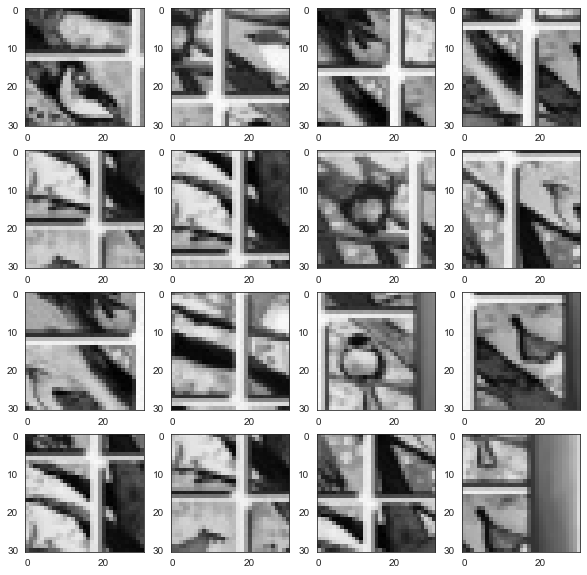

In [122]:
# Visualisation des 'Visual words'
outils_images.afficher_visual_words(mug, orb_keypoints)

### ORB pour les 1050 images du jeu de données

**ÉTAPE 0 - Chargement des images pré-traitées & 1 - Extraction des features - Visual Words**

In [123]:
# Chargement des images et extraction des features
orb_list_descripteurs, orb_lien_img_des = outils_images.orb_charger_img_extraire_vw(data['image_proces2'])

In [124]:
orb_list_descripteurs.shape

(735579, 32)

In [125]:
len(orb_lien_img_des)

735579

In [126]:
# Sauvegarde des descripteurs ORB
with open('sauvegarde/orb_list_descripteurs.pickle', 'wb') as f:
    pickle.dump(orb_list_descripteurs, f, pickle.HIGHEST_PROTOCOL)

In [127]:
# Sauvegarde des descripteurs ORB
with open('sauvegarde/orb_lien_img_des.pickle', 'wb') as f:
    pickle.dump(orb_lien_img_des, f, pickle.HIGHEST_PROTOCOL)

**ÉTAPE 2 - Création du dictionnaire de visual words - BOVW - Bags of Visual Words**  

- Pour créer le "dictionnaire" de visual words, il suffit d'appliquer un algorithme de clustering aux descripteurs de features construits à l'étape 1, comme le k-means. 
- Les visual words correspondent alors aux centres des clusters trouvés.
- On utilisera la fonction Kmeans() intégrée à OpenCV :
- Paramètres d'entrée
    - **samples** : Il doit être de type de données np.float32, et chaque caractéristique doit être mise dans une seule colonne.
    - **nclusters**(K) : Nombre de clusters requis à la fin du processus.
    - **criteria** : C'est le critère de fin d'itération. Lorsque ce critère est satisfait, l'itération de l'algorithme s'arrête. En fait, il devrait être un tuple de 3 paramètres. Ils sont ( type, max_iter, epsilon ) :
    Le type du critère de terminaison. Il a 3 drapeaux comme ci-dessous :
    cv.TERM_CRITERIA_EPS - arrête l'itération de l'algorithme si la précision spécifiée, epsilon, est atteinte.
    cv.TERM_CRITERIA_MAX_ITER - arrête l'algorithme après le nombre d'itérations spécifié, max_iter.
    cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER - arrête l'itération lorsque l'une des conditions ci-dessus est remplie.
    - **max_iter** - Un nombre entier spécifiant le nombre maximum d'itérations.
    - **epsilon** - Précision requise
    - **attempts** : Flag permettant de spécifier le nombre de fois où l'algorithme est exécuté en utilisant différentes étiquetages initiaux. L'algorithme renvoie les étiquettes qui donnent la meilleure compacité. Cette compacité est renvoyée en sortie.
    - **flags** : Ce drapeau est utilisé pour spécifier comment les centres initiaux sont pris. Normalement, deux drapeaux sont utilisés pour cela : cv.KMEANS_PP_CENTERS et cv.KMEANS_RANDOM_CENTERS.

[Source](https://docs.opencv.org/master/d1/d5c/tutorial_py_kmeans_opencv.html)

In [128]:
# Test du KMeans mis à disposition
# -------------------------------------------------------------------
# Define criteria = ( type, max_iter = 10 , epsilon = 1.0 )
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)

# Set flags (Just to avoid line break in the code)
flags = cv2.KMEANS_PP_CENTERS  # kmeans++

# Apply KMeans
compactness, orb_labels, centers = cv2.kmeans(orb_list_descripteurs, 1000,
                                              None, criteria, 1, flags)

**ÉTAPE 4 - Construction de l'histogramme pour chaque image**  

- Pour chaque image, on crée un histogramme qui indique la fréquence d'apparition de chaque visual word dans l'image.
- Le bag-of-features d'une image est le vecteur dans lequel on a stocké les valeurs de l'histogramme et qu'on a normalisé (en divisant par la norme euclidienne). 

In [129]:
# Extraction des BOVW ORB
outils_images.orb_constituter_bovw(data, 'image_proces2', 'orb_bovw',
                                   orb_labels, orb_lien_img_des)

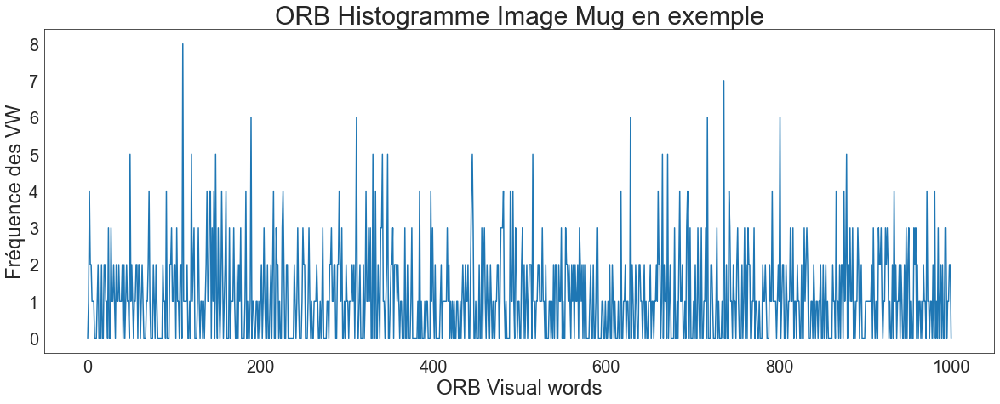

In [130]:
# Visualisation de l'histogramme pour notre image exemple
# Récupération de l'historgramme
df_visu_orb = data[data['image'] ==
                   '3c4ca34c50a5437a1bcc42b72fc1351f.jpg']['orb_bovw']
histo_mug = df_visu_orb.to_list()[0]
plt.figure(figsize=(20, 7))
plt.title('ORB Histogramme Image Mug en exemple', fontsize=30)
plt.xlabel('ORB Visual words', fontsize=24)
plt.ylabel('Fréquence des VW', fontsize=24)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.grid(False)
plt.plot(histo_mug)
plt.show()

In [131]:
# Dataframe de sauvegarde des BOVW ORB
df_orb_bovw = data[['image', 'image_loc', 'Categorie_1', 'orb_bovw']]
# Constituer le dataframe de vecteurs de BOVW
df_orb_vectors = \
    outils_images.constituer_dataframe_vectors(df_orb_bovw, 'orb_bovw')

In [132]:
# Sauvegarde des BOVW ORB
with open('sauvegarde/df_orb_bovw.pickle', 'wb') as f:
    pickle.dump(df_orb_bovw, f, pickle.HIGHEST_PROTOCOL)

In [133]:
# Sauvegarde du dataframe des vectors BOVW ORB
with open('sauvegarde/df_orb_vectors.pickle', 'wb') as f:
    pickle.dump(df_orb_vectors, f, pickle.HIGHEST_PROTOCOL)

**ÉTAPE 5 - Réduction de dimension** 

In [134]:
type_donnee = 'TSNE_ORB'

In [135]:
# t-SNE tuning du paramètre perplexity sans initialisation PCA
top_depart = time.time()
liste_param = [20, 30, 40, 50, 70, 80]
results_orb = list()
tsne_results_orb = []
for i in liste_param:
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=500,
                random_state=seed)
    tsne_results_orb = \
        tsne.fit_transform(df_orb_vectors)
    results_orb.append(tsne_results_orb)
print('t-SNE terminée! en : {} seconds'.format(time.time()-top_depart))

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.002s...
[t-SNE] Computed neighbors for 1050 samples in 0.057s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 7.151930
[t-SNE] KL divergence after 250 iterations with early exaggeration: 105.288445
[t-SNE] KL divergence after 500 iterations: 2.256683
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.002s...
[t-SNE] Computed neighbors for 1050 samples in 0.062s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 7.757058
[t-SNE] KL divergence after 250 iterations with early exaggeration: 106.674690
[t-SNE] KL divergence after 500 iterations: 2.181367
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.002s...
[t-SNE] Computed neighbors for 1050 samples in 

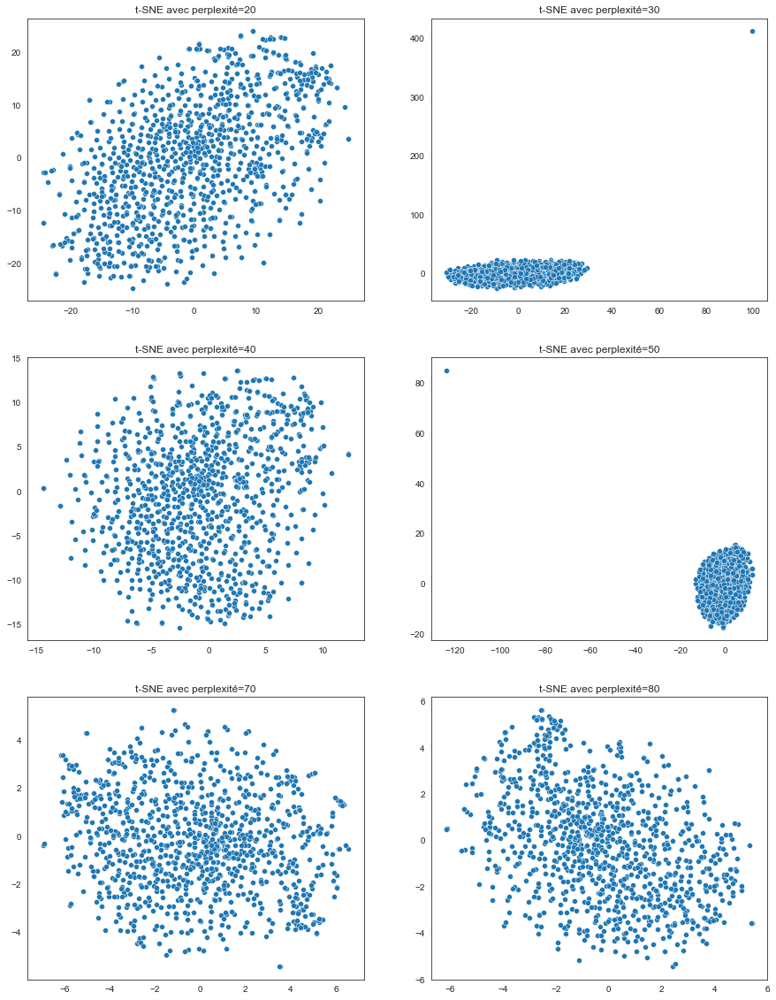

In [136]:
# Visualisation en 2D des différents résultats selon la perplexité
outils_segmentation.affiche_tsne(results_orb, liste_param, 1)

- groupes plus homogènes pour perplexité=50
- on laissera les paramètres learning_rate et n_iter à 5000 et le nombre de composants par défaut (2).

In [137]:
# Réduction de dimension tsne
tsne_orb = TSNE(verbose=1, perplexity=50, n_iter=5000)
X_proj_tsne_orb = \
    tsne_orb.fit_transform(df_orb_vectors)
# Dataframe pour clustering
df_tsne_orb = pd.DataFrame({'VAR1' : X_proj_tsne_orb[:, 0],
                            'VAR2' : X_proj_tsne_orb[:, 1],
                            'CATEGORIE' : df_orb_bovw['Categorie_1'],
                            'IMAGE': df_orb_bovw['image'],
                            'IMAGE_LOC': df_orb_bovw['image_loc']})

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.003s...
[t-SNE] Computed neighbors for 1050 samples in 0.063s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 8.599845
[t-SNE] KL divergence after 250 iterations with early exaggeration: 98.980980
[t-SNE] KL divergence after 2250 iterations: 1.710179


**Clustering**

In [138]:
cols = ['VAR1', 'VAR2']

In [139]:
# Chargement des dataframes de sauvegarde des scores
df_scores = pd.read_csv('IMAGES_data_df_scores.csv')
# Suppression de l'entête des objets
df_scores.drop(0, 0, inplace=True)

In [140]:
# Chargement des dataframes de sauvegarde des précisions
df_precision = pd.read_csv('IMAGES_data_df_precision.csv')
# Suppression de l'entête des objets
df_precision.drop(0, 0, inplace=True)

In [141]:
# Chargement des dataframes de sauvegarde des métriques de clustering
df_metrics_clust = pd.read_csv('IMAGES_data_kmeans_metrics.csv')
# Suppression de l'entête des objets
df_metrics_clust.drop(0, 0, inplace=True)

In [142]:
# Tuning hyperparametres n_init, max_iter
# Paramètres à tester
n_init = [10, 20, 30, 50, 70, 80, 100]
max_iter = [100, 200, 300, 400, 500]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_clust = \
    outils_nlp.calcul_metrics_kmeans(df_tsne_orb[cols],
                                     df_metrics_clust,
                                     type_donnee,
                                     seed, n_init, max_iter)
# Tri par indice de dispersion : proche de 0
df_metrics_clust[df_metrics_clust['Type_données'] == type_donnee] \
    .sort_values(by=['coef_silh', 'davies_bouldin', 'Durée (s)'],
                 ascending=[False, True, True]).style.hide_index()

Type_données,Param_k,dispersion,Durée (s),n_init,max_iter,coef_silh,davies_bouldin
TSNE_ORB,nan,4423.032227,0.283836,20.000000,200.000000,0.370014,0.820701
TSNE_ORB,nan,4423.032227,0.290833,20.000000,500.000000,0.370014,0.820701
TSNE_ORB,nan,4423.032227,0.290833,20.000000,300.000000,0.370014,0.820701
TSNE_ORB,nan,4423.032227,0.293831,20.000000,400.000000,0.370014,0.820701
TSNE_ORB,nan,4423.032227,0.301825,20.000000,100.000000,0.370014,0.820701
TSNE_ORB,nan,4423.032715,0.408763,30.000000,200.000000,0.370014,0.820701
TSNE_ORB,nan,4423.032227,0.427754,30.000000,100.000000,0.370014,0.820701
TSNE_ORB,nan,4423.032227,0.432750,30.000000,400.000000,0.370014,0.820701
TSNE_ORB,nan,4423.032227,0.432750,30.000000,300.000000,0.370014,0.820701
TSNE_ORB,nan,4423.032715,0.458734,30.000000,500.000000,0.370014,0.820701


In [143]:
# Instanciation du modèle KMeans avec les meilleurs paramètres
kmeans_tsne_orb = KMeans(n_clusters=7, init='k-means++',
                         n_init=10, max_iter=300,
                         random_state=seed) \
    .fit(df_tsne_orb[cols])
# Ajout de l'assignation du cluster au dataframe
df_tsne_orb['Clusters'] = kmeans_tsne_orb.labels_
kmeans_tsne_orb_labels = kmeans_tsne_orb.labels_

In [144]:
# Scores ?
df_scores = outils_nlp.calcul_metriques_clusters(df_tsne_orb,
                                                 df_scores,
                                                 type_donnee)
df_scores[df_scores['Type_données'] == type_donnee].style.hide_index()

Type_données,ARI,Homogénéité,Complétude,V-measure
TSNE_ORB,0.041031,0.063934,0.065129,0.064526


In [145]:
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_scores, 'IMAGES_data_df_scores.csv')

Clusters,Nombre,%
0,135,12.860000
1,149,14.190000
2,238,22.670000
3,109,10.380000
4,143,13.620000
5,106,10.100000
6,170,16.190000


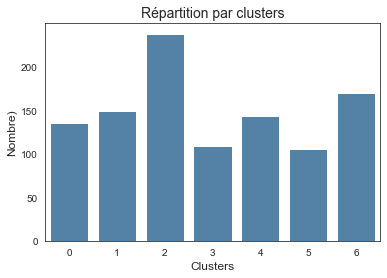

In [146]:
outils_nlp.affiche_repartition_par_clusters(kmeans_tsne_orb_labels)

In [147]:
# Les catégories par clusters
df_tsne_orb.groupby('Clusters')['CATEGORIE'].value_counts(). \
    to_frame()

CATEGORIE
Clusters CATEGORIE                            
0        Home Furnishing                    31
         Home Decor & Festive Needs         27
         Beauty and Personal Care           20
         Watches                            20
         Baby Care                          17
         Computers                          10
         Kitchen & Dining                   10
1        Computers                          62
         Home Decor & Festive Needs         20
         Baby Care                          17
         Beauty and Personal Care           17
         Kitchen & Dining                   16
         Watches                            13
         Home Furnishing                     4
2        Kitchen & Dining                   63
         Watches                            50
         Computers                          36
         Beauty and Personal Care           28
         Baby Care                          24
         Home Furnishing                    19
         Home Decor & Festive Needs         18
3        Home Decor & Festive Needs         32
         Computers                          19
         Watches                            15
         Home Furnishing                    12
         Kitchen & Dining                   11
         Baby Care                          10
         Beauty and Personal Care           10
4        Home Furnishing                    43
         Baby Care                          32
         Home Decor & Festive Needs         22
         Beauty and Personal Care           16
         Watches                            14
         Kitchen & Dining                   13
         Computers                           3
5        Beauty and Personal Care           27
         Kitchen & Dining                   18
         Watches                            15
         Home Furnishing                    13
         Home Decor & Festive Needs         12
         Computers                          11
         Baby Care                          10
6        Baby Care                          40
         Beauty and Personal Care           32
         Home Furnishing                    28
         Watches                            23
         Home Decor & Festive Needs         19
         Kitchen & Dining                   19
         Computers                           9

**Visualisation des clusters**

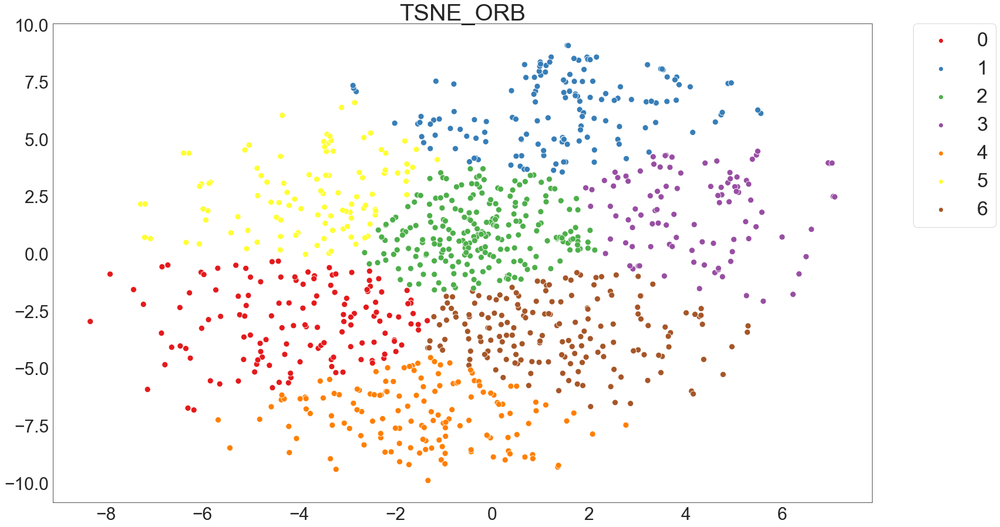

In [148]:
# Visualisation des clusters
outils_nlp.affiche_projection_par_clusters(X_proj_tsne_orb,
                                           kmeans_tsne_orb_labels,
                                           type_donnee)

**Bilan** :
***
- Le score ARI est faible (0.029).
- Cette combinaison TSNE ORB sur les images ne parvient pas à retrouver les 7 catégories comme le souhaite notre client 
- Il manque la catégorie 'Home Decor & Festive Needs'. 

**Qualité de la catégorisation ?**

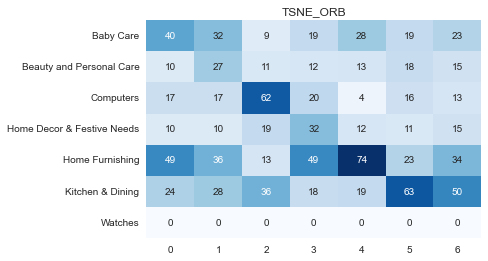

'Précision: 28.38%'

In [149]:
dico_categories = {'0': 'Home Furnishing',
                   '4': 'Home Furnishing',
                   '2': 'Kitchen & Dining',
                   '3': 'Home Decor & Festive Needs',
                   '1': 'Computers',
                   '5': 'Beauty and Personal Care',
                   '6': 'Baby Care'}
outils_nlp.affiche_qualite_categorisation(df_tsne_orb,
                                          dico_categories, type_donnee)

In [150]:
# Sauvegarde des précisions de la catégorisation
df_precision = outils_nlp.sauvegarde_precision(df_precision, '28',
                                               type_donnee)
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_precision, 'IMAGES_data_df_precision.csv')

**Erreurs**

In [151]:
# Nombre d'erreur
mask = df_tsne_orb['CATEGORIE'] == df_tsne_orb['Cluster_labels']
df_erreur_orb = df_tsne_orb[~mask]
display(f'Nombre d\'erreurs : {df_erreur_orb.shape[0]}')

"Nombre d'erreurs : 752"

**Répartition des erreurs par catégorie**

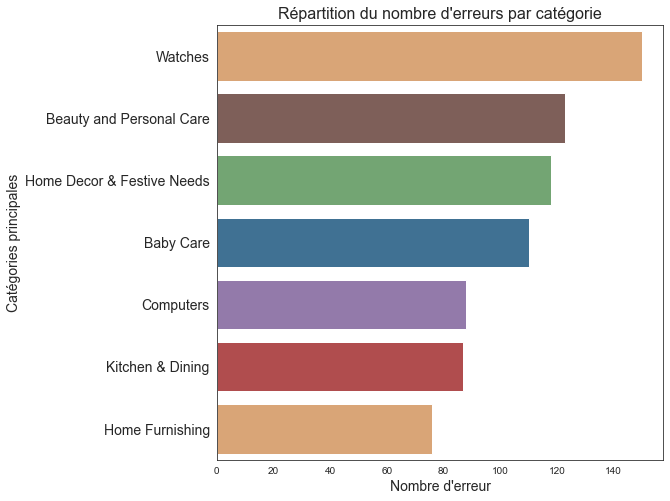

In [152]:
# Répartition des erreurs par catégorie
plt.figure(figsize=(8, 8))
sns.countplot(y='CATEGORIE', data=df_erreur_orb, orient='h',
              order=df_erreur_orb['CATEGORIE'].value_counts().index,
              palette=['#e9a467', '#845b53', '#6bad6b', '#3274a1',
                       '#9372b2', '#c03d3e'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=16)
plt.xlabel('Nombre d\'erreur', fontsize=14)
plt.ylabel('Catégories principales', fontsize=14)
plt.yticks(fontsize=14)
plt.show()

**Répartition des erreurs des catégories par catégorie**

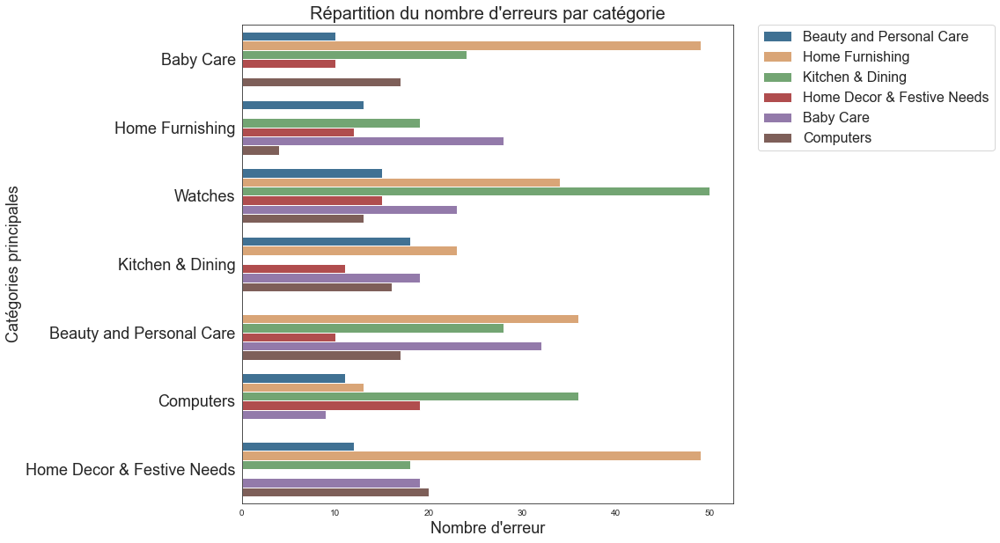

In [153]:
# Répartition des erreurs des catégories par catégorie
plt.figure(figsize=(10, 10))
sns.countplot(y='CATEGORIE', hue='Cluster_labels',
              data=df_erreur_orb, orient='h',
              palette=['#3274a1', '#e9a467', '#6bad6b', '#c03d3e',
                       '#9372b2', '#845b53', '#d684bd'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=20)
plt.xlabel('Nombre d\'erreur', fontsize=18)
plt.ylabel('Catégories principales', fontsize=18)
plt.yticks(fontsize=18)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=16)
plt.show()

**Exemple d'erreurs**

In [154]:
def path_to_image_photo_html(path):
    return '<img src="' + path + ' " width="100">'

In [155]:
df_visu_erreur_orb = df_erreur_orb[['CATEGORIE', 'IMAGE_LOC',
                                    'Cluster_labels']].sample(10)
display(HTML(
    df_visu_erreur_orb.
    to_html(escape=False,
            formatters=dict(IMAGE_LOC=path_to_image_photo_html))))

,CATEGORIE,IMAGE_LOC,Cluster_labels
1008,Kitchen & Dining,,Home Decor & Festive Needs
95,Home Decor & Festive Needs,,Home Furnishing
134,Kitchen & Dining,,Baby Care
84,Home Decor & Festive Needs,,Kitchen & Dining
425,Computers,,Kitchen & Dining
331,Beauty and Personal Care,,Home Furnishing
957,Home Decor & Festive Needs,,Home Furnishing
1009,Home Decor & Festive Needs,,Kitchen & Dining
911,Home Decor & Festive Needs,,Home Furnishing
250,Home Decor & Festive Needs,,Computers


**Comparaison avec classification supervisée**

In [156]:
# Chargement des dataframes de sauvegarde des scores classif supervisée
df_scores_classif_sup = pd.read_csv('IMAGES_data_scores_class_sup.csv')
# Suppression de l'entête des objets
df_scores_classif_sup.drop(0, 0, inplace=True)

In [157]:
data_cat = data['Categorie_1']

In [158]:
outils_nlp.classifier_pycaret(data_cat, df_orb_vectors, type_donnee)

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.001s...
[t-SNE] Computed neighbors for 1050 samples in 0.056s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 8.599845
[t-SNE] KL divergence after 250 iterations with early exaggeration: 101.345596
[t-SNE] KL divergence after 1900 iterations: 1.717618


IntProgress(value=0, description='Processing: ', max=3)

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,12:34:49
Status,. . . . . . . . . . . . . . . . . .,Preparing Data for Modeling


ValueError: Setting a random_state has no effect since shuffle is False. You should leave random_state to its default (None), or set shuffle=True.

In [ ]:
# Sauvegarde des résultats
df_scores_classif_sup = \
    outils_images.sauvegarder_accuracy_class_sup_pycaret(
        df_scores_classif_sup, '0.2630', '0.2975', type_donnee)
df_scores_classif_sup[df_scores_classif_sup['Type_données'] == type_donnee]

**Bilan** :
- La classification supervisée obtient de meilleurs résultats avec 30% de précision contre 25% pour le clustering non supervisé. 
- Mais ni la technique SIFT, ni la technique ORB ne parvient à trouver les 7 catégories sur notre jeu de données et ne peuvent être donc envisagées.

# CNN - Convolution Neural Network

- Les réseaux de neurones convolutifs ont une méthodologie similaire à celle des méthodes traditionnelles d'apprentissage supervisé : ils reçoivent des images en entrée, détectent les features de chacune d'entre elles, puis entraînent un classifieur dessus.
- Les CNN réalisent eux-mêmes tout le boulot fastidieux d'extraction et description de features : lors de la phase d'entraînement, l'erreur de classification est minimisée afin d'optimiser les paramètres du classifieur ET les features.
[Source openclassrooms]


- Pour les application Keras : [Source](https://keras.io/api/applications/)

## VGG16

- VGG-16 est une version du réseau de neurones convolutif VGG-Net.
- VGG-16 est constitué de plusieurs couches, dont 13 couches de convolution et 3 fully-connected. Il doit donc apprendre les poids de 16 couches.
- Il prend en entrée une image en couleurs de taille 224  × 224 px et la classifie dans une des 1000 classes. Il renvoie donc un vecteur de taille 1000, qui contient les probabilités d'appartenance à chacune des classes. 
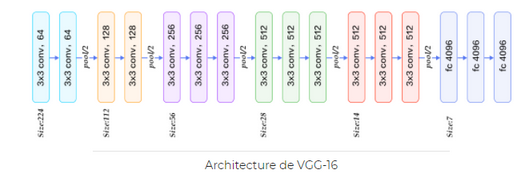

**Utilisation de VGG16 pré-entraîné sur ImageNet**

- Utilisation du modèle VGG16 pré-entraîné sur ImageNet (ImageNet est un projet de recherche visant à développer une grande base de données d'images avec des annotations, c'est-à-dire des images et leurs descriptions).

[Source](https://machinelearningmastery.com/use-pre-trained-vgg-model-classify-objects-photographs/)

**ÉTAPE 1 - Chargement des images, extraction des features**

In [165]:
# Utilisation de VGG16 pré-entraîné sur ImageNet avec les images d'origine
# VGG16 imports
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input

# Liste
vgg16_all_features = []

# Instanciation du modèle
model_vgg16 = VGG16(weights='imagenet', include_top=False)
# Résumé de l'architecture du modèle
model_vgg16.summary()

for rep_image in data['image_loc']:

    # Charger l'image et la redimensionner à la taille
    # requise de 224×224 pixels.
    img = tf.keras.preprocessing.image.load_img(rep_image, target_size=(224, 224))
    # Convertir les pixels en un tableau NumPy afin de pouvoir travailler
    # avec dans Keras
    img = tf.keras.preprocessing.image.img_to_array(img)
    # Redimensionnement
    img = np.expand_dims(img, axis=0)
    # Préparer de nouvelles entrées pour le réseau.
    img = preprocess_input(img)

    # obtenir une prédiction de la probabilité d'appartenance
    # de l'image à chacun des 1000 types d'objets connus.
    vgg16_feature = model_vgg16.predict(img)
    # Ajouter la feature prédite en nparray à la liste
    vgg16_all_features.append(np.array(vgg16_feature).flatten())


Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0     

1/1 [==============================] - 0s 174ms/step


1/1 [==============================] - 0s 167ms/step


1/1 [==============================] - 0s 162ms/step


In [166]:
# Dataframe de sauvegarde des BOVW VGG16
# Association des features à chaque image
data['vgg16_bovw'] = [vgg16_all_features[i] for i in range(data.shape[0])]
# Dataframe de travail
df_vgg16_bovw = data[['image', 'image_loc', 'Categorie_1', 'vgg16_bovw']]
# Constituer le dataframe de vecteurs de BOVW VGG16
df_vgg16_vectors = pd.DataFrame.from_records(vgg16_all_features)

In [169]:
# Sauvegarde du dataframe des vectors BOVW VGG16
with open('sauvegarde/df_vgg16_vectors.pickle', 'wb') as f:
    pickle.dump(df_vgg16_vectors, f, pickle.HIGHEST_PROTOCOL)

**ÉTAPE 2 - Réduction de dimension**

In [170]:
type_donnee = 'TSNE_VGG16'

In [171]:
# t-SNE tuning du paramètre perplexity sans initialisation PCA
top_depart = time.time()
liste_param = [20, 30, 40, 50, 70, 80]
results_vgg16 = list()
tsne_results_vgg16 = []
for i in liste_param:
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=500,
                random_state=seed)
    tsne_results_vgg16 = \
        tsne.fit_transform(df_vgg16_vectors)
    results_vgg16.append(tsne_results_vgg16)
print('t-SNE terminée! en : {} seconds'.format(time.time()-top_depart))

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.023s...
[t-SNE] Computed neighbors for 1050 samples in 0.999s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 451.088593
[t-SNE] KL divergence after 250 iterations with early exaggeration: 115.287521
[t-SNE] KL divergence after 500 iterations: 2.006213
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.023s...
[t-SNE] Computed neighbors for 1050 samples in 1.026s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 481.505948
[t-SNE] KL divergence after 250 iterations with early exaggeration: 111.760925
[t-SNE] KL divergence after 500 iterations: 1.869346
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.023s...
[t-SNE] Computed neighbors for 1050 samples

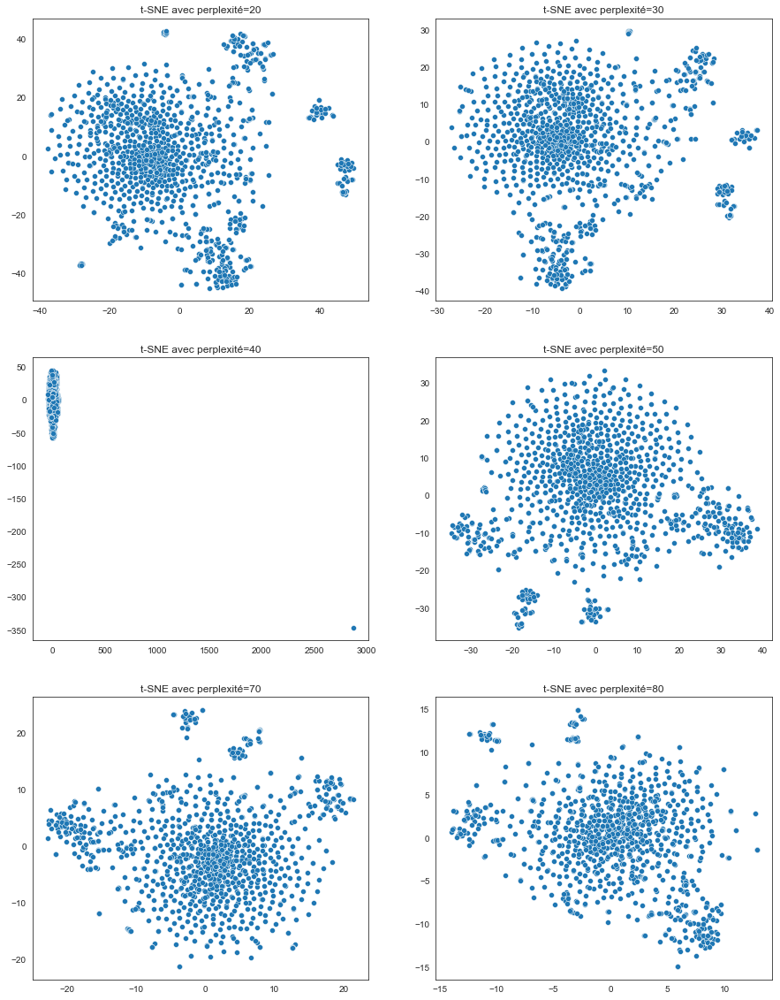

In [172]:
# Visualisation en 2D des différents résultats selon la perplexité
outils_segmentation.affiche_tsne(results_vgg16, liste_param, 1)

- groupes plus homogènes pour perplexité=80
- on laissera les paramètres learning_rate et n_iter à 5000 et le nombre de composants par défaut (2).

In [173]:
# Réduction de dimension tsne
tsne_vgg16 = TSNE(verbose=1, perplexity=40, n_iter=5000)
X_proj_tsne_vgg16 = \
    tsne_vgg16.fit_transform(df_vgg16_vectors)
# Dataframe pour clustering
df_tsne_vgg16 = pd.DataFrame({'VAR1' : X_proj_tsne_vgg16[:, 0],
                              'VAR2' : X_proj_tsne_vgg16[:, 1],
                              'CATEGORIE' : df_vgg16_bovw['Categorie_1'],
                              'IMAGE': df_vgg16_bovw['image'],
                              'IMAGE_LOC': df_vgg16_bovw['image_loc']})

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.023s...
[t-SNE] Computed neighbors for 1050 samples in 1.004s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 504.606731
[t-SNE] KL divergence after 250 iterations with early exaggeration: 117.451988
[t-SNE] KL divergence after 4750 iterations: 1.689604


**Clustering**

In [104]:
cols = ['VAR1', 'VAR2']

In [106]:
# Chargement des dataframes de sauvegarde des scores
df_scores = pd.read_csv('Sauvegarde des résultats/IMAGES_data_df_scores.csv')
# Suppression de l'entête des objets
df_scores.drop(0, 0, inplace=True)

In [107]:
# Chargement des dataframes de sauvegarde des précisions
df_precision = pd.read_csv('Sauvegarde des résultats/IMAGES_data_df_precision.csv')
# Suppression de l'entête des objets
df_precision.drop(0, 0, inplace=True)

In [108]:
# Chargement des dataframes de sauvegarde des métriques de clustering
df_metrics_clust = pd.read_csv('Sauvegarde des résultats/IMAGES_data_kmeans_metrics.csv')
# Suppression de l'entête des objets
df_metrics_clust.drop(0, 0, inplace=True)

In [178]:
# Tuning hyperparametres n_init, max_iter
# Paramètres à tester
n_init = [10, 20, 30, 50, 70, 80, 100]
max_iter = [100, 200, 300, 400, 500]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_clust = \
    outils_nlp.calcul_metrics_kmeans(df_tsne_vgg16[cols],
                                     df_metrics_clust,
                                     type_donnee,
                                     seed, n_init, max_iter)
# Tri par indice de dispersion : proche de 0
df_metrics_clust[df_metrics_clust['Type_données'] == type_donnee] \
    .sort_values(by=['coef_silh', 'davies_bouldin', 'Durée (s)'],
                 ascending=[False, True, True]).style.hide_index()

Type_données,Param_k,dispersion,Durée (s),n_init,max_iter,coef_silh,davies_bouldin
TSNE_VGG16,nan,22646.179688,0.569672,70.000000,400.000000,0.389699,0.807511
TSNE_VGG16,nan,22646.177734,0.573669,70.000000,500.000000,0.389699,0.807511
TSNE_VGG16,nan,22646.179688,0.576668,70.000000,200.000000,0.389699,0.807511
TSNE_VGG16,nan,22646.179688,0.577667,70.000000,300.000000,0.389699,0.807511
TSNE_VGG16,nan,22646.177734,0.580665,70.000000,100.000000,0.389699,0.807511
TSNE_VGG16,nan,22646.179688,0.635633,80.000000,500.000000,0.389699,0.807511
TSNE_VGG16,nan,22646.179688,0.639632,80.000000,300.000000,0.389699,0.807511
TSNE_VGG16,nan,22646.179688,0.643630,80.000000,100.000000,0.389699,0.807511
TSNE_VGG16,nan,22646.179688,0.646627,80.000000,200.000000,0.389699,0.807511
TSNE_VGG16,nan,22646.177734,0.648626,80.000000,400.000000,0.389699,0.807511


In [179]:
# Instanciation du modèle KMeans avec les meilleurs paramètres
kmeans_tsne_vgg16 = KMeans(n_clusters=7, init='k-means++',
                           n_init=10, max_iter=200,
                           random_state=seed) \
    .fit(df_tsne_vgg16[cols])
# Ajout de l'assignation du cluster au dataframe
df_tsne_vgg16['Clusters'] = kmeans_tsne_vgg16.labels_
kmeans_tsne_vgg16_labels = kmeans_tsne_vgg16.labels_

In [180]:
# Scores ?
df_scores = outils_nlp.calcul_metriques_clusters(df_tsne_vgg16,
                                                 df_scores,
                                                 type_donnee)
df_scores[df_scores['Type_données'] == type_donnee].style.hide_index()

Type_données,ARI,Homogénéité,Complétude,V-measure
TSNE_VGG16,0.302943,0.424121,0.436073,0.430014


In [181]:
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_scores, 'IMAGES_data_df_scores.csv')

Clusters,Nombre,%
0,138,13.140000
1,264,25.140000
2,94,8.950000
3,147,14.000000
4,107,10.190000
5,164,15.620000
6,136,12.950000


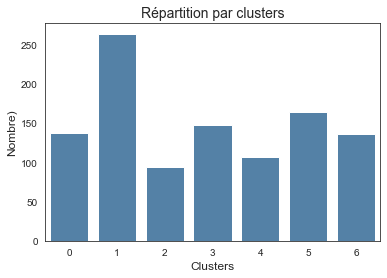

In [182]:
outils_nlp.affiche_repartition_par_clusters(kmeans_tsne_vgg16_labels)

In [183]:
# Les catégories par clusters
df_tsne_vgg16.groupby('Clusters')['CATEGORIE'].value_counts(). \
    to_frame()

CATEGORIE
Clusters CATEGORIE                            
0        Computers                          57
         Kitchen & Dining                   41
         Beauty and Personal Care           13
         Home Decor & Festive Needs         13
         Watches                            10
         Baby Care                           2
         Home Furnishing                     2
1        Home Decor & Festive Needs         72
         Computers                          67
         Home Furnishing                    38
         Baby Care                          34
         Beauty and Personal Care           28
         Kitchen & Dining                   20
         Watches                             5
2        Kitchen & Dining                   82
         Beauty and Personal Care           10
         Baby Care                           2
3        Home Furnishing                    52
         Home Decor & Festive Needs         50
         Baby Care                          22
         Computers                          17
         Kitchen & Dining                    3
         Beauty and Personal Care            2
         Watches                             1
4        Beauty and Personal Care           86
         Computers                           9
         Home Decor & Festive Needs          6
         Kitchen & Dining                    4
         Home Furnishing                     2
5        Baby Care                          90
         Home Furnishing                    56
         Beauty and Personal Care           11
         Home Decor & Festive Needs          7
6        Watches                           134
         Home Decor & Festive Needs          2

**Visualisation des clusters**

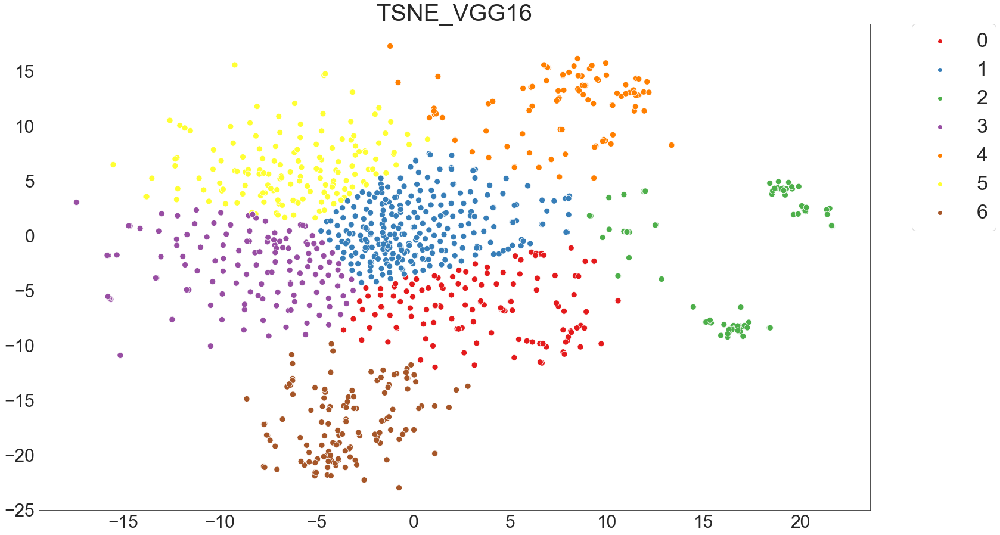

In [184]:
# Visualisation des clusters
outils_nlp.affiche_projection_par_clusters(X_proj_tsne_vgg16,
                                           kmeans_tsne_vgg16_labels,
                                           type_donnee)

**Bilan** :
***
- Le score ARI est  (0.35).
- Cette combinaison TSNE VGG16 sur les images ne parvient pas à retrouver les 7 catégories comme le souhaite notre client 
- Il manque la catégorie 'Home Decor & Festive Needs'. 

**Qualité de la catégorisation ?**

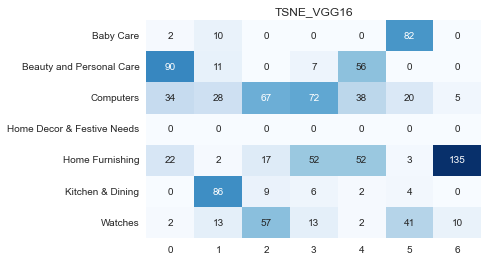

'Précision: 13.9%'

In [185]:
dico_categories = {'0': 'Watches',
                   '1': 'Computers',
                   '2': 'Baby Care',
                   '3': 'Home Furnishing',
                   '4': 'Kitchen & Dining',
                   '5': 'Beauty and Personal Care',
                   '6': 'Home Furnishing'}
outils_nlp.affiche_qualite_categorisation(df_tsne_vgg16,
                                          dico_categories, type_donnee)

In [186]:
# Sauvegarde des précisions de la catégorisation
df_precision = outils_nlp.sauvegarde_precision(df_precision, '58',
                                               type_donnee)
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_precision, 'IMAGES_data_df_precision.csv')

**Erreurs**

In [187]:
# Nombre d'erreur
mask = df_tsne_vgg16['CATEGORIE'] == df_tsne_vgg16['Cluster_labels']
df_erreur_vgg16 = df_tsne_vgg16[~mask]
display(f'Nombre d\'erreurs : {df_erreur_vgg16.shape[0]}')

"Nombre d'erreurs : 904"

**Répartition des erreurs par catégorie**

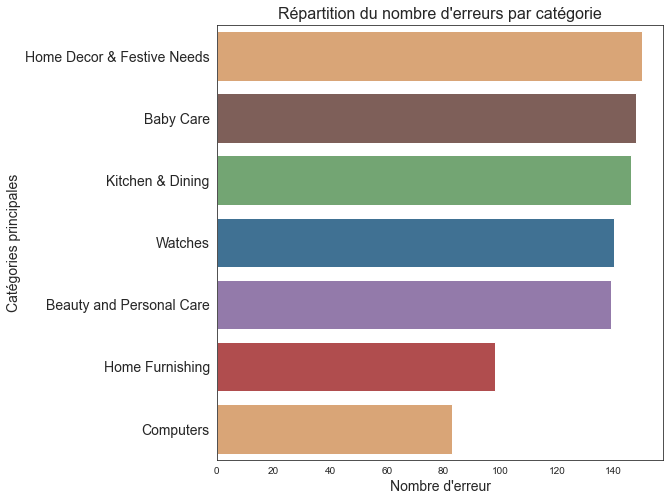

In [188]:
# Répartition des erreurs par catégorie
plt.figure(figsize=(8, 8))
sns.countplot(y='CATEGORIE', data=df_erreur_vgg16, orient='h',
              order=df_erreur_vgg16['CATEGORIE'].value_counts().index,
              palette=['#e9a467', '#845b53', '#6bad6b', '#3274a1',
                       '#9372b2', '#c03d3e'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=16)
plt.xlabel('Nombre d\'erreur', fontsize=14)
plt.ylabel('Catégories principales', fontsize=14)
plt.yticks(fontsize=14)
plt.show()

**Répartition des erreurs des catégories par catégorie**

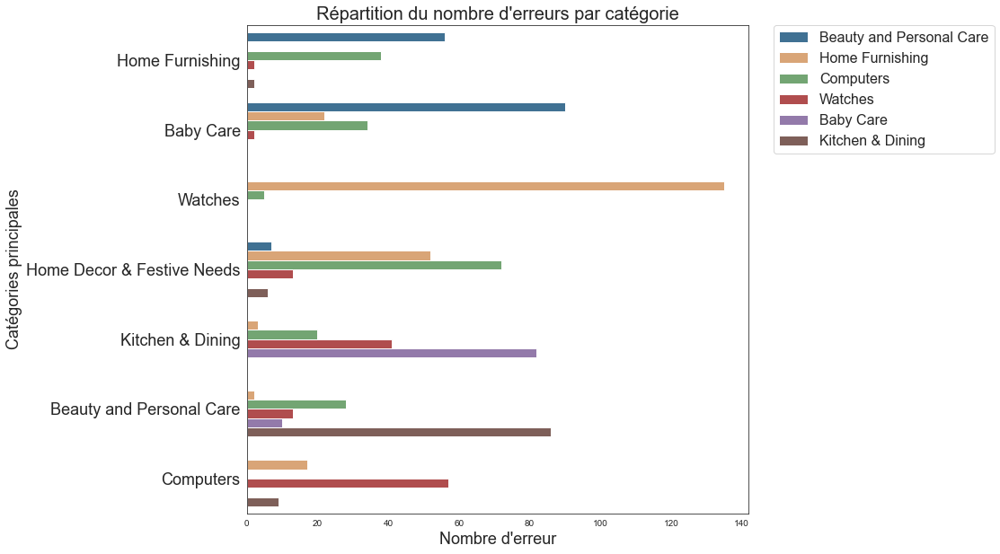

In [189]:
# Répartition des erreurs des catégories par catégorie
plt.figure(figsize=(10, 10))
sns.countplot(y='CATEGORIE', hue='Cluster_labels',
              data=df_erreur_vgg16, orient='h',
              palette=['#3274a1', '#e9a467', '#6bad6b', '#c03d3e',
                       '#9372b2', '#845b53', '#d684bd'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=20)
plt.xlabel('Nombre d\'erreur', fontsize=18)
plt.ylabel('Catégories principales', fontsize=18)
plt.yticks(fontsize=18)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=16)
plt.show()

**Exemple d'erreurs**

In [190]:
def path_to_image_photo_html(path):
    return '<img src="' + path + ' " width="100">'

In [191]:
df_visu_erreur_vgg16 = df_erreur_vgg16[['CATEGORIE', 'IMAGE_LOC',
                                        'Cluster_labels']].sample(10)
display(HTML(
    df_visu_erreur_vgg16.
    to_html(escape=False,
            formatters=dict(IMAGE_LOC=path_to_image_photo_html))))

,CATEGORIE,IMAGE_LOC,Cluster_labels
123,Home Decor & Festive Needs,,Computers
949,Home Furnishing,,Beauty and Personal Care
387,Beauty and Personal Care,,Kitchen & Dining
202,Baby Care,,Beauty and Personal Care
1027,Home Furnishing,,Beauty and Personal Care
308,Home Decor & Festive Needs,,Home Furnishing
610,Home Decor & Festive Needs,,Home Furnishing
911,Home Decor & Festive Needs,,Computers
192,Kitchen & Dining,,Computers
1031,Beauty and Personal Care,,Baby Care


## InceptionV3

- Inception v3 est un réseau de neurones convolutif destiné à aider à l'analyse d'images et à la détection d'objets, et a débuté comme module pour Googlenet. 
- Il s'agit de la troisième édition du réseau de neurones convolutif Inception de Google, initialement présenté lors du défi de reconnaissance ImageNet. 
- Tout comme ImageNet peut être considéré comme une base de données d'objets visuels classés, Inception aide à la classification d'objets dans le monde de la vision par ordinateur. 
- Le nom original (Inception) a reçu ce nom de code après qu'un mème internet populaire "'we need to go deeper'" est devenu viral, citant une phrase du film Inception de Christopher Nolan.
![image-8.png](attachment:image-8.png)
[Source](https://www.researchgate.net/figure/Schematic-diagram-of-the-Inception-v3-model-based-on-convolutional-neural-networks_fig3_337200783)

**Utilisation de InceptionV3 pré-entraîné sur ImageNet**

**ÉTAPE 1 - Chargement des images, extraction des features**

In [68]:
# Utilisation de InceptionV3 pré-entraîné sur ImageNet avec les images
# d'origine
# InceptionV3 imports
from keras.applications.inception_v3 import preprocess_input
from keras.applications import InceptionV3

# Liste
incep_all_features = []

# Instanciation du modèle
model_incep = InceptionV3(weights='imagenet', include_top=False)
# Résumé de l'architecture du modèle
model_incep.summary()

for rep_image in data['image_loc']:

    # Charger l'image et la redimensionner à la taille
    # requise de 224×224 pixels.
    img = tf.keras.preprocessing.image.load_img(rep_image, target_size=(224, 224))
    # Convertir les pixels en un tableau NumPy afin de pouvoir travailler
    # avec dans Keras
    img = tf.keras.preprocessing.image.img_to_array(img)
    # Redimensionnement
    img = np.expand_dims(img, axis=0)
    # Préparer de nouvelles entrées pour le réseau.
    img = preprocess_input(img)

    # obtenir une prédiction de la probabilité d'appartenance
    # de l'image à chacun des 1000 types d'objets connus.
    incep_feature = model_incep.predict(img)
    # Ajouter la feature prédite en nparray à la liste
    incep_all_features.append(np.array(incep_feature).flatten())

incep_all_features = np.array(incep_all_features)

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv2d_94 (Conv2D)             (None, None, None,   864         ['input_2[0][0]']                
                                32)                                                               
                                                                                                  
 batch_normalization_94 (BatchN  (None, None, None,   96         ['conv2d_94[0][0]']              
 ormalization)                  32)                                                    

                                                                                                  
 average_pooling2d_9 (AveragePo  (None, None, None,   0          ['max_pooling2d_5[0][0]']        
 oling2D)                       192)                                                              
                                                                                                  
 conv2d_99 (Conv2D)             (None, None, None,   12288       ['max_pooling2d_5[0][0]']        
                                64)                                                               
                                                                                                  
 conv2d_101 (Conv2D)            (None, None, None,   76800       ['activation_100[0][0]']         
                                64)                                                               
                                                                                                  
 conv2d_10

                                                                                                  
 conv2d_112 (Conv2D)            (None, None, None,   16384       ['average_pooling2d_10[0][0]']   
                                64)                                                               
                                                                                                  
 batch_normalization_106 (Batch  (None, None, None,   192        ['conv2d_106[0][0]']             
 Normalization)                 64)                                                               
                                                                                                  
 batch_normalization_108 (Batch  (None, None, None,   192        ['conv2d_108[0][0]']             
 Normalization)                 64)                                                               
                                                                                                  
 batch_nor

                                                                                                  
 batch_normalization_119 (Batch  (None, None, None,   192        ['conv2d_119[0][0]']             
 Normalization)                 64)                                                               
                                                                                                  
 activation_113 (Activation)    (None, None, None,   0           ['batch_normalization_113[0][0]']
                                64)                                                               
                                                                                                  
 activation_115 (Activation)    (None, None, None,   0           ['batch_normalization_115[0][0]']
                                64)                                                               
                                                                                                  
 activatio

                                128)                                                              
                                                                                                  
 conv2d_130 (Conv2D)            (None, None, None,   114688      ['activation_129[0][0]']         
                                128)                                                              
                                                                                                  
 batch_normalization_125 (Batch  (None, None, None,   384        ['conv2d_125[0][0]']             
 Normalization)                 128)                                                              
                                                                                                  
 batch_normalization_130 (Batch  (None, None, None,   384        ['conv2d_130[0][0]']             
 Normalization)                 128)                                                              
          

 Normalization)                 160)                                                              
                                                                                                  
 activation_138 (Activation)    (None, None, None,   0           ['batch_normalization_138[0][0]']
                                160)                                                              
                                                                                                  
 conv2d_139 (Conv2D)            (None, None, None,   179200      ['activation_138[0][0]']         
                                160)                                                              
                                                                                                  
 batch_normalization_139 (Batch  (None, None, None,   480        ['conv2d_139[0][0]']             
 Normalization)                 160)                                                              
          

 activation_142 (Activation)    (None, None, None,   0           ['batch_normalization_142[0][0]']
                                192)                                                              
                                                                                                  
 activation_143 (Activation)    (None, None, None,   0           ['batch_normalization_143[0][0]']
                                192)                                                              
                                                                                                  
 mixed5 (Concatenate)           (None, None, None,   0           ['activation_134[0][0]',         
                                768)                              'activation_137[0][0]',         
                                                                  'activation_142[0][0]',         
                                                                  'activation_143[0][0]']         
          

 batch_normalization_147 (Batch  (None, None, None,   576        ['conv2d_147[0][0]']             
 Normalization)                 192)                                                              
                                                                                                  
 batch_normalization_152 (Batch  (None, None, None,   576        ['conv2d_152[0][0]']             
 Normalization)                 192)                                                              
                                                                                                  
 batch_normalization_153 (Batch  (None, None, None,   576        ['conv2d_153[0][0]']             
 Normalization)                 192)                                                              
                                                                                                  
 activation_144 (Activation)    (None, None, None,   0           ['batch_normalization_144[0][0]']
          

 conv2d_154 (Conv2D)            (None, None, None,   147456      ['mixed6[0][0]']                 
                                192)                                                              
                                                                                                  
 conv2d_157 (Conv2D)            (None, None, None,   258048      ['activation_156[0][0]']         
                                192)                                                              
                                                                                                  
 conv2d_162 (Conv2D)            (None, None, None,   258048      ['activation_161[0][0]']         
                                192)                                                              
                                                                                                  
 conv2d_163 (Conv2D)            (None, None, None,   147456      ['average_pooling2d_15[0][0]']   
          

 batch_normalization_165 (Batch  (None, None, None,   960        ['conv2d_165[0][0]']             
 Normalization)                 320)                                                              
                                                                                                  
 batch_normalization_169 (Batch  (None, None, None,   576        ['conv2d_169[0][0]']             
 Normalization)                 192)                                                              
                                                                                                  
 activation_165 (Activation)    (None, None, None,   0           ['batch_normalization_165[0][0]']
                                320)                                                              
                                                                                                  
 activation_169 (Activation)    (None, None, None,   0           ['batch_normalization_169[0][0]']
          

                                384)                                                              
                                                                                                  
 activation_173 (Activation)    (None, None, None,   0           ['batch_normalization_173[0][0]']
                                384)                                                              
                                                                                                  
 activation_176 (Activation)    (None, None, None,   0           ['batch_normalization_176[0][0]']
                                384)                                                              
                                                                                                  
 activation_177 (Activation)    (None, None, None,   0           ['batch_normalization_177[0][0]']
                                384)                                                              
          

 Normalization)                 384)                                                              
                                                                                                  
 batch_normalization_186 (Batch  (None, None, None,   1152       ['conv2d_186[0][0]']             
 Normalization)                 384)                                                              
                                                                                                  
 conv2d_187 (Conv2D)            (None, None, None,   393216      ['average_pooling2d_17[0][0]']   
                                192)                                                              
                                                                                                  
 batch_normalization_179 (Batch  (None, None, None,   960        ['conv2d_179[0][0]']             
 Normalization)                 320)                                                              
          

1/1 [==============================] - 0s 56ms/step


1/1 [==============================] - 0s 77ms/step


1/1 [==============================] - 0s 76ms/step


In [69]:
# Dataframe de sauvegarde des BOVW InceptionV3
# Association des features à chaque image
data['incep_bovw'] = \
    [incep_all_features[i] for i in range(data.shape[0])]
# Dataframe de travail
df_incep_bovw = \
    data[['image', 'image_loc', 'Categorie_1', 'incep_bovw']]
# Constituer le dataframe de vecteurs de BOVW InceptionV3
df_incep_vectors = pd.DataFrame.from_records(incep_all_features)

In [71]:
# Sauvegarde du dataframe des vectors BOVW InceptionV3
with open('sauvegarde pickle/df_incep_vectors.pickle', 'wb') as f:
    pickle.dump(df_incep_vectors, f, pickle.HIGHEST_PROTOCOL)

In [207]:
# Sauvegarde du dataframe des vectors BOVW InceptionV3
with open('sauvegarde pickle/df_incep_bovw.pickle', 'wb') as f:
    pickle.dump(df_incep_bovw, f, pickle.HIGHEST_PROTOCOL)

**ÉTAPE 2 - Réduction de dimension**

In [72]:
type_donnee = 'TSNE_INCEPTIONV3'

In [73]:
# t-SNE tuning du paramètre perplexity sans initialisation PCA
top_depart = time.time()
liste_param = [20, 30, 40, 50, 70, 80]
results_incep = list()
tsne_results_incep = []
for i in liste_param:
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=500,
                random_state=seed)
    tsne_results_incep = \
        tsne.fit_transform(df_incep_vectors)
    results_incep.append(tsne_results_incep)
print('t-SNE terminée! en : {} seconds'.format(time.time()-top_depart))

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.045s...
[t-SNE] Computed neighbors for 1050 samples in 2.191s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 51.085379
[t-SNE] KL divergence after 250 iterations with early exaggeration: 100.800247
[t-SNE] KL divergence after 500 iterations: 1.466016
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.045s...
[t-SNE] Computed neighbors for 1050 samples in 1.971s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 54.551365
[t-SNE] KL divergence after 250 iterations with early exaggeration: 98.881134
[t-SNE] KL divergence after 500 iterations: 1.565223
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.045s...
[t-SNE] Computed neighbors for 1050 samples in

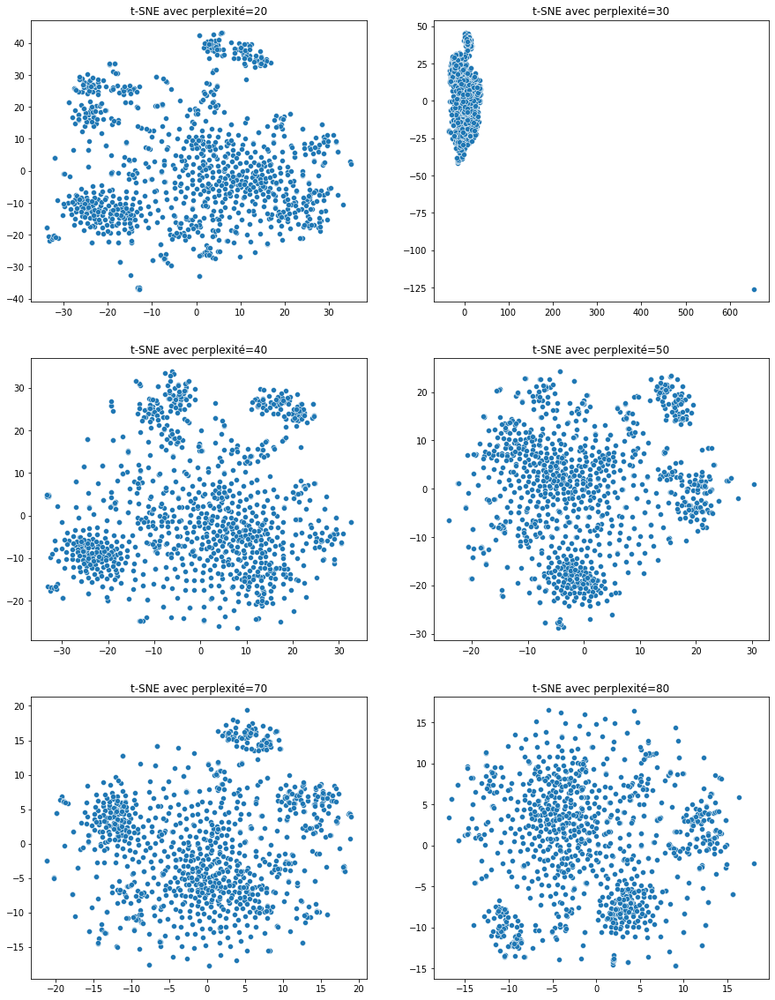

In [74]:
# Visualisation en 2D des différents résultats selon la perplexité
outils_segmentation.affiche_tsne(results_incep, liste_param, 1)

- groupes plus homogènes pour perplexité=30
- on laissera les paramètres learning_rate et n_iter à 5000 et le nombre de composants par défaut (2).

In [75]:
# Réduction de dimension tsne
tsne_incep = TSNE(verbose=1, perplexity=30, n_iter=5000)
X_proj_tsne_incep = \
    tsne_incep.fit_transform(df_incep_vectors)
# Dataframe pour clustering
df_tsne_incep = pd.DataFrame({'VAR1' : X_proj_tsne_incep[:, 0],
                              'VAR2' : X_proj_tsne_incep[:, 1],
                              'CATEGORIE' : df_incep_bovw['Categorie_1'],
                              'IMAGE': df_incep_bovw['image'],
                              'IMAGE_LOC': df_incep_bovw['image_loc']})

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.050s...
[t-SNE] Computed neighbors for 1050 samples in 1.971s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 54.551365
[t-SNE] KL divergence after 250 iterations with early exaggeration: 96.238808
[t-SNE] KL divergence after 2950 iterations: 1.371161


In [103]:
# Sauvegarde du dataframe des vectors BOVW InceptionV3
with open('sauvegarde/df_tsne_incep.pickle', 'wb') as f:
    pickle.dump(df_tsne_incep, f, pickle.HIGHEST_PROTOCOL)

FileNotFoundError: [Errno 2] No such file or directory: 'sauvegarde/df_tsne_incep.pickle'

**Clustering**

In [8]:
cols = ['VAR1', 'VAR2']

In [215]:
# Tuning hyperparametres n_init, max_iter
# Paramètres à tester
n_init = [10, 20, 30, 50, 70, 80, 100]
max_iter = [100, 200, 300, 400, 500]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_clust = \
    outils_nlp.calcul_metrics_kmeans(df_tsne_incep[cols],
                                     df_metrics_clust,
                                     type_donnee,
                                     seed, n_init, max_iter)
# Tri par indice de dispersion : proche de 0
df_metrics_clust[df_metrics_clust['Type_données'] == type_donnee] \
    .sort_values(by=['coef_silh', 'davies_bouldin', 'Durée (s)'],
                 ascending=[False, True, True]).style.hide_index()

Type_données,Param_k,dispersion,Durée (s),n_init,max_iter,coef_silh,davies_bouldin
TSNE_INCEPTIONV3,nan,88382.257812,0.162493,10.000000,200.000000,0.442341,0.743248
TSNE_INCEPTIONV3,nan,88382.250000,0.170503,10.000000,300.000000,0.442341,0.743248
TSNE_INCEPTIONV3,nan,88382.257812,0.170517,10.000000,500.000000,0.442341,0.743248
TSNE_INCEPTIONV3,nan,88382.257812,0.170569,10.000000,400.000000,0.442341,0.743248
TSNE_INCEPTIONV3,nan,88382.257812,0.186876,10.000000,100.000000,0.442341,0.743248
TSNE_INCEPTIONV3,nan,88382.257812,0.240608,20.000000,300.000000,0.442341,0.743248
TSNE_INCEPTIONV3,nan,88382.257812,0.240641,20.000000,400.000000,0.442341,0.743248
TSNE_INCEPTIONV3,nan,88382.257812,0.240681,20.000000,500.000000,0.442341,0.743248
TSNE_INCEPTIONV3,nan,88382.257812,0.240775,20.000000,200.000000,0.442341,0.743248
TSNE_INCEPTIONV3,nan,88382.257812,0.250837,20.000000,100.000000,0.442341,0.743248


In [216]:
# Instanciation du modèle KMeans avec les meilleurs paramètres
kmeans_tsne_incep = KMeans(n_clusters=7, init='k-means++',
                           n_init=10, max_iter=500,
                           random_state=seed) \
    .fit(df_tsne_incep[cols])
# Ajout de l'assignation du cluster au dataframe
df_tsne_incep['Clusters'] = kmeans_tsne_incep.labels_
kmeans_tsne_incep_labels = kmeans_tsne_incep.labels_

In [217]:
# Scores ?
df_scores = outils_nlp.calcul_metriques_clusters(df_tsne_incep,
                                                 df_scores,
                                                 type_donnee)
df_scores[df_scores['Type_données'] == type_donnee].style.hide_index()

Type_données,ARI,Homogénéité,Complétude,V-measure
TSNE_INCEPTIONV3,0.459377,0.524260,0.530770,0.527495


In [218]:
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_scores, 'IMAGES_data_df_scores.csv')

Clusters,Nombre,%
0,203,19.330000
1,192,18.290000
2,148,14.100000
3,139,13.240000
4,143,13.620000
5,106,10.100000
6,119,11.330000


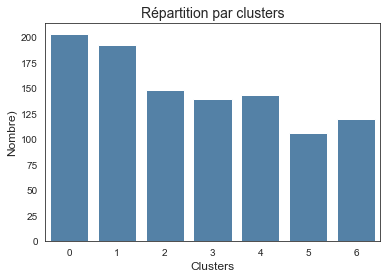

In [219]:
outils_nlp.affiche_repartition_par_clusters(kmeans_tsne_incep_labels)

In [220]:
# Les catégories par clusters
df_tsne_incep.groupby('Clusters')['CATEGORIE'].value_counts(). \
    to_frame()

CATEGORIE
Clusters CATEGORIE                            
0        Watches                           146
         Computers                          25
         Home Decor & Festive Needs         12
         Kitchen & Dining                   11
         Beauty and Personal Care            9
1        Home Decor & Festive Needs        100
         Home Furnishing                    23
         Baby Care                          22
         Kitchen & Dining                   18
         Beauty and Personal Care           14
         Computers                          13
         Watches                             2
2        Beauty and Personal Care          120
         Kitchen & Dining                   17
         Computers                           5
         Baby Care                           4
         Home Decor & Festive Needs          2
3        Baby Care                          88
         Home Furnishing                    37
         Home Decor & Festive Needs         13
         Beauty and Personal Care            1
4        Home Furnishing                    89
         Baby Care                          28
         Home Decor & Festive Needs         11
         Computers                           8
         Beauty and Personal Care            5
         Kitchen & Dining                    1
         Watches                             1
5        Kitchen & Dining                  102
         Home Decor & Festive Needs          3
         Baby Care                           1
6        Computers                          99
         Home Decor & Festive Needs          9
         Baby Care                           7
         Beauty and Personal Care            1
         Home Furnishing                     1
         Kitchen & Dining                    1
         Watches                             1

**Visualisation des clusters**

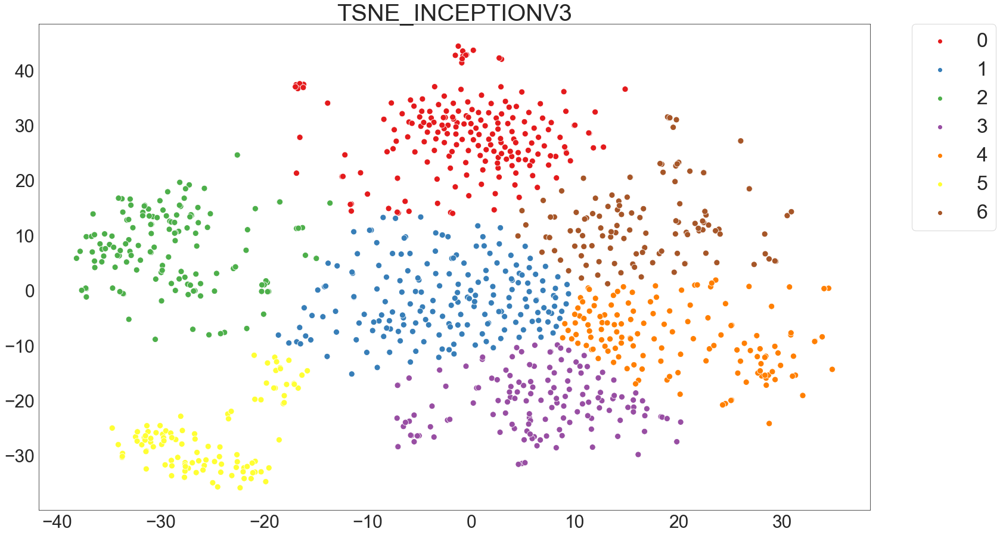

In [221]:
# Visualisation des clusters
outils_nlp.affiche_projection_par_clusters(X_proj_tsne_incep,
                                           kmeans_tsne_incep_labels,
                                           type_donnee)

**Bilan** :
***
- Le score ARI est assez haut (0.51).
- Cette combinaison TSNE InceptionV3 sur les images parvient à retrouver les 7 catégories comme le souhaite notre client avec une précision de 74%. 

**Qualité de la catégorisation ?**

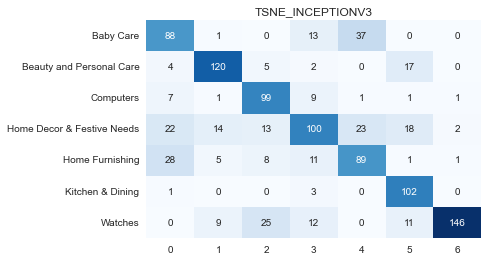

'Précision: 70.86%'

In [222]:
dico_categories = {'2': 'Beauty and Personal Care',
                   '6': 'Computers',
                   '0': 'Watches',
                   '5': 'Kitchen & Dining',
                   '3': 'Baby Care',
                   '1': 'Home Decor & Festive Needs',
                   '4': 'Home Furnishing'}
outils_nlp.affiche_qualite_categorisation(df_tsne_incep,
                                          dico_categories, type_donnee)

In [223]:
# Sauvegarde des précisions de la catégorisation
df_precision = outils_nlp.sauvegarde_precision(df_precision, '71',
                                               type_donnee)
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_precision, 'IMAGES_data_df_precision.csv')

**Erreurs**

In [224]:
# Nombre d'erreur
mask = df_tsne_incep['CATEGORIE'] == df_tsne_incep['Cluster_labels']
df_erreur_incep = df_tsne_incep[~mask]
display(f'Nombre d\'erreurs : {df_erreur_incep.shape[0]}')

"Nombre d'erreurs : 306"

**Répartition des erreurs par catégorie**

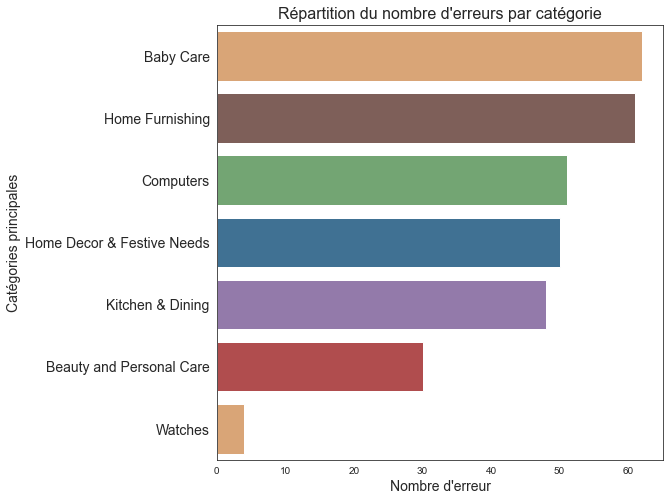

In [225]:
# Répartition des erreurs par catégorie
plt.figure(figsize=(8, 8))
sns.countplot(y='CATEGORIE', data=df_erreur_incep, orient='h',
              order=df_erreur_incep['CATEGORIE'].value_counts().index,
              palette=['#e9a467', '#845b53', '#6bad6b', '#3274a1',
                       '#9372b2', '#c03d3e'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=16)
plt.xlabel('Nombre d\'erreur', fontsize=14)
plt.ylabel('Catégories principales', fontsize=14)
plt.yticks(fontsize=14)
plt.show()

**Répartition des erreurs des catégories par catégorie**

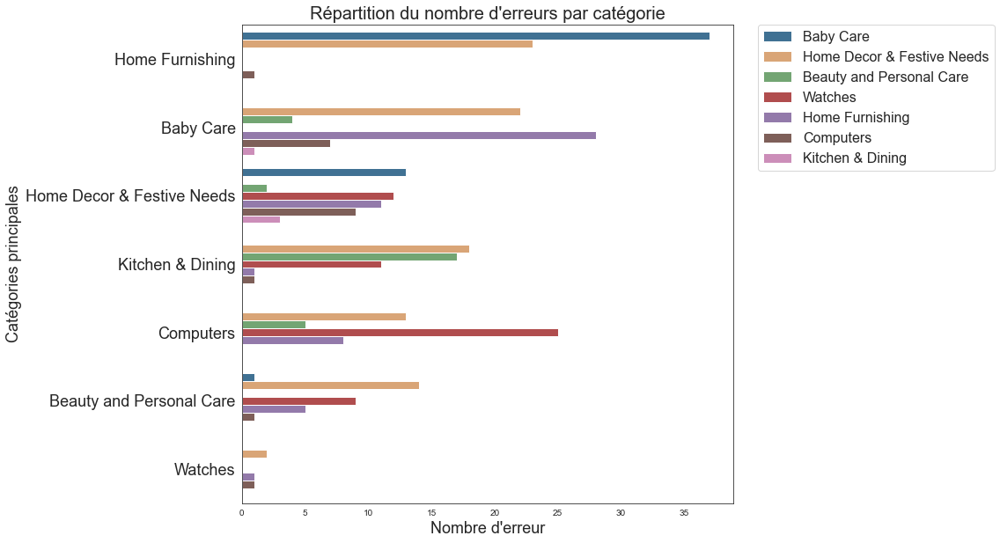

In [226]:
# Répartition des erreurs des catégories par catégorie
plt.figure(figsize=(10, 10))
sns.countplot(y='CATEGORIE', hue='Cluster_labels',
              data=df_erreur_incep, orient='h',
              palette=['#3274a1', '#e9a467', '#6bad6b', '#c03d3e',
                       '#9372b2', '#845b53', '#d684bd'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=20)
plt.xlabel('Nombre d\'erreur', fontsize=18)
plt.ylabel('Catégories principales', fontsize=18)
plt.yticks(fontsize=18)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=16)
plt.show()

**Exemple d'erreurs**

In [227]:
def path_to_image_photo_html(path):
    return '<img src="' + path + ' " width="100">'

In [228]:
df_visu_erreur_incep = df_erreur_incep[['CATEGORIE', 'IMAGE_LOC',
                                        'Cluster_labels']].sample(10)
display(HTML(
    df_visu_erreur_incep.
    to_html(escape=False,
            formatters=dict(IMAGE_LOC=path_to_image_photo_html))))

,CATEGORIE,IMAGE_LOC,Cluster_labels
988,Beauty and Personal Care,,Home Decor & Festive Needs
613,Baby Care,,Home Furnishing
76,Beauty and Personal Care,,Home Decor & Festive Needs
1038,Beauty and Personal Care,,Baby Care
803,Computers,,Watches
192,Kitchen & Dining,,Beauty and Personal Care
41,Home Furnishing,,Baby Care
668,Kitchen & Dining,,Beauty and Personal Care
434,Computers,,Watches
51,Computers,,Home Decor & Festive Needs


# Comparaison des scores/précisions des images

In [4]:
# Dataframe de comparaison des scores ARI et de la précision
df_comparaison = df_scores.merge(df_precision, on='Type_données',how='left')
# Supprime la ligne des types d'objet
df_comparaison['ARI'] = df_comparaison['ARI'].astype(float)
df_comparaison['Homogénéité'] = df_comparaison['Homogénéité'].astype(float)
df_comparaison['Complétude'] = df_comparaison['Complétude'].astype(float)
df_comparaison['V-measure'] = df_comparaison['V-measure'].astype(float)
df_comparaison['Précision'] = df_comparaison['Précision'].astype(float)

#OU
#Enregistrement des résutats ()
#df_scores=pd.read_csv('Sauvegarde des résultats/IMAGES_data_df_scores.csv')
#df_precision=pd.read_csv('Sauvegarde des résultats/IMAGES_data_df_precision.csv')
#df_comparaison=df_comparaison.drop([0])

ValueError: could not convert string to float: 'object'

In [15]:
df_comparaison

,Type_données,ARI,Homogénéité,Complétude,V-measure,Précision
1,TSNE_SIFT,0.047810,0.082016,0.086646,0.084268,28.67
2,TSNE_ORB,0.041031,0.063934,0.065129,0.064526,28.00
3,TSNE_VGG16,0.302943,0.424121,0.436073,0.430014,58.00
4,TSNE_INCEPTIONV3,0.459377,0.524260,0.530770,0.527495,71.00


In [11]:
df_comparaison['ARI'] = df_comparaison['ARI'].astype(float)
df_comparaison['Homogénéité'] = df_comparaison['Homogénéité'].astype(float)
df_comparaison['Complétude'] = df_comparaison['Complétude'].astype(float)
df_comparaison['V-measure'] = df_comparaison['V-measure'].astype(float)
df_comparaison['Précision'] = df_comparaison['Précision'].astype(float)

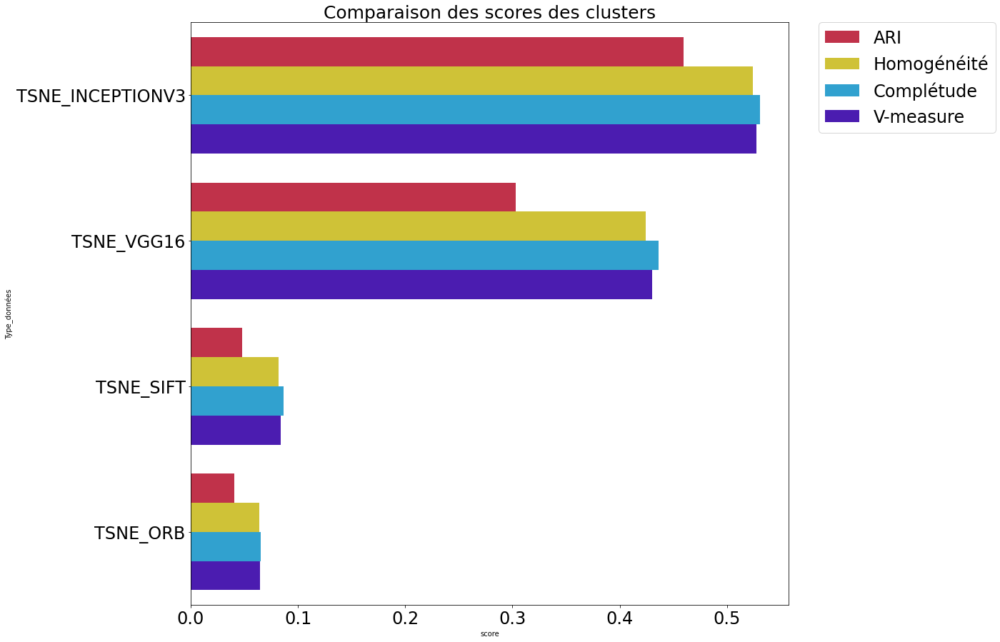

In [12]:
# Comparaison visuelle des algorithmes
df_comp_sort = df_comparaison.sort_values(by='ARI', ascending=False)
comparaison_score_melt = pd.melt(df_comp_sort, id_vars=['Type_données'],
                                 value_name='score',
                                 value_vars=['ARI', 'Homogénéité',
                                             'Complétude', 'V-measure'])
# Visualisation
plt.figure(figsize=(15, 15))
sns.barplot(y=comparaison_score_melt['Type_données'],
            x=comparaison_score_melt['score'],
            hue=comparaison_score_melt['variable'],
            palette=['#d71b3b', '#e8d71e', '#16acea', '#4203c9'])
plt.xticks(fontsize=24)
plt.yticks(fontsize=24)
plt.title('Comparaison des scores des clusters', fontsize=25)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=24)
plt.show()

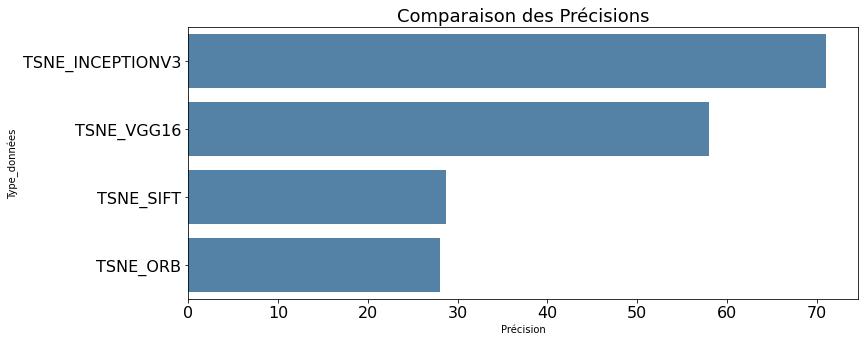

In [14]:
# Visualisation des précisions
df_comp_prec = df_comparaison.sort_values(by='Précision', ascending=False)
plt.figure(figsize=(12, 5))
sns.barplot(x=df_comp_prec['Précision'],
            y=df_comp_prec['Type_données'], color='SteelBlue')
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.title('Comparaison des Précisions', fontsize=18)
plt.show()

**Bilan** :
- Les algorithmes InceptionV3 (ARI=0.45 et 71% de précision) et VGG16 (ARI=0.30 et 58% de précision), sont les 2 algorithmes les plus performants sur les images et parviennent à classer les images en 7 catégories comme souhaité par le client.


# Combinaison données textuelles et données images

Le but est de combiner les matrices denses réduites des 2 meilleurs algorithmes des données textuelles et des données images :
- InceptionV3 (Images, ARI=0.46, Accuracy=0.71)
- Word2vec (textes, ARI=0.68, Accuracy=0.83) ou USE (textes, ARI=0.66, Accuracy=0.81)

**Concaténation des données textuelles et images**

In [4]:
# Chargement de la matrice dense réduite par TSNE des données :
# textuelles produit specification originales non nettoyées
with open('sauvegarde pickle/df_tsne_doc2v_prod_orig.pickle', 'rb') as vectors:
    df_tsne_doc2v_prod_orig = pickle.load(vectors)

In [5]:
# Chargement de la matrice dense réduite par TSNE des données :
# images InceptionV3
with open('sauvegarde pickle/df_tsne_incep.pickle', 'rb') as vectors:
    df_tsne_incep = pickle.load(vectors)

In [9]:
# Concaténation des matrices denses réduites des données textuelles etdes images
df_tsne = pd.concat([df_tsne_doc2v_prod_orig[cols], df_tsne_incep[cols]],
                    axis=1, ignore_index=True)

**ÉTAPE 2 - Réduction de dimension**

In [97]:
type_donnee = 'TSNE_COMBI_doc2v_INCEPTIONV3'

In [13]:
# t-SNE tuning du paramètre perplexity sans initialisation PCA
top_depart = time.time()
liste_param = [20, 30, 40, 50, 70, 80]
results_combi = list()
tsne_results_combi = []
for i in liste_param:
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=500,
                random_state=seed)
    tsne_results_combi = \
        tsne.fit_transform(df_tsne)
    results_combi.append(tsne_results_combi)
print('t-SNE terminée! en : {} seconds'.format(time.time()-top_depart))

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.016s...
[t-SNE] Computed neighbors for 1050 samples in 0.016s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 4.541597
[t-SNE] KL divergence after 250 iterations with early exaggeration: 56.925575
[t-SNE] KL divergence after 500 iterations: 0.472929
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.000s...
[t-SNE] Computed neighbors for 1050 samples in 0.018s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 5.588784
[t-SNE] KL divergence after 250 iterations with early exaggeration: 54.731888
[t-SNE] KL divergence after 500 iterations: 0.434679
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.000s...
[t-SNE] Computed neighbors for 1050 samples in 0.

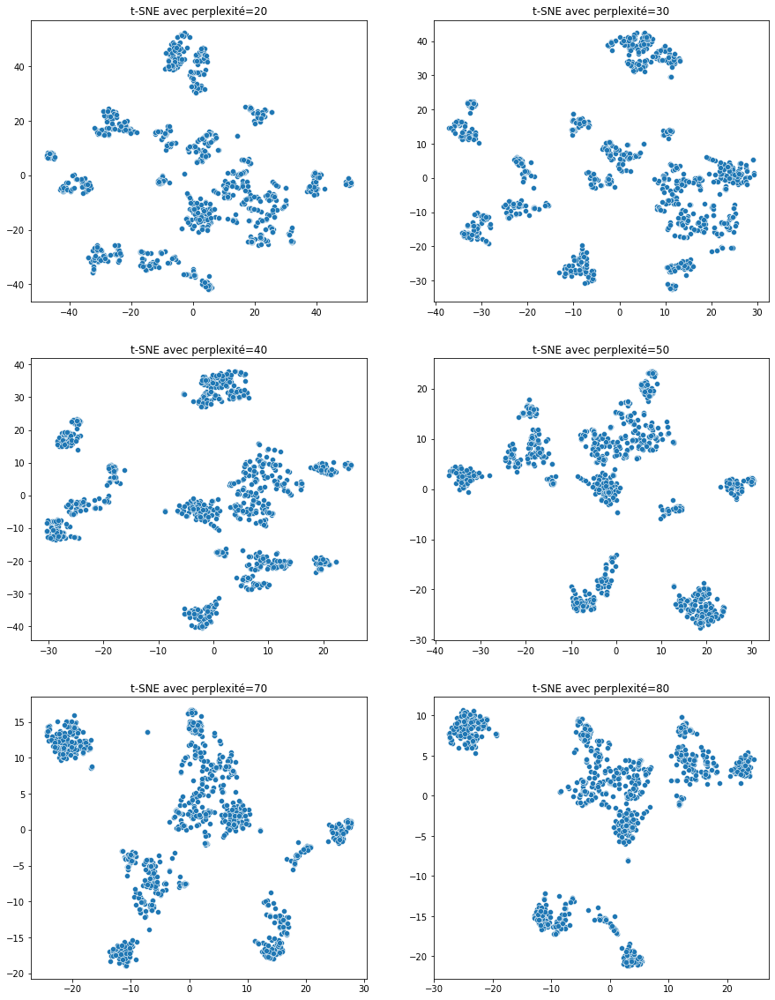

In [98]:
# Visualisation en 2D des différents résultats selon la perplexité
outils_segmentation.affiche_tsne(results_combi, liste_param, 1)

- groupes plus homogènes pour perplexité=40
- on laissera les paramètres learning_rate et n_iter à 5000 et le nombre de composants par défaut (2).

In [99]:
# Réduction de dimension tsne
tsne_combi = TSNE(verbose=1, perplexity=40, n_iter=5000)
X_proj_tsne_combi = \
    tsne_combi.fit_transform(df_tsne)
# Dataframe pour clustering
df_tsne_combi = pd.DataFrame({'VAR1' : X_proj_tsne_combi[:, 0],
                              'VAR2' : X_proj_tsne_combi[:, 1],
                              'CATEGORIE' : df_incep_bovw['Categorie_1'],
                              'IMAGE': df_incep_bovw['image'],
                              'IMAGE_LOC': df_incep_bovw['image_loc']})

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.000s...
[t-SNE] Computed neighbors for 1050 samples in 0.016s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 6.489788
[t-SNE] KL divergence after 250 iterations with early exaggeration: 52.774773
[t-SNE] KL divergence after 4650 iterations: 0.382040


**Clustering**

In [100]:
cols = ['VAR1', 'VAR2']

In [109]:
# Tuning hyperparametres n_init, max_iter
# Paramètres à tester
n_init = [10, 20, 30, 50, 70, 80, 100]
max_iter = [100, 200, 300, 400, 500]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_clust =  outils_nlp.calcul_metrics_kmeans(df_tsne_combi[cols],
                                     df_metrics_clust,
                                     type_donnee,
                                     seed, n_init, max_iter)

# Tri par indice de dispersion : proche de 0
df_metrics_clust[df_metrics_clust['Type_données'] == type_donnee] \
    .sort_values(by=['coef_silh', 'davies_bouldin', 'Durée (s)'],
                 ascending=[False, True, True]).style.hide_index()

Type_données,Param_k,dispersion,Durée (s),n_init,max_iter,coef_silh,davies_bouldin
TSNE_COMBI_doc2v_INCEPTIONV3,nan,48132.656250,0.120285,10.000000,200.000000,0.648643,0.490007
TSNE_COMBI_doc2v_INCEPTIONV3,nan,48132.664062,0.120295,10.000000,400.000000,0.648643,0.490007
TSNE_COMBI_doc2v_INCEPTIONV3,nan,48132.664062,0.120322,10.000000,500.000000,0.648643,0.490007
TSNE_COMBI_doc2v_INCEPTIONV3,nan,48132.656250,0.120362,10.000000,300.000000,0.648643,0.490007
TSNE_COMBI_doc2v_INCEPTIONV3,nan,48132.656250,0.150363,20.000000,500.000000,0.648643,0.490007
TSNE_COMBI_doc2v_INCEPTIONV3,nan,48132.664062,0.150366,20.000000,100.000000,0.648643,0.490007
TSNE_COMBI_doc2v_INCEPTIONV3,nan,48132.664062,0.150374,20.000000,200.000000,0.648643,0.490007
TSNE_COMBI_doc2v_INCEPTIONV3,nan,48132.656250,0.150415,20.000000,400.000000,0.648643,0.490007
TSNE_COMBI_doc2v_INCEPTIONV3,nan,48132.660156,0.150423,20.000000,300.000000,0.648643,0.490007
TSNE_COMBI_doc2v_INCEPTIONV3,nan,48132.656250,0.180439,30.000000,100.000000,0.648643,0.490007


In [110]:
# Instanciation du modèle KMeans avec les meilleurs paramètres
kmeans_tsne_combi = KMeans(n_clusters=7, init='k-means++',
                           n_init=10, max_iter=400,
                           random_state=seed) \
    .fit(df_tsne_combi[cols])
# Ajout de l'assignation du cluster au dataframe
df_tsne_combi['Clusters'] = kmeans_tsne_combi.labels_
kmeans_tsne_combi_labels = kmeans_tsne_combi.labels_

In [111]:
# Scores ?
df_scores = outils_nlp.calcul_metriques_clusters(df_tsne_combi,
                                                 df_scores,
                                                 type_donnee)
df_scores[df_scores['Type_données'] == type_donnee].style.hide_index()

Type_données,ARI,Homogénéité,Complétude,V-measure
TSNE_COMBI_doc2v_INCEPTIONV3,0.574287,0.658540,0.676004,0.667157


In [133]:
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_scores, 'Sauvegarde des résultats/IMAGES_data_df_scores.csv')

Clusters,Nombre,%
0,199,18.950000
1,151,14.380000
2,177,16.860000
3,179,17.050000
4,80,7.620000
5,181,17.240000
6,83,7.900000


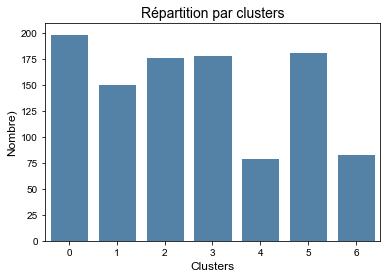

In [113]:
outils_nlp.affiche_repartition_par_clusters(kmeans_tsne_combi_labels)

In [114]:
# Les catégories par clusters
df_tsne_combi.groupby('Clusters')['CATEGORIE'].value_counts(). \
    to_frame()

CATEGORIE
Clusters CATEGORIE                            
0        Home Decor & Festive Needs        114
         Beauty and Personal Care           26
         Baby Care                          23
         Computers                          18
         Kitchen & Dining                   10
         Home Furnishing                     8
1        Watches                           150
         Computers                           1
2        Home Furnishing                   140
         Baby Care                          36
         Beauty and Personal Care            1
3        Beauty and Personal Care          122
         Kitchen & Dining                   42
         Baby Care                           7
         Home Decor & Festive Needs          5
         Computers                           3
4        Kitchen & Dining                   79
         Baby Care                           1
5        Computers                         128
         Home Decor & Festive Needs         31
         Kitchen & Dining                   19
         Baby Care                           2
         Beauty and Personal Care            1
6        Baby Care                          81
         Home Furnishing                     2

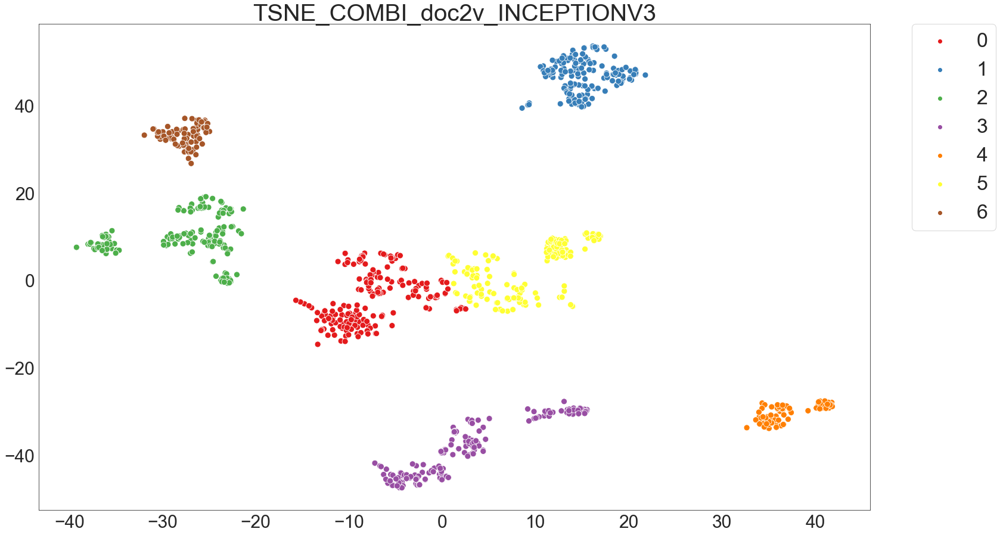

In [115]:
# Visualisation des clusters
outils_nlp.affiche_projection_par_clusters(X_proj_tsne_combi,
                                           kmeans_tsne_combi_labels,
                                           type_donnee)

**Bilan** :
***
- Le score ARI est assez haut (0.60).
- Cette combinaison TSNE Combinaison données textuelles produits spécifications lemmatisés avec USE5 et données image avec InceptionV3 sur les images parvient à retrouver les 7 catégories comme le souhaite notre client avec une précision de 79%. 

**Qualité de la catégorisation ?**

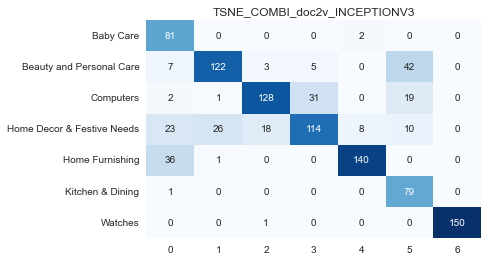

'Précision: 77.52%'

In [116]:
dico_categories = {'3': 'Beauty and Personal Care',
                   '5': 'Computers',
                   '1': 'Watches',
                   '4': 'Kitchen & Dining',
                   '0': 'Home Decor & Festive Needs',
                   '6': 'Baby Care',
                   '2': 'Home Furnishing'}
outils_nlp.affiche_qualite_categorisation(df_tsne_combi,
                                          dico_categories, type_donnee)

In [134]:
# Sauvegarde des précisions de la catégorisation
df_precision = outils_nlp.sauvegarde_precision(df_precision, '77.5',
                                               type_donnee)
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_precision, 'Sauvegarde des résultats/IMAGES_data_df_precision.csv')

**Erreurs**

In [119]:
# Nombre d'erreur
mask = df_tsne_combi['CATEGORIE'] == df_tsne_combi['Cluster_labels']
df_erreur_combi = df_tsne_combi[~mask]
display(f'Nombre d\'erreurs : {df_erreur_combi.shape[0]}')

"Nombre d'erreurs : 236"

**Répartition des erreurs par catégorie**

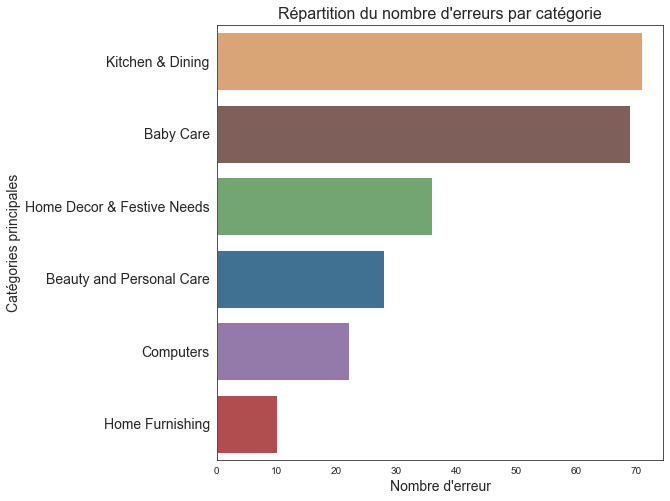

In [120]:
# Répartition des erreurs par catégorie
plt.figure(figsize=(8, 8))
sns.countplot(y='CATEGORIE', data=df_erreur_combi, orient='h',
              order=df_erreur_combi['CATEGORIE'].value_counts().index,
              palette=['#e9a467', '#845b53', '#6bad6b', '#3274a1',
                       '#9372b2', '#c03d3e'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=16)
plt.xlabel('Nombre d\'erreur', fontsize=14)
plt.ylabel('Catégories principales', fontsize=14)
plt.yticks(fontsize=14)
plt.show()

**Répartition des erreurs des catégories par catégorie**

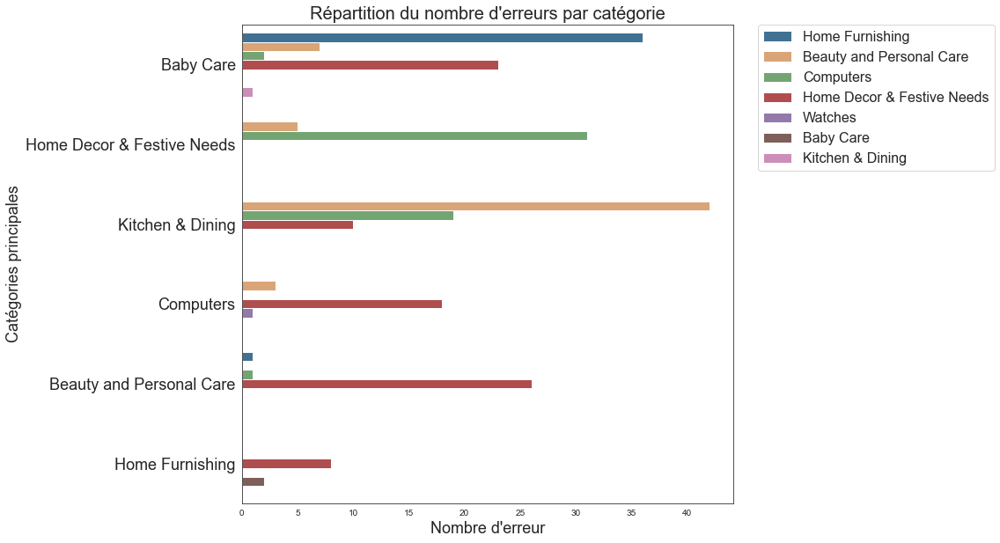

In [121]:
# Répartition des erreurs des catégories par catégorie
plt.figure(figsize=(10, 10))
sns.countplot(y='CATEGORIE', hue='Cluster_labels',
              data=df_erreur_combi, orient='h',
              palette=['#3274a1', '#e9a467', '#6bad6b', '#c03d3e',
                       '#9372b2', '#845b53', '#d684bd'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=20)
plt.xlabel('Nombre d\'erreur', fontsize=18)
plt.ylabel('Catégories principales', fontsize=18)
plt.yticks(fontsize=18)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=16)
plt.show()

**Exemple d'erreurs**

In [122]:
def path_to_image_photo_html(path):
    return '<img src="' + path + ' " width="100">'

In [123]:
df_visu_erreur_combi = df_erreur_combi[['CATEGORIE', 'IMAGE_LOC',
                                        'Cluster_labels']].sample(10)
display(HTML(
    df_visu_erreur_combi.
    to_html(escape=False,
            formatters=dict(IMAGE_LOC=path_to_image_photo_html))))

,CATEGORIE,IMAGE_LOC,Cluster_labels
608,Beauty and Personal Care,,Home Decor & Festive Needs
606,Beauty and Personal Care,,Home Decor & Festive Needs
944,Home Decor & Festive Needs,,Computers
114,Baby Care,,Home Furnishing
771,Baby Care,,Home Furnishing
281,Home Furnishing,,Home Decor & Festive Needs
765,Kitchen & Dining,,Beauty and Personal Care
295,Kitchen & Dining,,Home Decor & Festive Needs
1038,Beauty and Personal Care,,Home Furnishing
244,Kitchen & Dining,,Beauty and Personal Care


# Bilan Final

## Comparaison des scores ARI/précisions - TEXTES / IMAGES / COMBINAISON

**Données Textuelles**

In [151]:
# Chargement des données de sauvegarde des résultats des scores KMeans
df_scores_textes = pd.read_csv('Sauvegarde des résultats/data_df_scores.csv')
df_scores_textes.shape

(60, 5)

In [152]:
# Ajout du type TEXTE
df_scores_textes['TYPE'] = 'TEXTE'

In [153]:
# Chargement des données de sauvegarde des résultats des précisions de la
# catégorisation
df_precision_textes = pd.read_csv('Sauvegarde des résultats/data_df_precision.csv')
df_precision_textes.shape

(57, 2)

**Données images**

In [154]:
# Chargement des dataframes de sauvegarde des scores
df_scores_img = pd.read_csv('Sauvegarde des résultats/IMAGES_data_df_scores.csv')
df_scores_img.shape
#df_scores_img=df_scores_img.drop([13])

(6, 5)

In [161]:
# Ajout du type IMAGE
df_scores_img['TYPE'] = 'IMAGE'
# Ajout du type COMBINAISON
df_scores_img.loc[5, 'TYPE'] = 'COMBINAISON'

In [164]:
df_scores_img

,Type_données,ARI,Homogénéité,Complétude,V-measure,TYPE
0,object,object,object,object,object,IMAGE
1,TSNE_SIFT,0.0478097970860437,0.08201622197347475,0.08664608605481802,0.08426760798047027,IMAGE
2,TSNE_ORB,0.041030722702964685,0.06393412414151402,0.06512907084321903,0.06452606571539445,IMAGE
3,TSNE_VGG16,0.30294322987881156,0.4241208248736065,0.43607259061233783,0.4300136771700208,IMAGE
4,TSNE_INCEPTIONV3,0.4593765100453368,0.5242602818055832,0.5307699844726812,0.5274950501945151,IMAGE
5,TSNE_COMBI_doc2v_INCEPTIONV3,0.5742872776695492,0.6585397109736975,0.6760036241805766,0.6671574006753198,COMBINAISON


In [165]:
# Chargement des dataframes de sauvegarde des précisions
df_precision_img = pd.read_csv('Sauvegarde des résultats/IMAGES_data_df_precision.csv')
df_precision_img.shape

(6, 2)

**Données textes + images**

In [166]:
# Concaténation des 2 dataframes de précision textes + images
df_precision = pd.concat([df_precision_textes, df_precision_img])
df_precision.shape

# Concaténation des 2 dataframes de scores textes + images
df_scores = pd.concat([df_scores_textes, df_scores_img])
df_scores.shape

(66, 6)

**Comparaison des ARI textes et images**

In [167]:
# Dataframe de comparaison des scores ARI et de la précision
df_comparaison = df_scores.merge(df_precision, on='Type_données',how='left')
#df_comparaison=df_comparaison.drop([0,1,2,3,4,5,15,70,71,72,77])

In [168]:
df_comparaison

,Type_données,ARI,Homogénéité,Complétude,V-measure,TYPE,Précision
0,object,object,object,object,object,TEXTE,object
1,object,object,object,object,object,TEXTE,object
2,object,object,object,object,object,TEXTE,object
3,object,float64,float64,float64,float64,TEXTE,object
4,object,float64,float64,float64,float64,TEXTE,object
5,object,float64,float64,float64,float64,TEXTE,object
6,ACP_CV_DESC_LEM,0.03867851320769776,0.11763099550311613,0.20871561609112455,0.1504622681872421,TEXTE,0
7,ACP_CV_DESC_STEM,0.04494105033650826,0.1195757329769907,0.1978508396716902,0.14906224753930497,TEXTE,0
8,ACP_CV_PROD_SP_LEM,0.10498943170683984,0.25956333517675256,0.5800220891201925,0.3586352587154426,TEXTE,0
9,ACP_CV_PROD_SP_STEM,0.10014879668768888,0.25416713608389785,0.5794044467400026,0.353336346623738,TEXTE,0


In [169]:
#Suppresion de toutes les lignes avec NaN ou des objets..
df_comparaison=df_comparaison.drop([0,1,2,3,4,5,15,70,71,72])

In [170]:
# Supprime la ligne des types d'objet
df_comparaison['ARI'] = df_comparaison['ARI'].astype(float)
df_comparaison['Précision'] = df_comparaison['Précision'].astype(float)

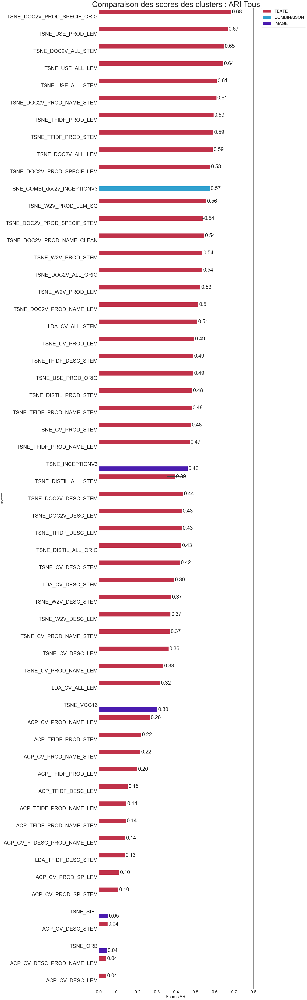

In [171]:
# Comparaison visuelle des algorithmes score ARI Textes + Images
df_comp_sort = df_comparaison.sort_values(by='ARI', ascending=False)
comparaison_score_melt = pd.melt(df_comp_sort, id_vars=['Type_données',
                                                        'TYPE'],
                                 value_name='score',
                                 value_vars=['ARI'])
# Visualisation
fig, ax = plt.subplots(1, 1, figsize=(25, 80))

ax = sns.barplot(y=comparaison_score_melt['Type_données'],
                 x=comparaison_score_melt['score'],
                 hue=comparaison_score_melt['TYPE'],
                 palette=['#d71b3b', '#16acea', '#4203c9'])
ax.set_title('Comparaison des scores des clusters : ARI Tous', fontsize=45)
for p in ax.patches:
    ax.annotate('%.2f' % p.get_width(), xy=(p.get_width(),
                                            p.get_y()+p.get_height()/2),
                xytext=(5, 0), textcoords='offset points',
                ha='left', va='center', fontsize=30)

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=24)
plt.xticks(fontsize=24)
plt.yticks(fontsize=30)
plt.xlim(0, 0.8)
plt.xlabel('Scores ARI', fontsize=24)

fig.tight_layout()

plt.show()

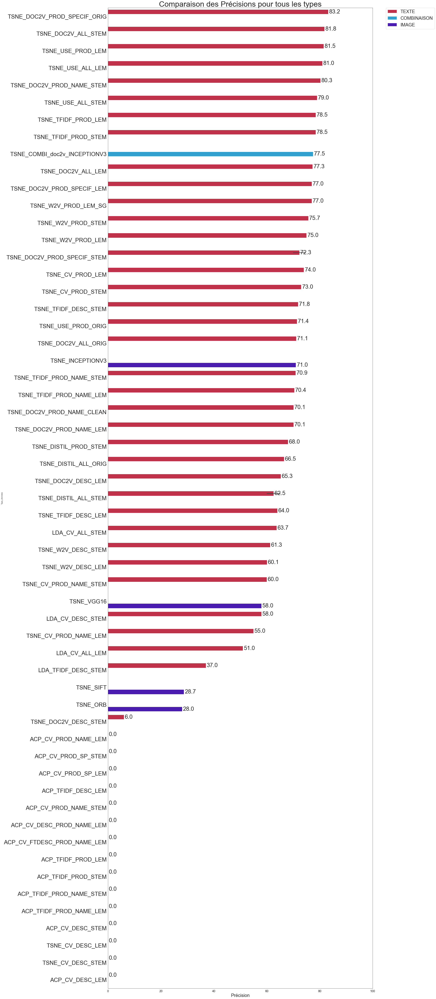

In [172]:
# Visualisation des précisions pour toutes les variables
df_comp_prec = df_comparaison.sort_values(by='Précision', ascending=False)

fig, ax = plt.subplots(1, 1, figsize=(25, 95))

ax = sns.barplot(x=df_comp_prec['Précision'], y=df_comp_prec['Type_données'],
                 hue=df_comp_prec['TYPE'],
                 palette=['#d71b3b', '#16acea', '#4203c9'])
plt.xticks(fontsize=16)
plt.yticks(fontsize=30)
plt.title('Comparaison des Précisions pour tous les types', fontsize=40)

for p in ax.patches:
    ax.annotate('%.1f' % p.get_width(), xy=(p.get_width(),
                                            p.get_y()+p.get_height()/2),
                xytext=(5, 0), textcoords='offset points',
                ha='left', va='center', fontsize=30)

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=24)
plt.xlim(0, 100)
plt.xlabel('Précision', fontsize=24)

plt.show()

##  Comparaison des scores ARI/précisions - Top 5 TEXTES/IMAGES et la COMBINAISON

**Préparation des données**

***Données textuelles***

In [173]:
# Top 5 des scores ARI données textuelles
df_scores_textes_top5 = df_scores_textes.sort_values(by='ARI',
                                                     ascending=False)[0:5]

In [174]:
liste_top5_textes = df_scores_textes_top5['Type_données'].to_list()

In [175]:
# Top 5 des scores ARI données textuelles
df_precision_textes_top5 = \
    df_precision[df_precision['Type_données'].isin(liste_top5_textes)]

In [176]:
df_top5_textes = df_scores_textes_top5.merge(df_precision_textes_top5,
                                             on='Type_données', how='left')
df_top5_textes

In [193]:
#Suppréssion des lignes avec des objets
df_top5_textes=df_top5_textes.drop([0,1,2,3,4,5])

***Données images***

In [177]:
# Top 5 des scores ARI données images
df_scores_img_top5 = df_scores_img[0:-1].sort_values(by='ARI',
                                                     ascending=False)[0:5]

In [178]:
liste_top5_img = df_scores_img_top5['Type_données'].to_list()

In [179]:
# Top 5 des scores ARI données images
df_precision_img_top5 = \
    df_precision[df_precision['Type_données'].isin(liste_top5_img)]

In [194]:
df_top5_img = df_scores_img_top5.merge(df_precision_img_top5,
                                       on='Type_données', how='left')
df_top5_img

,Type_données,ARI,Homogénéité,Complétude,V-measure,TYPE,Précision
0,object,object,object,object,object,IMAGE,object
1,object,object,object,object,object,IMAGE,object
2,object,object,object,object,object,IMAGE,object
3,TSNE_INCEPTIONV3,0.4593765100453368,0.5242602818055832,0.5307699844726812,0.5274950501945151,IMAGE,71
4,TSNE_VGG16,0.30294322987881156,0.4241208248736065,0.43607259061233783,0.4300136771700208,IMAGE,58
5,TSNE_SIFT,0.0478097970860437,0.08201622197347475,0.08664608605481802,0.08426760798047027,IMAGE,28.67
6,TSNE_ORB,0.041030722702964685,0.06393412414151402,0.06512907084321903,0.06452606571539445,IMAGE,28


In [195]:
df_top5_img=df_top5_img.drop([0,1,2])

***Combinaison textes + images***

In [182]:
# Récupération du score ARI de la combinaison TEXTE + IMAGE
df_scores_combi = df_scores_img.tail(1)

In [183]:
# Top 5 des scores ARI données images
df_precision_combi = \
    df_precision[df_precision['Type_données'] == 'TSNE_COMBI_USE5_INCEPTIONV3']

In [196]:
df_combi = df_scores_combi.merge(df_precision_combi, on='Type_données',
                                 how='left')
df_combi

,Type_données,ARI,Homogénéité,Complétude,V-measure,TYPE,Précision
0,TSNE_COMBI_doc2v_INCEPTIONV3,0.5742872776695492,0.6585397109736975,0.6760036241805766,0.6671574006753198,COMBINAISON,NaN


In [197]:
df_combi.loc[0, 'Précision'] = '77.3'

**Comparaison des scores ARI**

In [198]:
# Dataframe de comparaison des scores ARI et de la précision
df_comparaison_top = pd.concat([df_top5_textes, df_top5_img, df_combi])
df_comparaison_top


,Type_données,ARI,Homogénéité,Complétude,V-measure,TYPE,Précision
6,TSNE_DOC2V_PROD_SPECIF_ORIG,0.6845065059910753,0.7296493483518357,0.734274706391211,0.7319547203199988,TEXTE,83.2
7,TSNE_USE_PROD_LEM,0.6668052433342032,0.7099580895094605,0.711927407770426,0.7109413848823058,TEXTE,81.5
8,TSNE_DOC2V_ALL_STEM,0.6469004475929867,0.6915936176278523,0.697189400575193,0.6943802356389358,TEXTE,81.8
3,TSNE_INCEPTIONV3,0.4593765100453368,0.5242602818055832,0.5307699844726812,0.5274950501945151,IMAGE,71
4,TSNE_VGG16,0.30294322987881156,0.4241208248736065,0.43607259061233783,0.4300136771700208,IMAGE,58
5,TSNE_SIFT,0.0478097970860437,0.08201622197347475,0.08664608605481802,0.08426760798047027,IMAGE,28.67
6,TSNE_ORB,0.041030722702964685,0.06393412414151402,0.06512907084321903,0.06452606571539445,IMAGE,28
0,TSNE_COMBI_doc2v_INCEPTIONV3,0.5742872776695492,0.6585397109736975,0.6760036241805766,0.6671574006753198,COMBINAISON,77.3


In [199]:
# Supprime la ligne des types d'objet
df_comparaison_top['ARI'] = df_comparaison_top['ARI'].astype(float)
df_comparaison_top['Précision'] = df_comparaison_top['Précision'].astype(float)

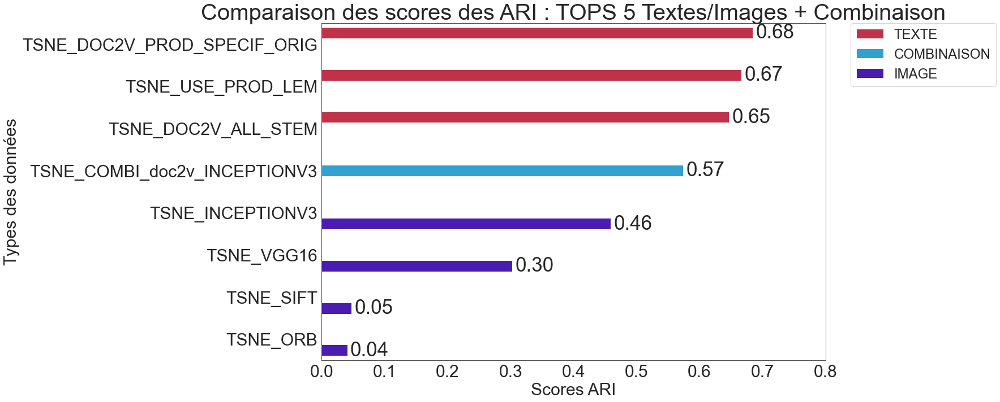

In [200]:
# Comparaison visuelle des algorithmes score ARI Textes + Images
df_comp_top_sort = df_comparaison_top.sort_values(by='ARI', ascending=False)
comparaison_top_score_melt = pd.melt(df_comp_top_sort,
                                     id_vars=['Type_données', 'TYPE'],
                                     value_name='score',
                                     value_vars=['ARI'])
# Visualisation
fig, ax = plt.subplots(1, 1, figsize=(25, 10))

ax = sns.barplot(y=comparaison_top_score_melt['Type_données'],
                 x=comparaison_top_score_melt['score'],
                 hue=comparaison_top_score_melt['TYPE'],
                 palette=['#d71b3b', '#16acea', '#4203c9'])
titre = 'Comparaison des scores des ARI : TOPS 5 Textes/Images + Combinaison'
ax.set_title(titre,
             fontsize=40)
for p in ax.patches:
    ax.annotate('%.2f' % p.get_width(), xy=(p.get_width(),
                                            p.get_y()+p.get_height()/2),
                xytext=(5, 0), textcoords='offset points',
                ha='left', va='center', fontsize=35)

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=24)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.xlim(0, 0.8)
plt.xlabel('Scores ARI', fontsize=30)
plt.ylabel('Types des données', fontsize=30)

fig.tight_layout()

plt.show()

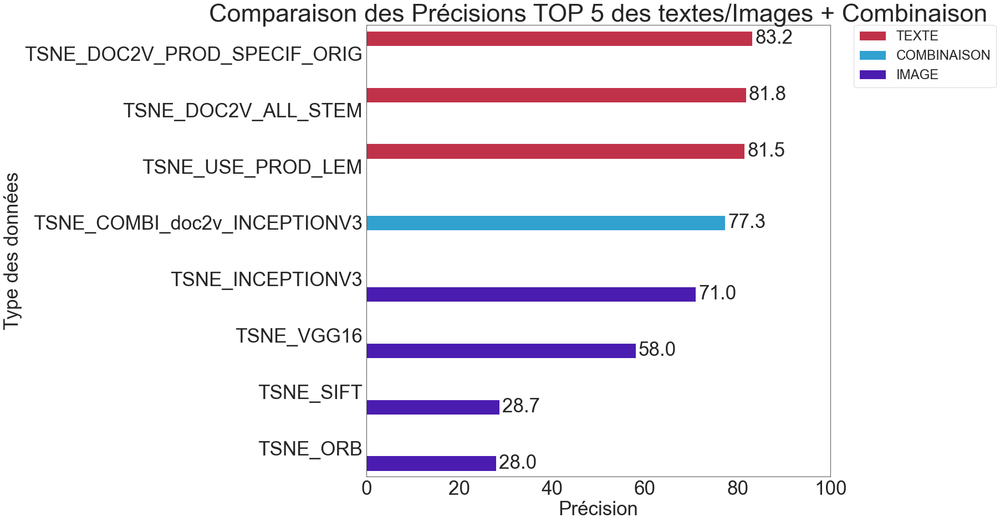

In [201]:
# Visualisation des précisions tops 5 textes/images + combinaison
df_comp_top_prec = df_comparaison_top.sort_values(by='Précision',
                                                  ascending=False)

fig, ax = plt.subplots(1, 1, figsize=(15, 15))

ax = sns.barplot(x=df_comp_top_prec['Précision'],
                 y=df_comp_top_prec['Type_données'],
                 hue=df_comp_top_prec['TYPE'],
                 palette=['#d71b3b', '#16acea', '#4203c9'])
plt.xticks(fontsize=35)
plt.yticks(fontsize=35)
titre = 'Comparaison des Précisions TOP 5 des textes/Images + Combinaison'
plt.title(titre, fontsize=45)

for p in ax.patches:
    ax.annotate('%.1f' % p.get_width(), xy=(p.get_width(),
                                            p.get_y()+p.get_height()/2),
                xytext=(5, 0), textcoords='offset points',
                ha='left', va='center', fontsize=35)

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=24)
plt.xlim(0, 100)
plt.xlabel('Précision', fontsize=35)
plt.ylabel('Type des données', fontsize=35)

plt.show()

**On remarque la combinaison entre Texte et Image donne des résultats intermédiaires entre Texte seul et Image seule.**